<a href="https://colab.research.google.com/github/JoDeMiro/Micado-Research/blob/main/ML_Auto_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ToDo
letölteni a pythont és ott futtatni a kódot

huzzon egy nyomot a becslésre is, hogy lássam, hogy hova a faszomba becsüli az első modell
a mit is? ja igen a középtől való eltérést.

csinálni egy második modelt illetve kettőt

az egyik legyen a régi, de hagyjuk a faszba a fel-le becslést, az egész before aftert
és csak egyszerűen kössünk rá a becslésre valamilyen szabályt. Ha nagyobb mint x akkor +3

a másik verzió amit gyorsan ki kéne próbálni, hogy a linreg helyett beteszek egy mlp-t

**ToDo:**

Megnézni, hogy normalizálom-e az adatokat a neruális háló előtt, mert lehet hogy ez viszi félre a becslést.

# Micado Auto Scale Research

Ebben a felskálázási adatok elemzésével foglalkozom.

Ez az interkatív bemutató arra van, hogy a válotzók közötti összefüggéseket jobban átlásssam, elemezzem, az esetleges anomáliákat rögtön kiszúrjam.

A playground részben a rendszer alapját adó neuráli háló beállításaival lehet játszani és megfigyelni, hogy milyen hatással van a rendszer teljesítményére.

<a name="tartalom"></a>

## Tartalom

Bevezetés

> [Empty](#empty)<br>
> [Play Ground](#play_ground)<br>
> [SandBox](#sandbox)<br>
> [Before After](#beforeafter)<br>
> [Szintetikus adatok generálása](#szintetikus_adatok)<br>
> [Irodalom](#irodalom)<br>
> [ToDo](#todo)<br>


## Bevezető gondolat

Összességében az egésszel kapcsolatban van egy hatalmas kérdőjel.

Tulajdonképpen két paradigma van.

Az egyik - nem az enyém - így néz ki:

Egyszerűen becsüjük meg azt, hogy az adott szenzoros adatok alapján mi legyen a döntés kimenetele (fel, le, semmi). Akkor hoztunk jó döntést, ha valamilyen metrika alapján valamilyen költséget minimalizáltunk, vagy maximalizáltunk. Például, ha egy döntéssel sikerült közelebb kerülni a záróvonalhoz, vagyis az út közepére. Vagy az az autó a lehető legmeszebb jutott el anélkül, hogy érintette volna a falat és lehetőleg a leggyorsabban is.

A másik - amin én dolgozom - viszont egy plusz lépéssel egészül ki és ettől sokkal bonyolultabb. Hogy van-e létjogosultsága az ennek a kisérletnek a lényege.

Vannak szenzoros adataink, ami alapján hozunk egy döntést. Eddig olyan mint a máisik, de az érdemi különbség a módszerben és a tanulás folyamatában van.

A szenzoros adatokból megbecsüljük azt, hogy mennyire vagyunk jók és nem azt becsüljük, hogy mit kéne tenni!

Ha nem vagyunk jók akkor egy második modell segítségével csinálunk valamilyen lépést, amitől azt várjuk, hogy jók leszünk.

És itt jogosan merül fel a kérdés, hogy de miért nem az első módszert alkalmazzuk és erre most még én sem tudom a választ pontosan megadni. De röviden erről szól ez a kutatás.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.neural_network import MLPRegressor

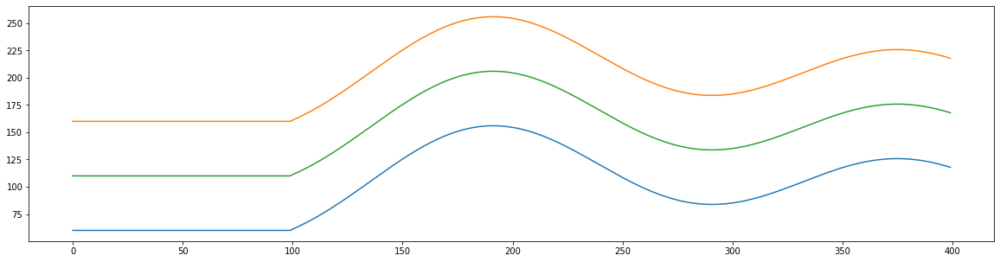

In [2]:
distance    = np.arange(0, 400, 1)
road        = 100
wall_left   = 30*(np.sin(distance/180)) + distance * 0.3 + 30 * np.cos(distance/30) + 50 * np.sin(distance/90)
wall_left[0:100] = 60
wall_right  = wall_left + road
wall_center = ( wall_left + wall_right ) / 2


plt.figure(figsize=(20,5)); plt.plot(wall_left); plt.plot(wall_right); plt.plot(wall_center); plt.show()

In [3]:
class Road():
  def __init__(self, wide):
    self.distance    = np.arange(0, 400, 1)
    self.wide        = wide
    self.wall_right  = 30*(np.sin(self.distance/180)) + self.distance * 0.3 + 30 * np.cos(self.distance/30) + 50 * np.sin(self.distance/90)
    self.wall_right[0:100] = 60
    self.wall_left   = self.wall_right + self.wide
    self.wall_center = ( self.wall_left + self.wall_right ) / 2

  def show(self):
    fig, ax = plt.subplots(figsize=(26,10)); ax.set_ylim(40, 300); ax.plot(self.wall_left); ax.plot(self.wall_right); ax.plot(self.wall_center);
    return fig, ax


In [4]:
class NeuralNetwork():
  def __init__(self):
    self.mlp = MLPRegressor(hidden_layer_sizes=(4,),
                           max_iter=1000,
                           activation='relu', # tanh, relu, logistic
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           n_iter_no_change=500,
                           random_state=1234)
    
    self.scaler_X = MinMaxScaler()
    self.scaler_y = MinMaxScaler()

In [5]:
class Car():
  def __init__(self, road, mlp):
    self.road = road
    self.x = 0
    self.y = self.road.wall_center[0]
    self.sight = 300           # ennyit lát előre

    self.y_history  = []
    self.x_history  = []
    self.y_center   = []; self.y_center = self.road.wall_center
    self.y_distance = []
    self.y_distance_real = []
    self.y_distance_predicted = []
    self.mlp        = mlp
    self.regression = LinearRegression()
    self.sensor_center = []
    self.sensor_left   = []
    self.sensor_right  = []
    self.before  = []
    self.after   = []


  def calculate_distances(self):
    # ha bármikor kevesebb a faltól mért távolsága bármelyik szenzoron akkor a szenzorokon mért távolság is ennyi lesz
    
    k = self.x; d = 0
    while(k < self.x + self.sight):
      k += 1; d += 1
      self.distance_center_from_wall = d
      if(int(self.road.wall_left[k]) < self.y):
        print('Sensor center = ', self.distance_center_from_wall)
        break
      if(int(self.road.wall_right[k]) > self.y):
        print('Sensor center = ', self.distance_center_from_wall)
        break

    k = self.x; d = 0
    while(k < self.x + self.sight):
      k += 1;  d += 1
      self.distance_left_from_wall = d
      if(int(self.road.wall_left[k]) < self.y + d):
        print('Sensor from left wall = ', self.distance_left_from_wall)
        break

    k = self.x; d = 0
    while(k < self.x + self.sight):
      k += 1; d += 1
      self.distance_right_from_wall = d
      if(int(self.road.wall_right[k]) > self.y - d):
        print('Sensor from right wall = ', self.distance_right_from_wall)
        break

    #ki kell kalkulálni a tényleges távolságot a ball és a jobb faltól
    # mert ezekre fogom tanítani a neurális hálót, ahol ezeket becsüljük
    # és a bemeneti változó a 3 szenzorból érkező adat lesz.
    # valójában azt mérjük, hogy milyen távolságra van az út közepétől

    self.distance_from_top     = abs(self.road.wall_left[self.x] - self.y)
    self.distance_from_bottom  = abs(self.road.wall_right[self.x] - self.y)
    print('most távolsagra van a felső faltól = ', self.distance_from_top)
    print('most távolsagra van az alsó faltól = ', self.distance_from_bottom)


    print('cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc')
    print('self.x                       = ', self.x)
    print('cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc')

    # mi lenne, ha mégis inkább a kettő hányadosát becsülném (1 ha egyenlő távolságra van)
    # vertical_distance_from_middle = self.road.wall_center[self.x] - self.y
    self.vertical_distance_from_middle = self.distance_from_top / self.distance_from_bottom

    print('ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa = ', self.vertical_distance_from_middle)


    # de elötte szeretnék még valamit leellenőrizni
    # ezeknek a hossza nem fog megeggyezni a tényleges futások számával, hanem több lesz (milyen jó lett volna erre egy teszt esetet írni és akkor test driven development lenne)

    print('\t\t\t ---------------- Teszt ----------------')
    print('\t\t\t len(self.y_distance)    = ', len(self.y_distance))
    print('\t\t\t len(self.sensor_left)   = ', len(self.sensor_left))
    print('\t\t\t len(self.sensor_center) = ', len(self.sensor_center))
    print('\t\t\t len(self.sensor_right)  = ', len(self.sensor_right))
    print('\t\t\t self.x                  = ', self.x)
    print('\t\t\t -------------- Teszt End --------------')


  def append(self):
    self.y_distance.append(self.vertical_distance_from_middle)

    self.sensor_left.append(self.distance_left_from_wall)
    self.sensor_center.append(self.distance_center_from_wall)
    self.sensor_right.append(self.distance_right_from_wall)

    print('\t\t\t ---------------- Append ----------------')
    print('\t\t\t len(self.y_distance)    = ', len(self.y_distance))
    print('\t\t\t len(self.sensor_left)   = ', len(self.sensor_left))
    print('\t\t\t len(self.sensor_center) = ', len(self.sensor_center))
    print('\t\t\t len(self.sensor_right)  = ', len(self.sensor_right))
    print('\t\t\t self.x                  = ', self.x)
    print('\t\t\t -------------- Append End --------------')


  def run(self):
    for i in range(0, 400, 1):
      print('# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------')
      _summary_mlp_prediction_was_taken = 0
      _summary_mlp_fit_was_taken = 0
      _summary_mesterseges_mozgatas = 0
      _summary_action_was_taken = 0

      self.x = i
      self.calculate_distances()
      # !!!
      self.append()
      # !!!
      if( i % 1 == 0):
        self.plot()
      if( i >= 0 ):
        if( i % 3 == 0 and i >= 12 ):
          print('------------------------------ IF i % 3 == 0 ------------------------------')
          print('# i = ', i)
          print('# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)')
          X = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
          y = np.array([self.y_distance]).T
          print('X.shape = ', X.shape)
          print('y.shape = ', y.shape)
          print('X       = ', X)
          print('y       = ', y)
          print('i       = ', i)
          self.regression.fit(X, y)
          print('\t\t ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------')
          self.mlp.scaler_X.fit(X)
          X = self.mlp.scaler_X.transform(X)
          # self.mlp.scaler_y.fit(y)
          # y = self.mlp.scaler_y.transform(y)
          print('-------------- after scaler fit transform assagine --------------------')
          print('X       = ', X)
          print('y       = ', y)

          self.mlp.mlp.fit(X, y)
          _summary_mlp_fit_was_taken = 1
        if( i % 3 == 1 and i >= 12 ):
          print('------------------------------ IF i % 3 == 1 ------------------------------')
          print('# i = ', i)
          print('# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja')
          X = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
          _X = np.array([X[-1,:].reshape(-1,1)])
          _X = np.array([X[-1,:]])
          print('actual _X = ', _X)
          predicted = self.regression.predict(_X)
          print('\t\t ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------')
          _X = self.mlp.scaler_X.transform(_X)
          print('actual _X = ', _X)
          predicted = self.mlp.mlp.predict(_X)
          _summary_mlp_prediction_was_taken = 1
#most
          self.y_distance_real.append(self.y_distance[-1])
          self.y_distance_predicted.append(predicted)
          print('actual predicted = ', predicted)
          # print('actual predicted = {:.5f}'.format(predicted[0,0]))
          print('actual self.y_distance[-1] = ', self.y_distance[-1])
          print('actual self.y_distance     = ', self.y_distance)

          print(len(self.y_distance_real))
          print(len(self.y_distance_predicted))

          # olyan szar a becslés, hogy az hihetetlen
          plt.figure(figsize=(12, 5)); plt.scatter(self.y_distance_real, self.y_distance_predicted); plt.show()


        # most jön az, hogy véletlenszerűen kell egyet ugrania fel, vagy le
        # ez felel meg a before after dologonak
        # az így létrejött adatokat is el kell tárolni úgy mint
        # mi volt a szezoros adat before
        # mi lett a szenzoros adat after
        # mi volt az y before, mi lett az y after
        # mivel mindíg egyet fogunk csak lépni, ezért a dif mindíg egy lesz
        # de ezt számítani kell, mivel a későbbiek folyamán lehet, hogy többet is fog lépni

        if( i % 3 == 2 ):

          print('------------------------------ IF i % 3 == 2 ------------------------------')
          print('# i = ', i)
          print('# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok')

          _summary_mesterseges_mozgatas = 1
          
          if( i % 2 == 0 ):                           # Minden második lépésben fel (valójában minden 6-ik lépésben)
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y + 1
            print('artificial move -> up')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
          if( i % 2 == 1 ):                           # Minden második lépésben le (valójában minden 6-ik lépésben)
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y - 1
            print('artificial move -> down')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))

          print('self.y = ', self.y)



# itt van egy érdekesség amit csak magamnak írok fel
# ezen a ponton lépünk ki a három if ágból - if( i % 3 == _ )

# ez azért fontos, mert ami itt következik az mindíg lefut
# akár volt neurális háló tanítás
# akár volt neurális háló predikció visszamérése
# akár volt mesterséges mozgatás


# felmerül a kérdés de csak felmerül, hogy nem lehet-e az, hogy ezt csak akkor kéne elvégezni amikor nincs neurális háló tanítás és nincs mesterséges mozgatás sem
# ezt csak egy kísérlet ereéig ki kéne próbálni (if i % 3 == 1) -> vagyis amikor az nn predikció mérése történik

        if( len(self.before) > 9 ):           # ha már van néhány before after adatunk, akkor

          print('------------------------------ IF len(self.before) > 9 ------------------------------')
          print('\n')
          print('# i = ', i)
          print('  Ha már van elég before after adatunk')
          print('# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára')
          # minden egyes szezor adatára el kell készítenünk azt a lineráis regressziós modelt ami megmondja, hogy mi lenne a szenzor értéke, ha 1, 2, 3, ... n lépéssel elvinnénk a kocsit

          # oké megvan a before és megvan az after (self.y, left, center, right)
          before_array = np.array(self.before)
          after_array  = np.array(self.after)
          y_delta = after_array[:,0] - before_array[:,0]
          delta_array = after_array - before_array
          print('--------------------------------------')
          print(y_delta)
          print(before_array.shape)
          print(after_array.shape)
          print(self.before)
          print(self.after)
          print(delta_array)
          print('--------------------------------------')

          # képlet szerint senzor' = w0 + w1 * senzor + w2 * delta_y
          # valójában ez a képlet nem jó és nem így kéne számolni, mert ez figyelembe veszi a szenzor aktuális értékét is, de most így hagyom
          # ------- fenti sort nem tudom miért írtam, hogy baj az ha figyelembe veszük az aktuális értéket is, hm.

          print('# Linear Regression Learning --------------------------------------------------------------------------------------')
          print('\t\t # Linear Regression Training Results -------------------------------------------------------------------------')

          _X_left = np.array([before_array[:,1], delta_array[:,0]]).T # left és delta_y
# ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
          _y_left = delta_array[:,1].reshape(-1, 1)
# itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
          _y_left = after = after_array[:,1].reshape(-1, 1)
          regression_left = LinearRegression()
          regression_left.fit(_X_left, _y_left)
          print('\t\t _X_left = ', _X_left)
          print('\t\t _y_left = ', _y_left)
          print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
          print('\t\t regression_left.coef_ = ', regression_left.coef_)
          _predicted_left = regression_left.predict(_X_left)
          plt.scatter(_y_left, _predicted_left)
          plt.show()

          _X_center = np.array([before_array[:,2], delta_array[:,0]]).T # center és delta_y
# ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
          _y_center = delta_array[:,2].reshape(-1, 1)
# itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
          _y_center = after_array[:,2].reshape(-1, 1)
          regression_center = LinearRegression()
          regression_center.fit(_X_center, _y_center)
          print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
          print('\t\t regression_center.coef_ = ', regression_center.coef_)
          _predicted_center = regression_center.predict(_X_center)
          plt.scatter(_y_center, _predicted_center)
          plt.show()

          _X_right = np.array([before_array[:,3], delta_array[:,0]]).T # right és delta_y
# ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
          _y_right = delta_array[:,3].reshape(-1, 1)
# itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
          _y_right = after_array[:,3].reshape(-1, 1)
          regression_right = LinearRegression()
          regression_right.fit(_X_right, _y_right)
          print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
          print('\t\t regression_right.coef_ = ', regression_right.coef_)
          _predicted_right = regression_right.predict(_X_right)
          plt.scatter(_y_right, _predicted_right)
          plt.show()

          # most ki kell számolni, hogy mennyi lenne a szenzorok értéke, ha fel le lépkednénk

          # mondjuk maximalizáljuk a fel le lépkedés mértékét 5-ben

          move = np.array([-5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5])

          move = np.array([-2, -1, 0, 1, 2])

          move = np.array([-3, -2, -1, 0, 1, 2, 3])

# most


          print('\t # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------')

          print('\t\t # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke')
          proba_X_metrika   = np.array([1,1]).reshape(1, -1)
          print('proba_X_metrika   = ', proba_X_metrika)
          predicted_proba_left = regression_left.predict(proba_X_metrika)
          predicted_proba_center = regression_center.predict(proba_X_metrika)
          predicted_proba_right = regression_right.predict(proba_X_metrika)
          print('-------- 1 y up ->  left   = ', predicted_proba_left)
          print('-------- 1 y up ->  center = ', predicted_proba_center)
          print('-------- 1 y up ->  right  = ', predicted_proba_right)
          print('\n')
          
          action = 0; tmp = 999999990

          for j in move:
            print('\n')
            print('\t\t minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba')
            print('\t\t j = ', j)
            # ide be kell helyettesítenem az éppen aktuális értéket, olyan mintha egy új X változót csinálnék amiben csak egy sor van és arra kérnék egy becslést a korábbi modell alapján
            # a bement az éppen aktuális szenzoros érték és az új lépés

            # na majd ezt a bemenetet kell ellenőrizni, hogy stimmel-e a tanítás során használt bemenettel
            _X_left   = np.array([[self.distance_left_from_wall, j]])
            _X_center = np.array([[self.distance_center_from_wall, j]])
            _X_right  = np.array([[self.distance_right_from_wall, j]])

            print('\t\t ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------')
            print('\t\t _X_left   = ', _X_left)
            print('\t\t _X_center = ', _X_center)
            print('\t\t _X_right  = ', _X_right)

            # a fenti értékek valószínűleg jók, de mindíg minden lépésnél ellenőrizni kell

            predicted_left   = regression_left.predict(_X_left)
            predicted_center = regression_center.predict(_X_center)
            predicted_right  = regression_right.predict(_X_right)

            print('\t\t predicted_left   = ', predicted_left)
            print('\t\t predicted_center = ', predicted_center)
            print('\t\t predicted_right  = ', predicted_right)

            print('\t\t --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------')
            print('\t\t regression_left.coef_   = ', regression_left.coef_)
            print('\t\t regression_center.coef_ = ', regression_center.coef_)
            print('\t\t regression_right.coef_  = ', regression_right.coef_)
            print('\t\t regression_left.intercept_   = ', regression_left.intercept_)
            print('\t\t regression_center.intercept_ = ', regression_center.intercept_)
            print('\t\t regression_right.intercept_  = ', regression_right.intercept_)

            # nekünk majd azt az értéket kell választanunk amelyik segítségével a legközelebb jutunk a 1 értékhez

            _X = np.array([predicted_left.ravel(), predicted_center.ravel(), predicted_right.ravel()]).T    # figyelni kell rá, hogy eredetileg is ez volt-e a változók sorrendje

            print('\t\t # Ez lesz a bemenete a neurális hálónak')
            print('\t\t -------------------------X-------------------------')
            print('\t\t ', _X)
# teszt
            print('\t\n')
            print('\t\t # Figyelem. Eddig a bemenő adatok nem voltak normalizálva, most viszont már igen')
            print('\t\t -------------------------X-normálva----------------')
            # self.mlp.scaler_X.fit(X)
            # meg lehetne csinálni azt is, hogy az új adatokkal együtt _X az egész X tömböt újra normáljuk, de most nem ez történik, 
            # hanem a korábbi normalizáció alapján csináljuk -> A noralizációt egyébként akkor csinálja meg a rendszer amikor a neurális hálót tanítjuk
            # lehet, hogy ezt ki kéne venni és külön csinálni meg, hogy itt ne keljen bénázni vele
            # _X = self.mlp.scaler_X.transform(_X)
            print('\t\t ', _X)
# teszt vége
            print('\t\t ---------------Brutálisan hülye dolgot jelez előre ezért ellenőrizni kell, hogy mi a gond. Esetleg a bemeneti adatok?-----------------')

            predicted_position = self.mlp.mlp.predict(_X)

            print('\t\t predicted_position = ', predicted_position)
            print('\t\t --------------------------------------------------------------------------------------------------------------------------------------')

            # legyünk bátrak és módosítsuk az autó self.y pozicióját

            # azzal az értékkel amely abszolút értékben a legkissebb, helyett
            # mivel a célváltozónk akkor jó ha 1. mivel a felső/alsótól mért távolság hányadosa
            # ezért itt azt az értéket kell kiválasztani ami a legközelebb van +1-hez (és nem azt amelyik 0-hoz)

            # természetesen ezen változtatni kell ha ismét az középvonaltól való eltérés mértékét akarjuk becsülni
            # de ahhoz fenti is át kell állítani az adatokat

            if( abs(1 - predicted_position) < tmp):       # rossz - javítva - tesztelés alatt
              action = j
              tmp = abs(1 - predicted_position)
              print('\t\t ---------------------')
              print('\t\t  action = ', action)
              print('\t\t  predicted_position = ', predicted_position)
              print('\t\t  distance from 1 = ', tmp)
              print('\t\t ---------------------')

            print('\t\t adott j-re {0} kiszámoltuk az előrejelzést de még nem hoztunk döntést -------------------------------------------------'.format(j))
            print('\t\t --------------------------------------------------------------------------------------------------------------------------------------')
          
          print('\t minden j-re kiszámoltuk az előrejelzést de még nem hoztunk döntést -------------------------------------------------\n')

# igazság szerint ez a kör ahogy mondtam minden lépésben lefut ha már van elég before after adatunk


# a döntés azonban csak akkor fut le ha az alábbi feltétel teljesül

          if( i % 3 == 0 ):                                                       # ugyan ez a feltétel amikor tanítom az út közepének a becslésére
            print('------------------------------ IF i % 3 == 0 ------------------------------')
            _summary_action_was_taken = 1
            print('=================== TAKE ACTION ===================')
            print('-------- ennyivel módosítom self.y értékét --------')
            print('self.y régi értéke = ', self.y)
            self.y = self.y + action
            print('self.y új értéke   = ', self.y)
            print('action             = ', action)
            print('----------------- módosítás vége -----------------')

          # újra kell gondolni az egészet, ugyanis akkor is ki kell számolni a before after értéket amikor modosítom a pozicióját,
          # vagyis végig kell gondolni ezt az egészet.
          # az első elképzelésem az volt, hogy a poziciót csak bizonyos esetben modosíthatom, csak akkor amikor nincs tanítás, és nincs szimulált emelés, vagy csökkentés sem
          # utóbbit az if( i % 3 == 2) feltétellel szűrtem


      # adjuk hozzá az értéket a self.y_history-hoz
      print('# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------')
      print('#   itt adom hozzás a self.y a self.y_history-hoz')
      self.y_history.append(self.y)
      print('#    self.y :')
      print(self.y)
      print('#   self.y_history after append :')
      print(self.y_history)
      print('# \t\t ----------------- Summary -----------------')
      print('# \t\t\t _summary_mlp_fit_was_taken         = ', _summary_mlp_fit_was_taken)
      print('# \t\t\t _summary_mlp_prediction_was_taken  = ', _summary_mlp_prediction_was_taken)
      print('# \t\t\t _summary_mesterseges_mozgatas      = ', _summary_mesterseges_mozgatas)
      print('# \t\t\t _summary_action_were_taken         = ', _summary_action_was_taken)
      print('# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
          



  def plot(self):
    fig, ax = self.road.show()
    circle = plt.Circle((self.x, self.y), 5, color='black')
    ax.add_patch(circle)
    ax.plot(range(int(self.x), int(self.x+self.distance_center_from_wall)), np.repeat(self.y, self.distance_center_from_wall))
    ax.plot(range(int(self.x), int(self.x+self.distance_left_from_wall)), range(int(self.y), int(self.y+self.distance_left_from_wall)))
    ax.plot(range(int(self.x), int(self.x+self.distance_right_from_wall)), range(int(self.y), int(self.y-self.distance_right_from_wall), -1))
    if( len(self.y_history) > 0 ):
      ax.plot(self.y_history)
    plt.show()

Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------


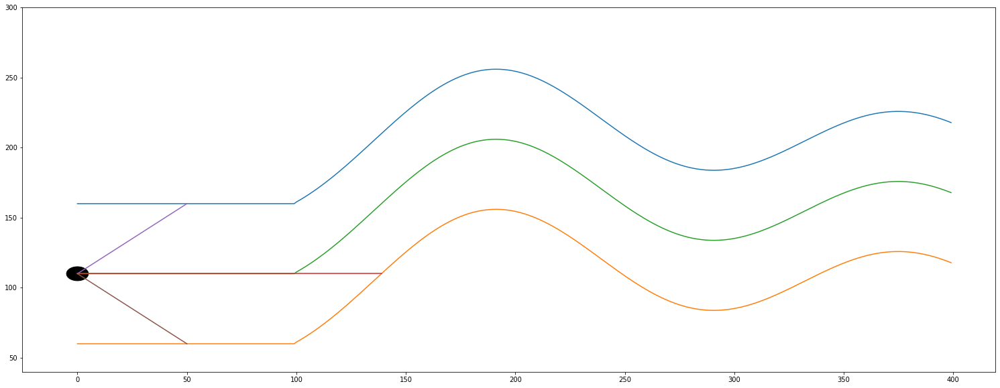

In [6]:
mlp = NeuralNetwork()
road = Road(wide = 100)
auto = Car(road, mlp)

auto.calculate_distances()
auto.plot()

In [7]:
auto.calculate_distances()

Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------


# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------
			 ---------------- Append ----------------
			 len(self.y_distance)    =  1
			 len(self.sensor_left)   =  1
			 len(self.sensor_center) =  1
			 len(self.sensor_right)  =  1
			 self

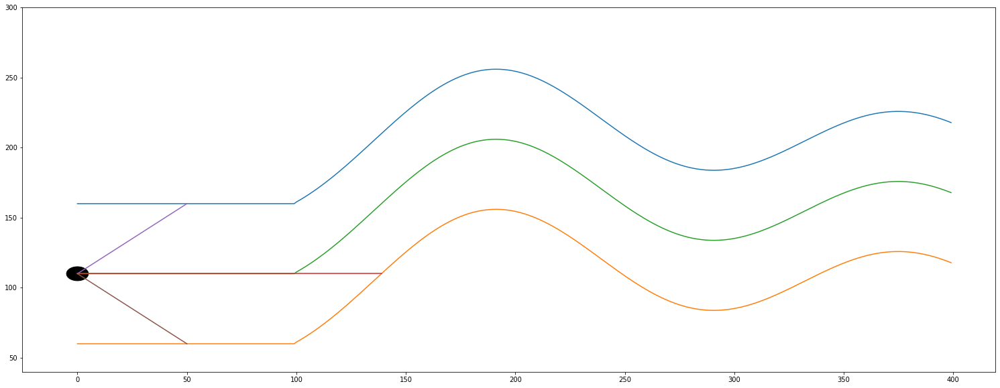

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  139
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccc

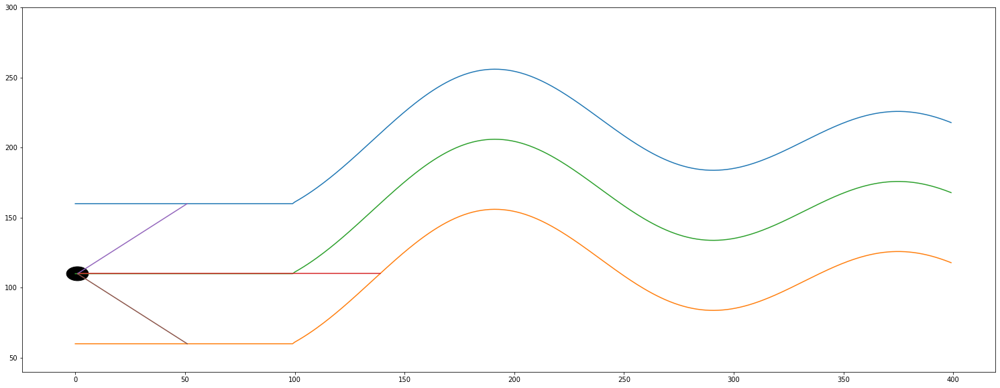

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  138
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
ccccccc

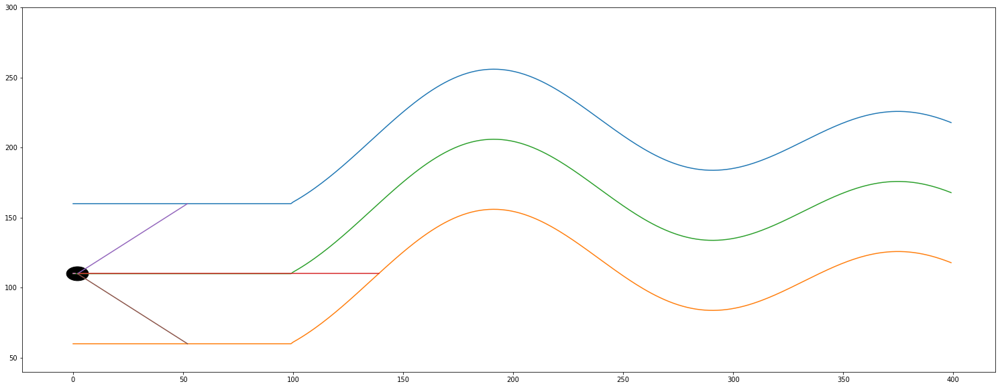

------------------------------ IF i % 3 == 2 ------------------------------
# i =  2
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  139
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  2
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  3
			 len(self.sensor_left)   =  3
			 len(self.sensor_center) =  3
			 len(self.sensor_right)  =  3
			 self.x                  =  2
			 -------------- Teszt End --------------
self.y =  111.0
# A run ciklus vége --------------------------------------------------------------------------------------------

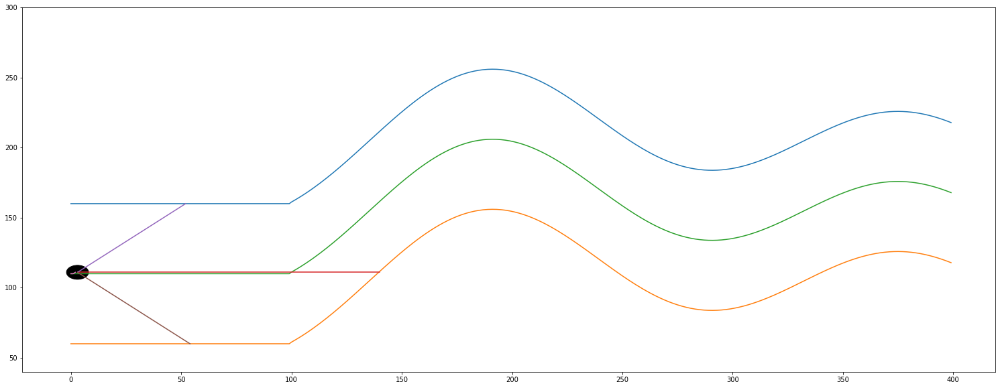

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  137
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =

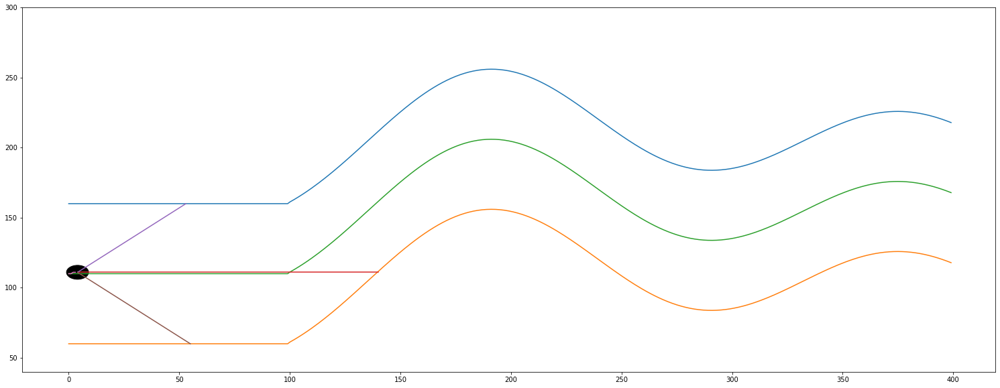

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  136
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó f

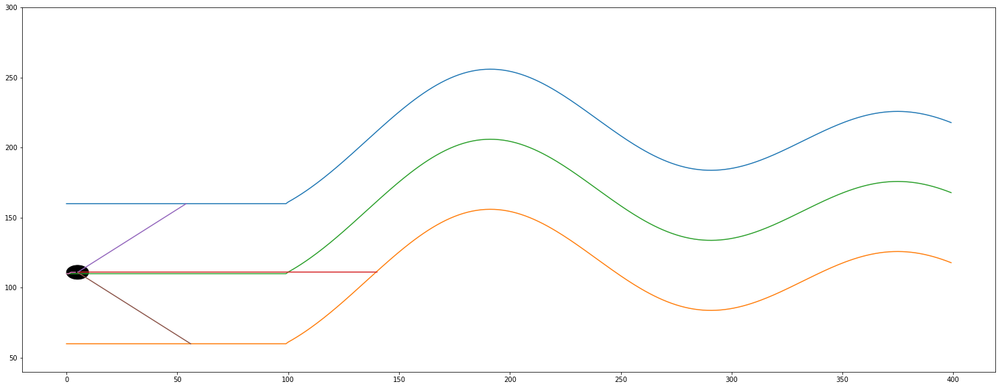

------------------------------ IF i % 3 == 2 ------------------------------
# i =  5
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  135
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  5
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  6
			 len(self.sensor_left)   =  6
			 len(self.sensor_center) =  6
			 len(self.sensor_right)  =  6
			 self.x                  =  5
			 -------------- Teszt End --------------
self.y =  110.0
# A run ciklus vége ---------------------------------------------------------------------------------------------------------

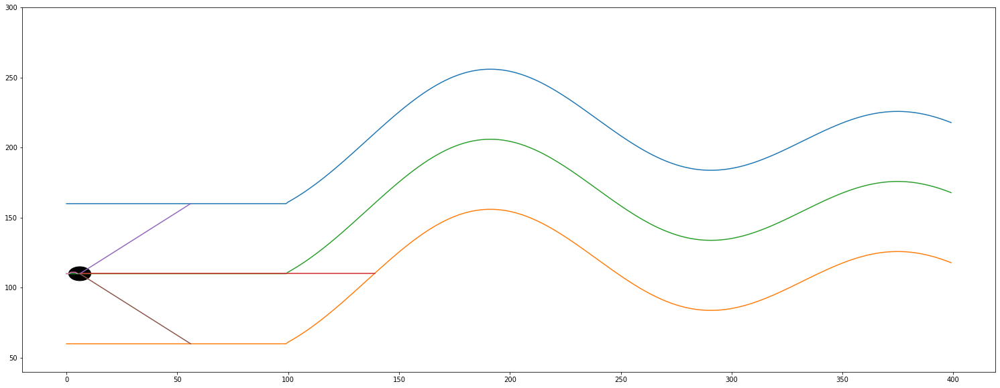

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  133
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra

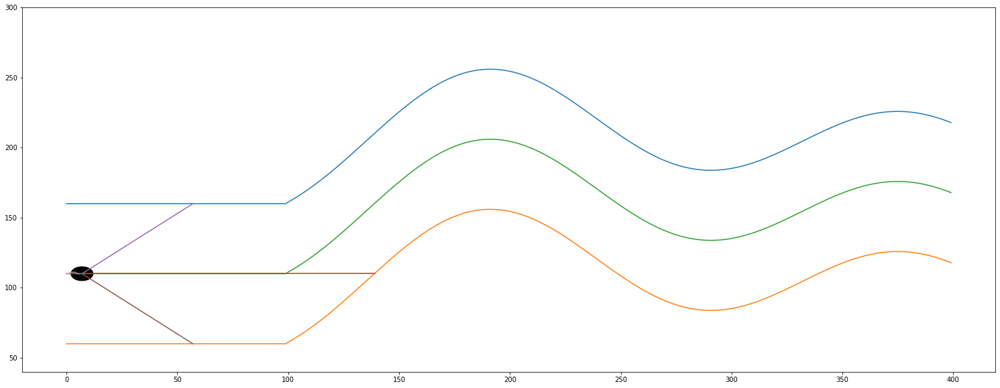

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  132
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most táv

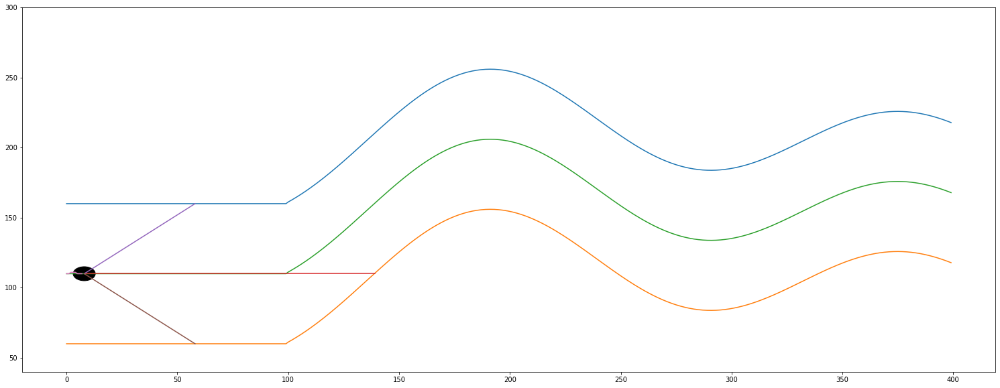

------------------------------ IF i % 3 == 2 ------------------------------
# i =  8
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  133
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  8
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  9
			 len(self.sensor_left)   =  9
			 len(self.sensor_center) =  9
			 len(self.sensor_right)  =  9
			 self.x                  =  8
			 -------------- Teszt End --------------
self.y =  111.0
# A run ciklus vége --------------------------------------------------------------------------------------------

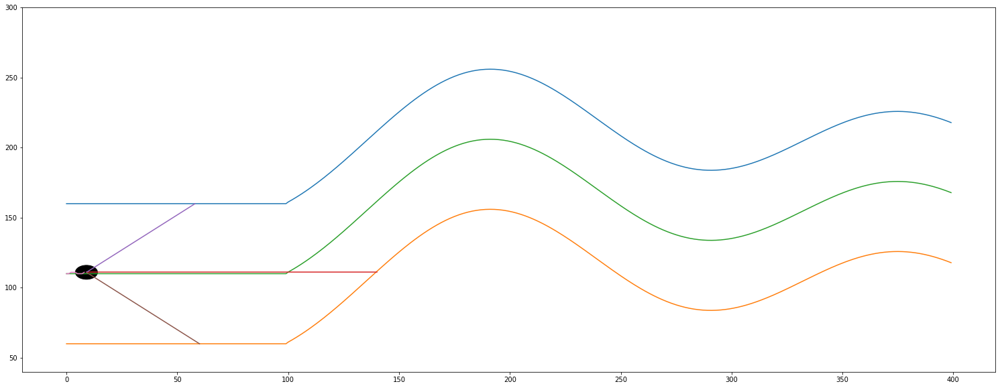

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  131
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól = 

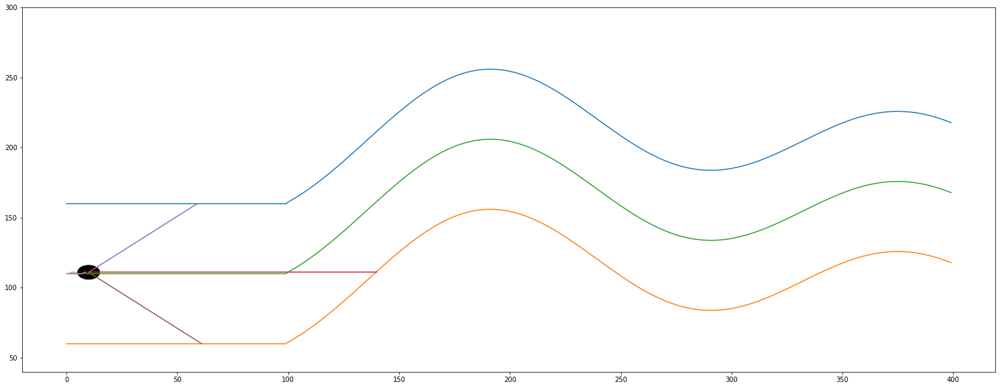

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  130
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső fa

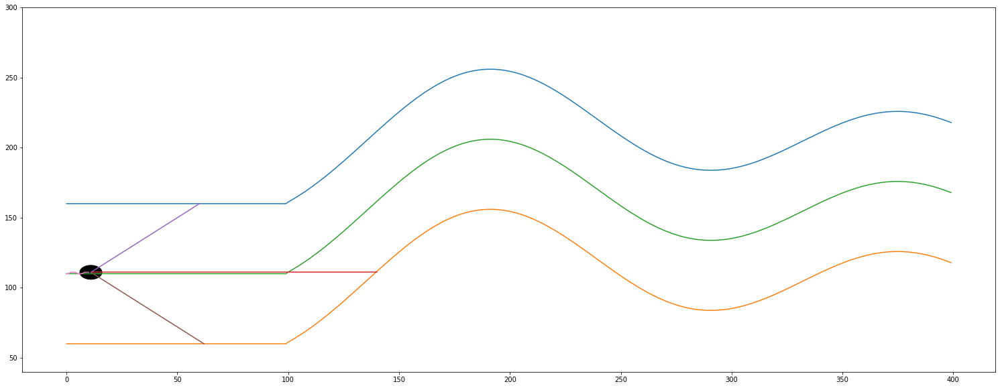

------------------------------ IF i % 3 == 2 ------------------------------
# i =  11
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  129
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  11
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  12
			 len(self.sensor_left)   =  12
			 len(self.sensor_center) =  12
			 len(self.sensor_right)  =  12
			 self.x                  =  11
			 -------------- Teszt End --------------
self.y =  110.0
# A run ciklus vége --------------------------------------------------------------------------------------------------

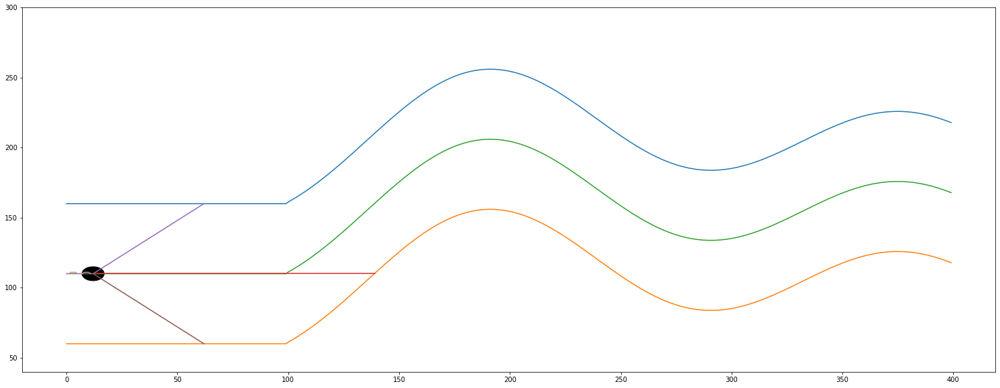

------------------------------ IF i % 3 == 0 ------------------------------
# i =  12
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (13, 3)
y.shape =  (13, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]]
i       =  12
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
-------------- after scaler fit transform assagine --------------------
X       =  [[1.         1.         0.        ]
 [1.         0.91666667 0.        ]
 [1.         0.83333333 0.        ]
 [0.         0.83333333 1.        ]
 [0.         0.75      

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


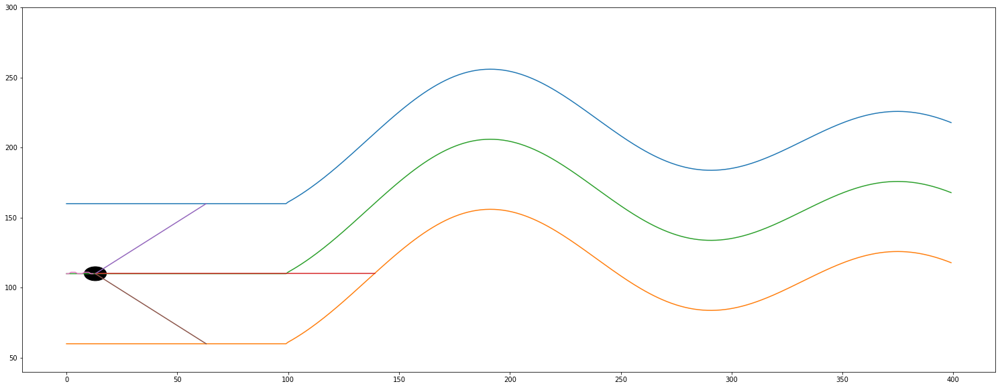

------------------------------ IF i % 3 == 1 ------------------------------
# i =  13
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 51 127  51]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 1.         -0.08333333  0.        ]]
actual predicted =  [0.99873672]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0]
1
1


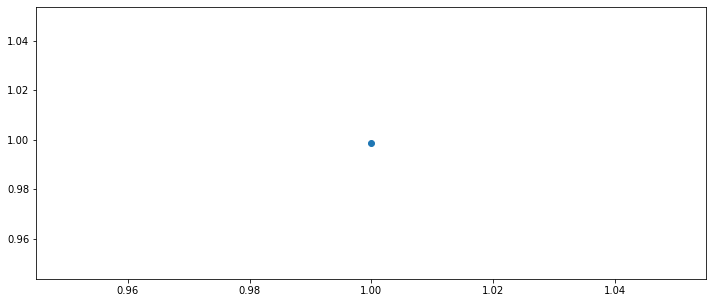

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  126
Sensor from left wall =  51
Sensor from right wall =  51
most távo

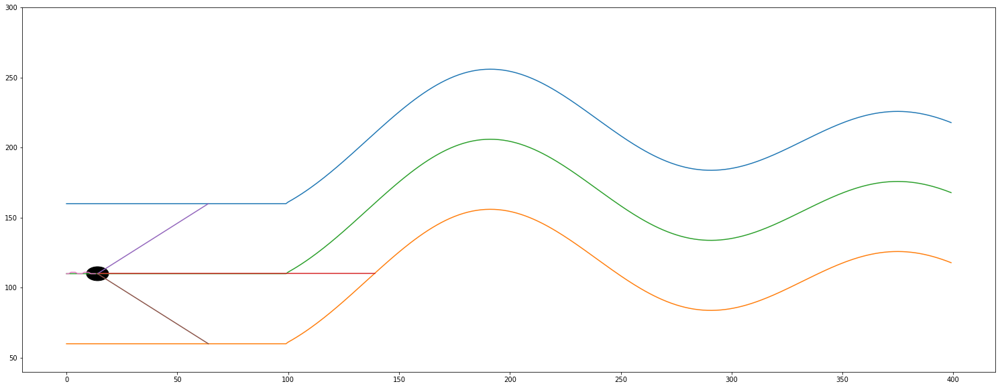

------------------------------ IF i % 3 == 2 ------------------------------
# i =  14
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  127
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  14
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  15
			 len(self.sensor_left)   =  15
			 len(self.sensor_center) =  15
			 len(self.sensor_right)  =  15
			 self.x                  =  14
			 -------------- Teszt End --------------
self.y =  111.0
# A run ciklus vége -------------------------------------------------------------------------------------

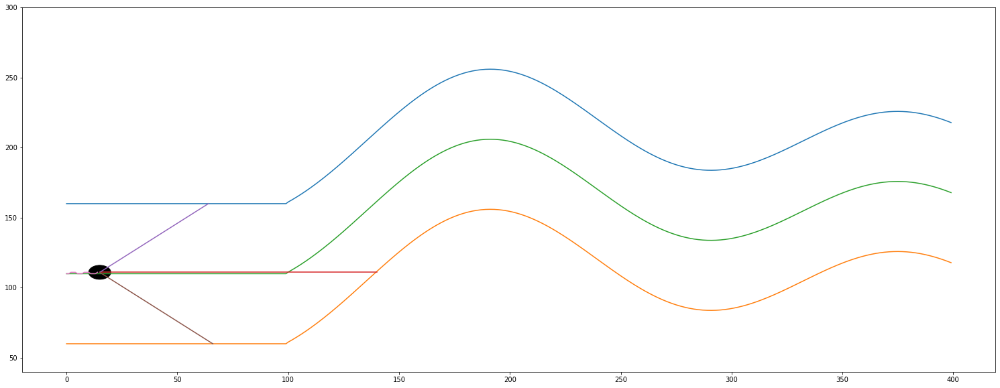

------------------------------ IF i % 3 == 0 ------------------------------
# i =  15
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (16, 3)
y.shape =  (16, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]]
i       =  15
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
-------------- after scaler fit transform assagine --------------------
X       =  [[1.         1.         0.        ]
 [1.         0.92857143 0.        ]
 [1.    

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


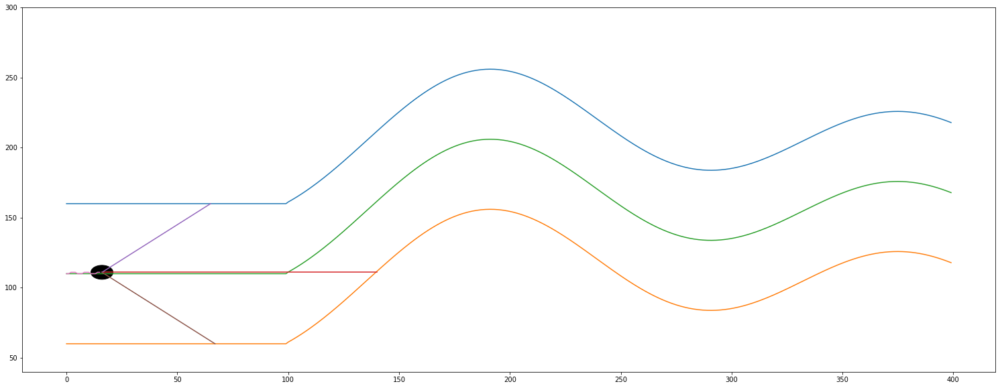

------------------------------ IF i % 3 == 1 ------------------------------
# i =  16
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 50 125  52]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.         -0.07142857  1.        ]]
actual predicted =  [0.96180032]
actual self.y_distance[-1] =  0.9607843137254902
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902]
2
2


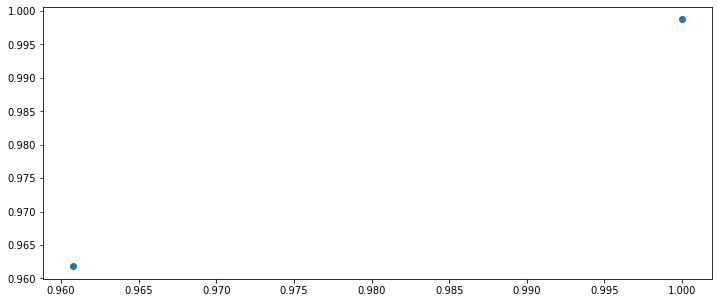

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  124
Sensor from left wall =  50
Sensor from right

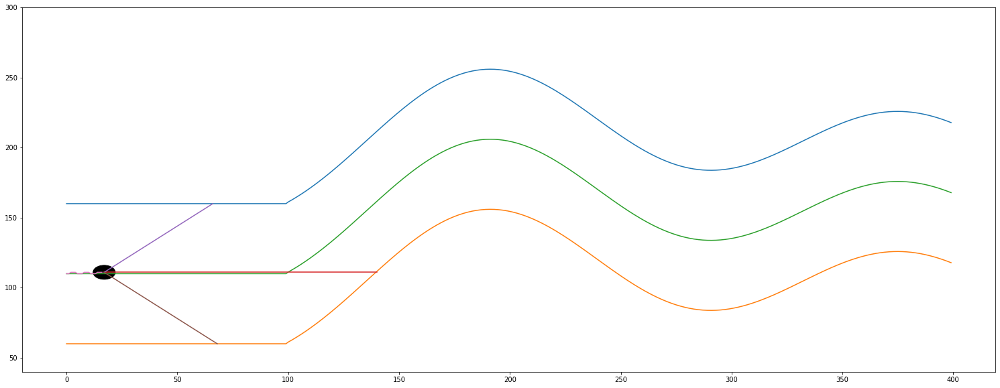

------------------------------ IF i % 3 == 2 ------------------------------
# i =  17
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  123
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  17
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  18
			 len(self.sensor_left)   =  18
			 len(self.sensor_center) =  18
			 len(self.sensor_right)  =  18
			 self.x                  =  17
			 -------------- Teszt End --------------
self.y =  110.0
# A run ciklus vége --------------------------------------------------------------------------------------------------

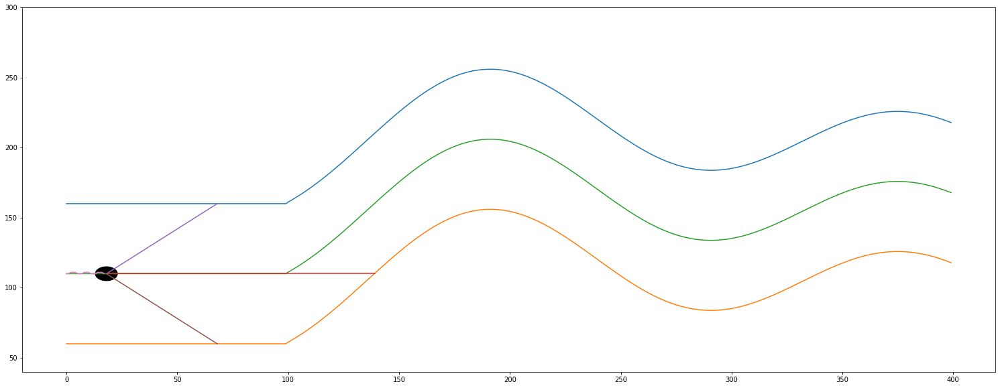

------------------------------ IF i % 3 == 0 ------------------------------
# i =  18
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (19, 3)
y.shape =  (19, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]]
i       =  18
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
-------------- after scaler fit transform assagine --------------------
X   

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


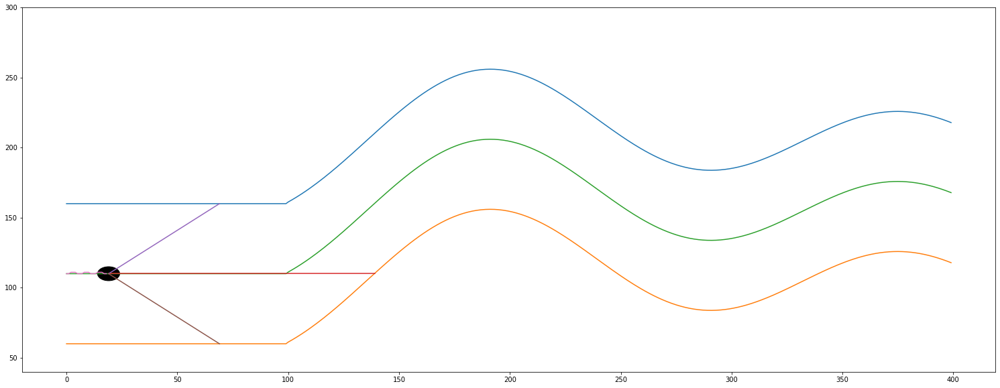

------------------------------ IF i % 3 == 1 ------------------------------
# i =  19
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 51 121  51]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 1.         -0.05555556  0.        ]]
actual predicted =  [0.99916352]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0]
3
3


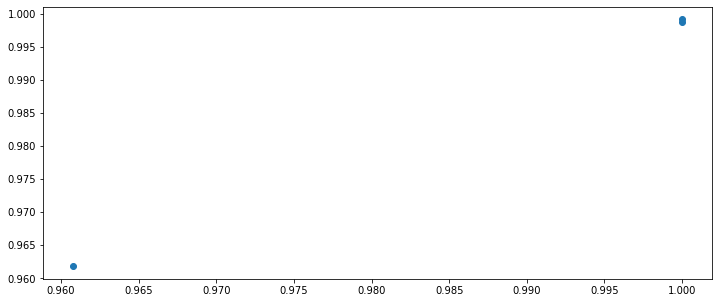

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  120
Sensor from left wall = 

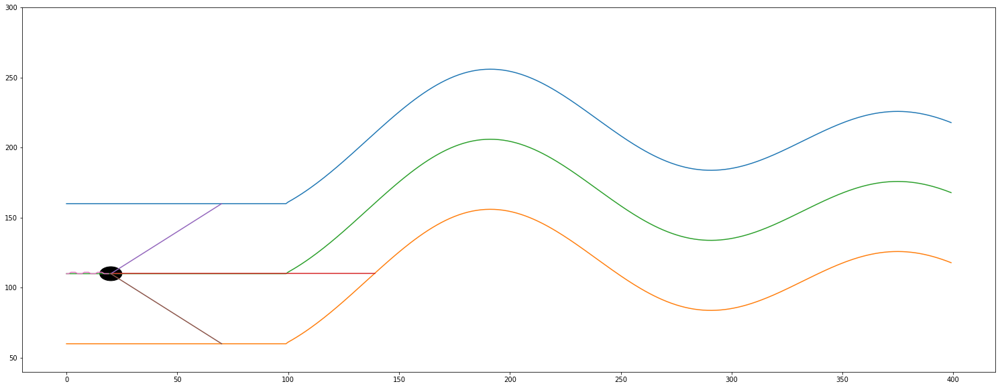

------------------------------ IF i % 3 == 2 ------------------------------
# i =  20
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  121
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  20
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  21
			 len(self.sensor_left)   =  21
			 len(self.sensor_center) =  21
			 len(self.sensor_right)  =  21
			 self.x                  =  20
			 -------------- Teszt End --------------
self.y =  111.0
# A run ciklus vége -------------------------------------------------------------------------------------

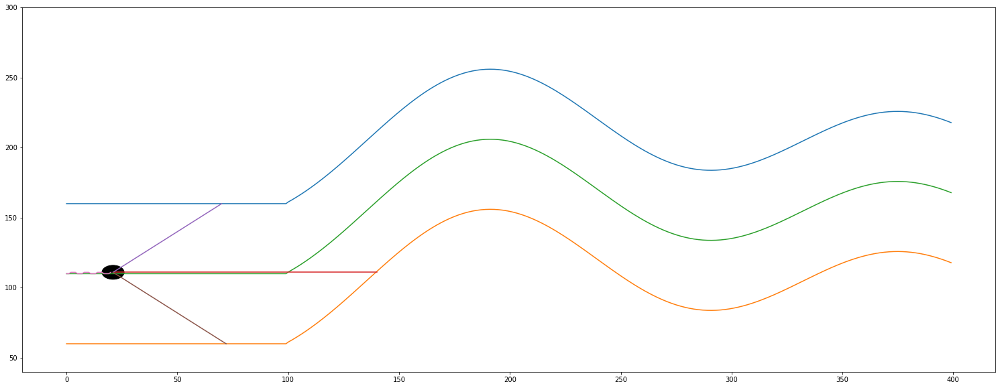

------------------------------ IF i % 3 == 0 ------------------------------
# i =  21
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (22, 3)
y.shape =  (22, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]]
i       =  21
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


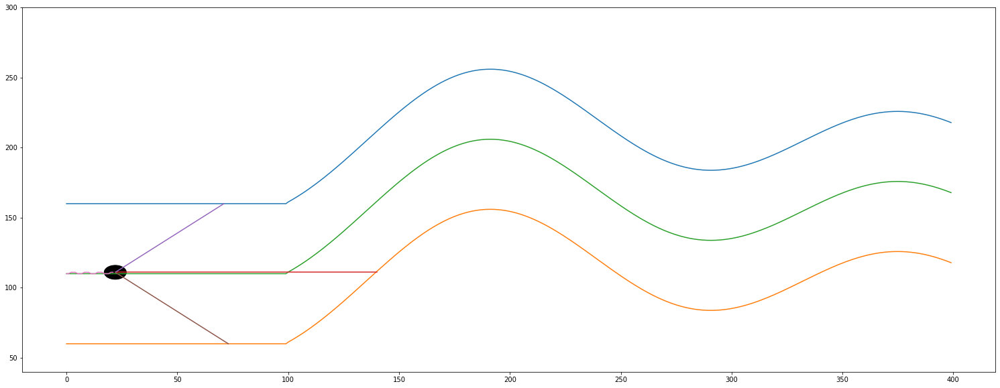

------------------------------ IF i % 3 == 1 ------------------------------
# i =  22
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 50 119  52]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.   -0.05  1.  ]]
actual predicted =  [0.96147099]
actual self.y_distance[-1] =  0.9607843137254902
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902]
4
4


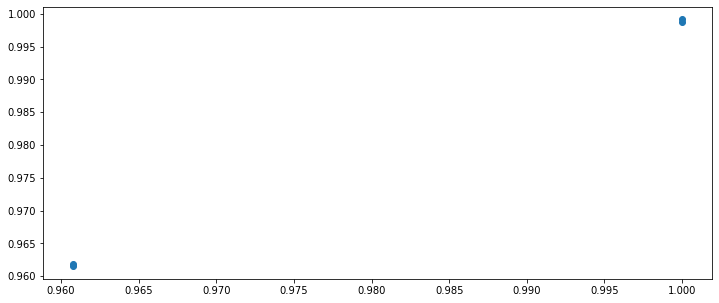

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  118
Sen

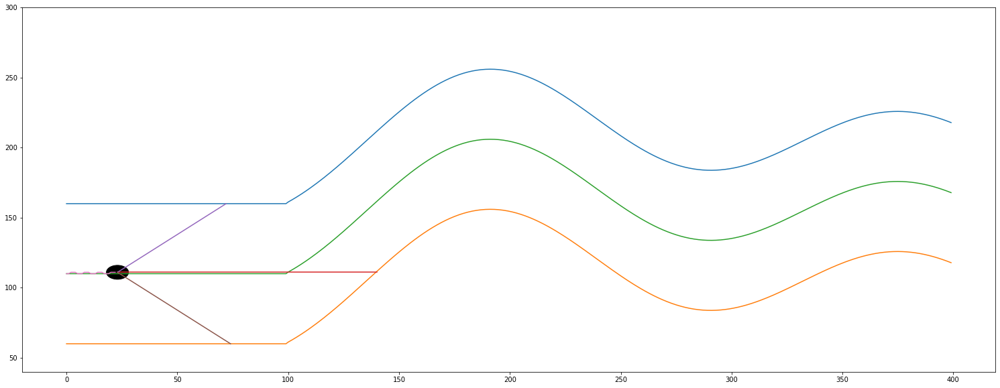

------------------------------ IF i % 3 == 2 ------------------------------
# i =  23
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  117
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  23
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  24
			 len(self.sensor_left)   =  24
			 len(self.sensor_center) =  24
			 len(self.sensor_right)  =  24
			 self.x                  =  23
			 -------------- Teszt End --------------
self.y =  110.0
# A run ciklus vége --------------------------------------------------------------------------------------------------

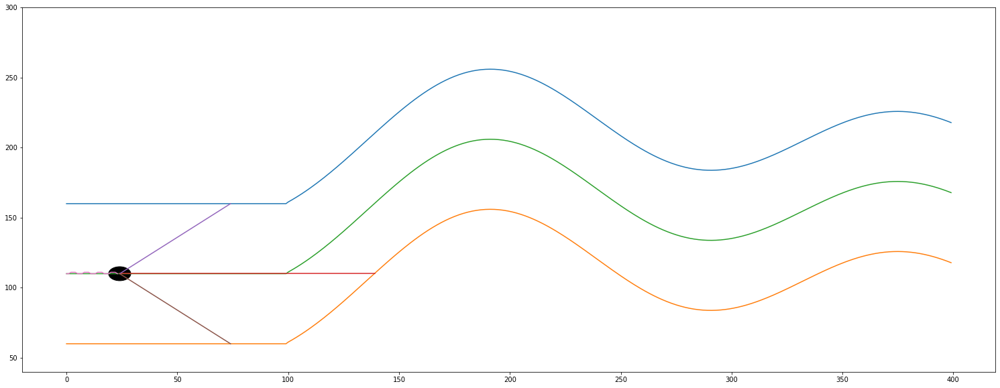

------------------------------ IF i % 3 == 0 ------------------------------
# i =  24
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (25, 3)
y.shape =  (25, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]]
i  

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


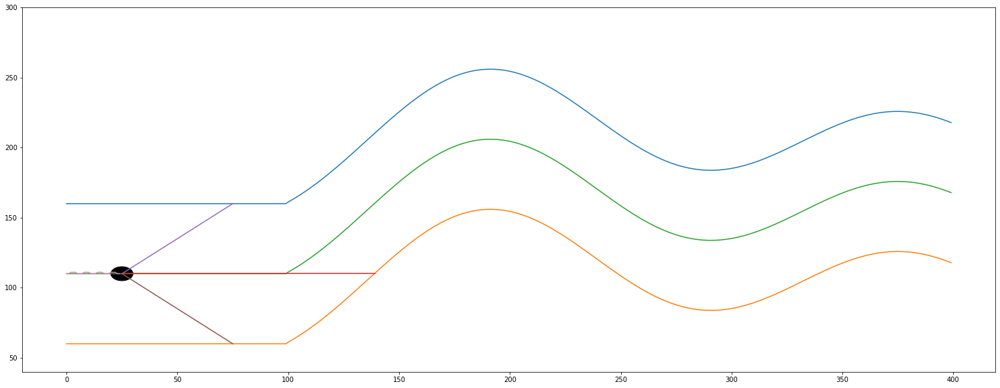

------------------------------ IF i % 3 == 1 ------------------------------
# i =  25
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 51 115  51]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 1.         -0.04166667  0.        ]]
actual predicted =  [0.99939065]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0]
5
5


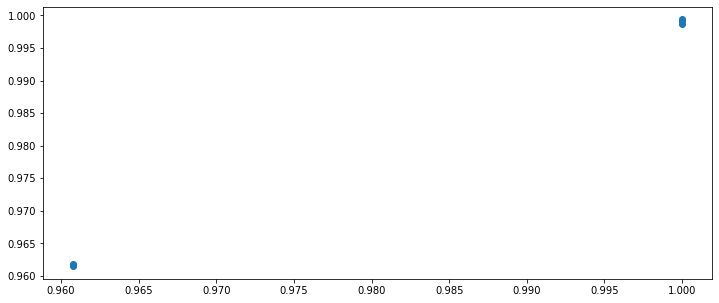

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sen

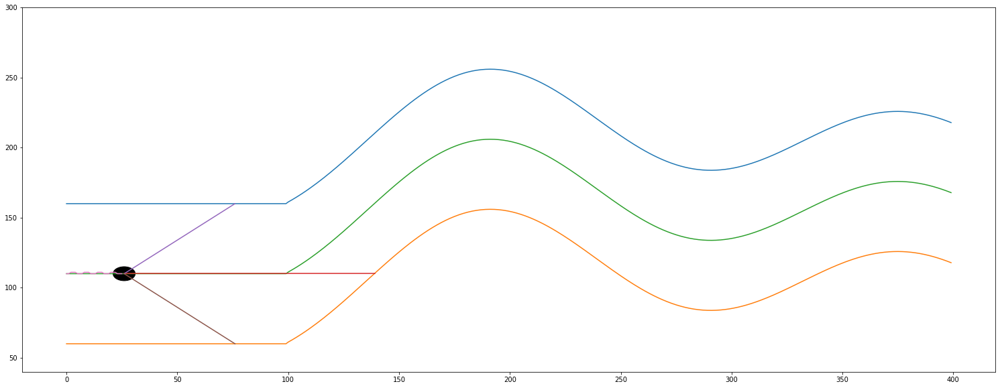

------------------------------ IF i % 3 == 2 ------------------------------
# i =  26
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  115
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  26
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  27
			 len(self.sensor_left)   =  27
			 len(self.sensor_center) =  27
			 len(self.sensor_right)  =  27
			 self.x                  =  26
			 -------------- Teszt End --------------
self.y =  111.0
# A run ciklus vége -------------------------------------------------------------------------------------

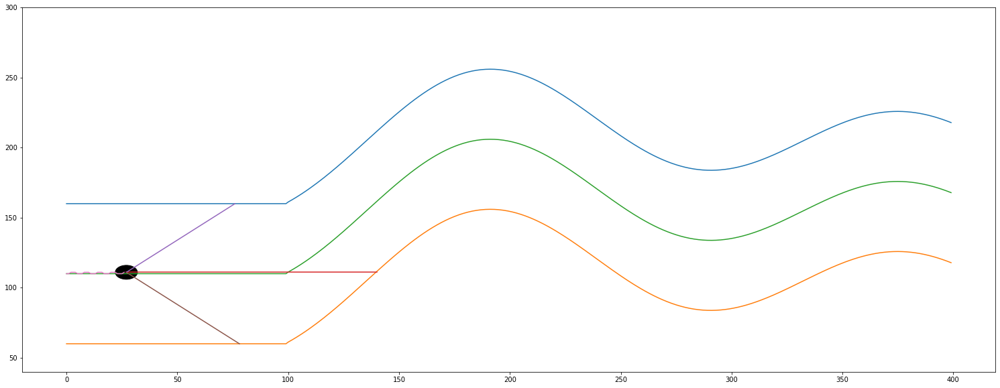

------------------------------ IF i % 3 == 0 ------------------------------
# i =  27
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (28, 3)
y.shape =  (28, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


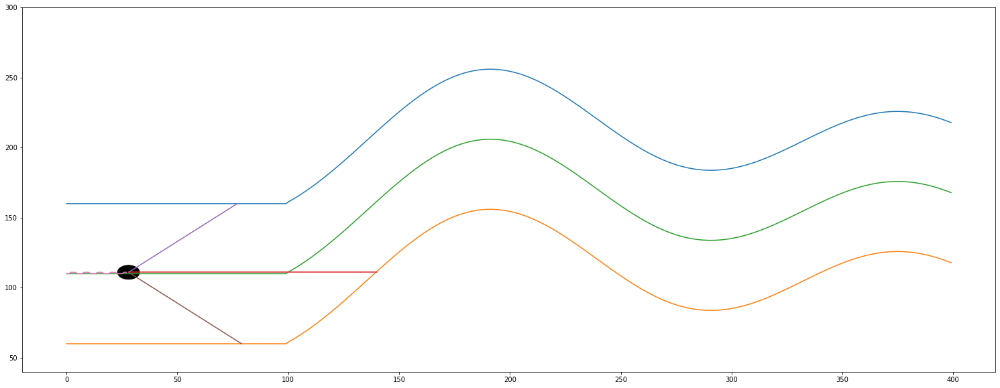

------------------------------ IF i % 3 == 1 ------------------------------
# i =  28
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 50 113  52]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.         -0.03846154  1.        ]]
actual predicted =  [0.96123234]
actual self.y_distance[-1] =  0.9607843137254902
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902]
6
6


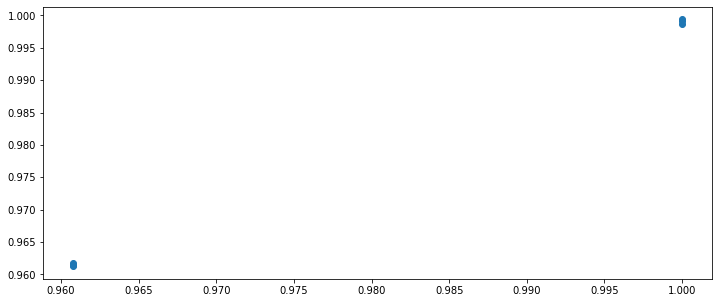

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje ------------------------------------------------------------------------------------------------------------------------

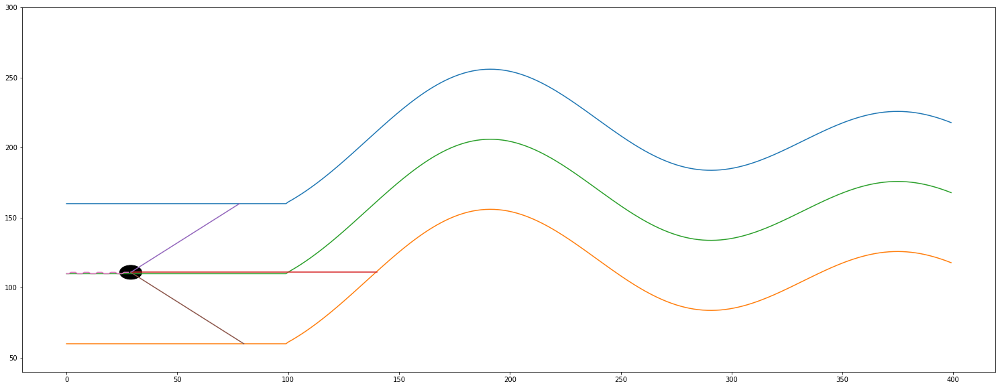

------------------------------ IF i % 3 == 2 ------------------------------
# i =  29
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  111
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  29
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  30
			 len(self.sensor_left)   =  30
			 len(self.sensor_center) =  30
			 len(self.sensor_right)  =  30
			 self.x                  =  29
			 -------------- Teszt End --------------
self.y =  110.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  29
  Ha már van elég be

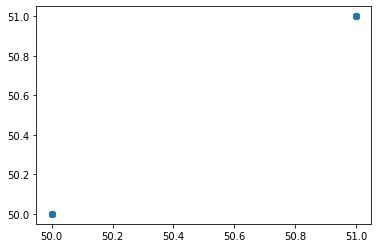

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


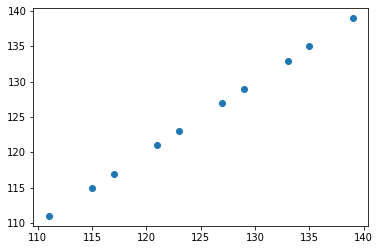

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[-0.2  0.4]]


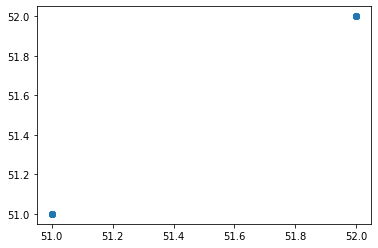

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[60.]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[62.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[111  -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[51.6]]
		 predicted_center =  [[108.]]
		 predicted_right  =  [[50.4]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[-0.2 -0.4]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[-0.2  0.4]]
		 regression_left.intercept_   =  [60.6]
		 regression_center.in

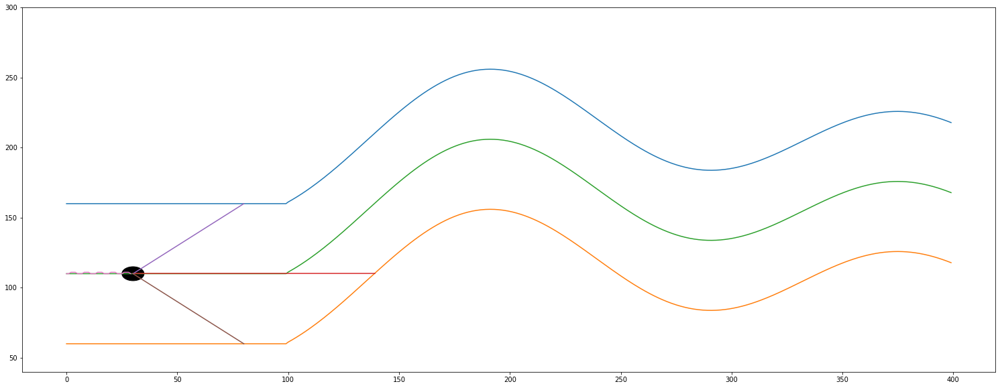

------------------------------ IF i % 3 == 0 ------------------------------
# i =  30
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (31, 3)
y.shape =  (31, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


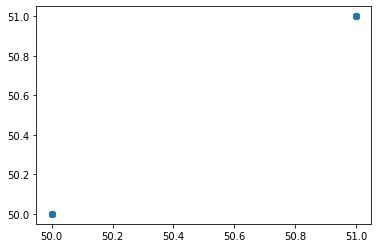

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


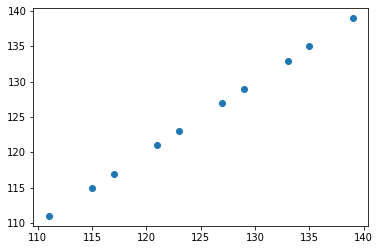

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[-0.2  0.4]]


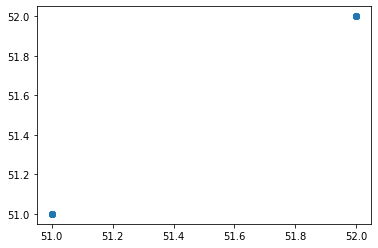

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[60.]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[62.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[110  -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[51.6]]
		 predicted_center =  [[107.]]
		 predicted_right  =  [[50.4]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[-0.2 -0.4]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[-0.2  0.4]]
		 regression_left.intercept_   =  [60.6]
		 regression_center.in

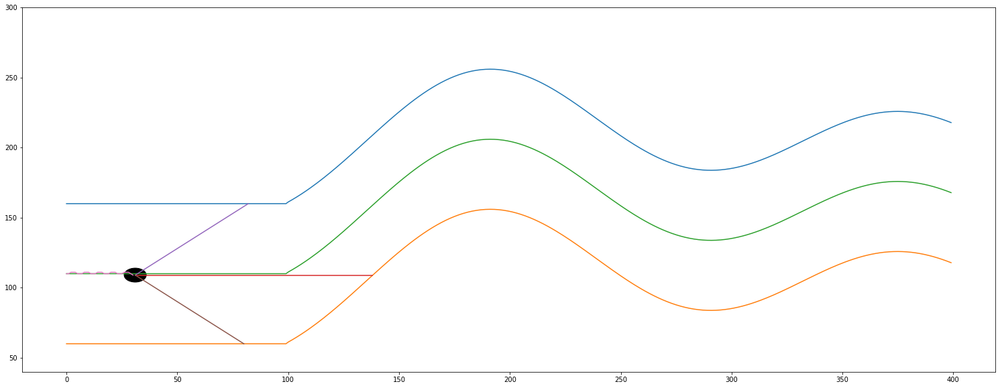

------------------------------ IF i % 3 == 1 ------------------------------
# i =  31
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 52 108  50]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 2.         -0.06666667 -1.        ]]
actual predicted =  [1.03777194]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123]
7
7


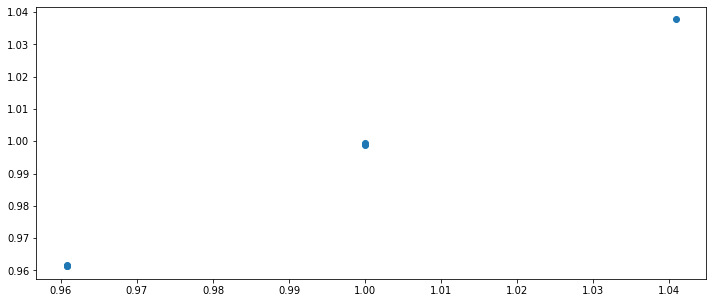

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  31
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(10, 4)
(10, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  51., 117.,  51.]), array([111.,  50., 115.,  52.]), array([110.,  51., 111.,  51.])]
[[ 1. -1.  1.  1.]
 [-1

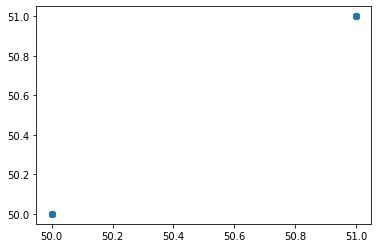

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


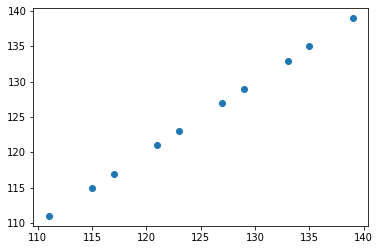

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[-0.2  0.4]]


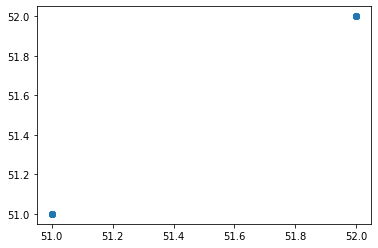

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[60.]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[62.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[52 -3]]
		 _X_center =  [[108  -3]]
		 _X_right  =  [[50 -3]]
		 predicted_left   =  [[51.4]]
		 predicted_center =  [[105.]]
		 predicted_right  =  [[50.6]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[-0.2 -0.4]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[-0.2  0.4]]
		 regression_left.intercept_   =  [60.6]
		 regression_center.in

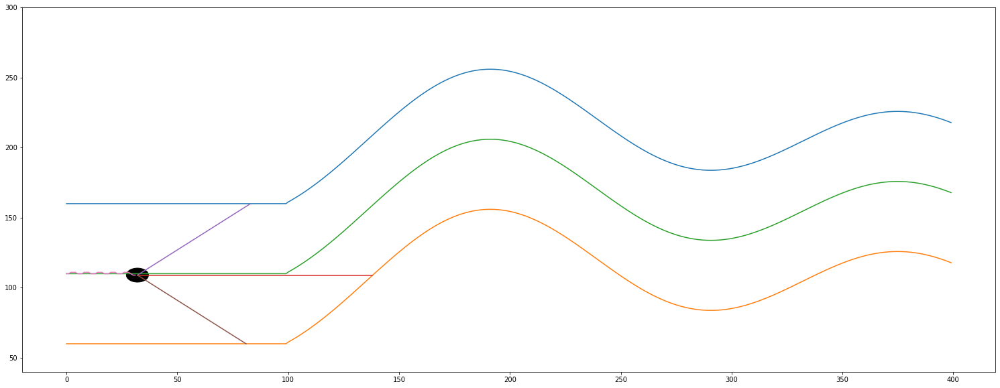

------------------------------ IF i % 3 == 2 ------------------------------
# i =  32
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  108
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  32
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  33
			 len(self.sensor_left)   =  33
			 len(self.sensor_center) =  33
			 len(self.sensor_right)  =  33
			 self.x                  =  32
			 -------------- Teszt End --------------
self.y =  110.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  32
  Ha már van elég befo

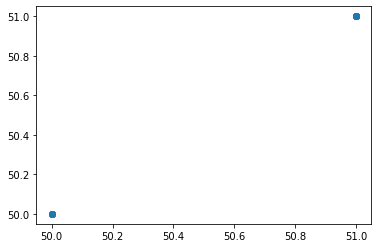

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


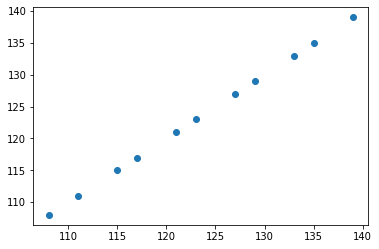

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


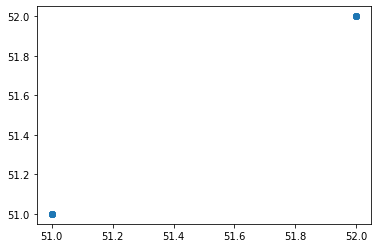

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[3.51940699e-14]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[108  -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[54.]]
		 predicted_center =  [[105.]]
		 predicted_right  =  [[48.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [3.55271368e-14]
		 regressi

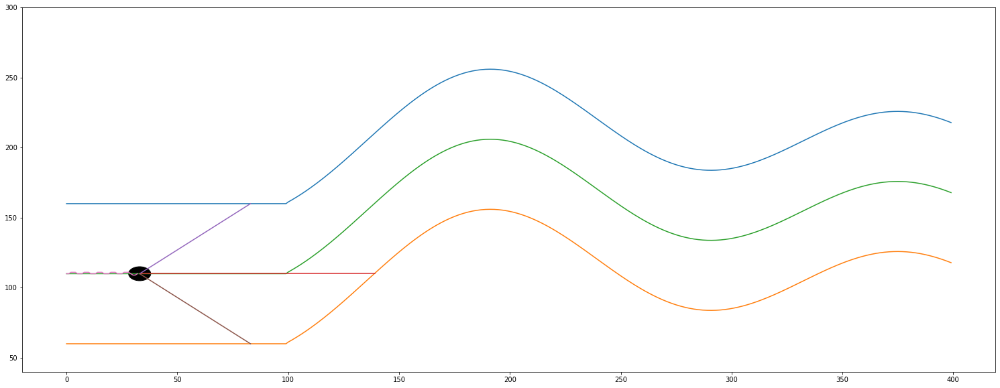

------------------------------ IF i % 3 == 0 ------------------------------
# i =  33
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (34, 3)
y.shape =  (34, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


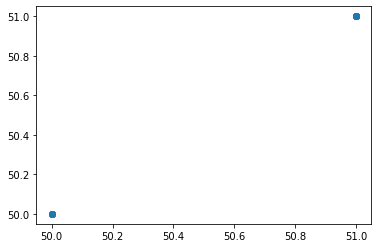

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


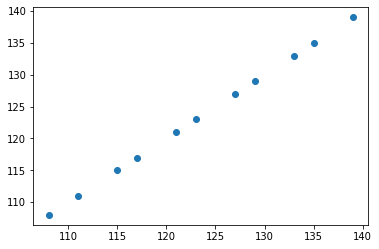

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


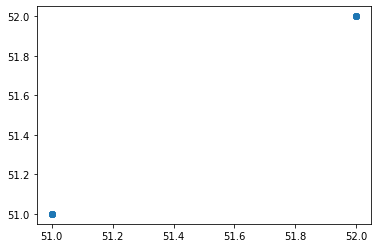

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[3.51940699e-14]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[107  -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[54.]]
		 predicted_center =  [[104.]]
		 predicted_right  =  [[48.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [3.55271368e-14]
		 regressi

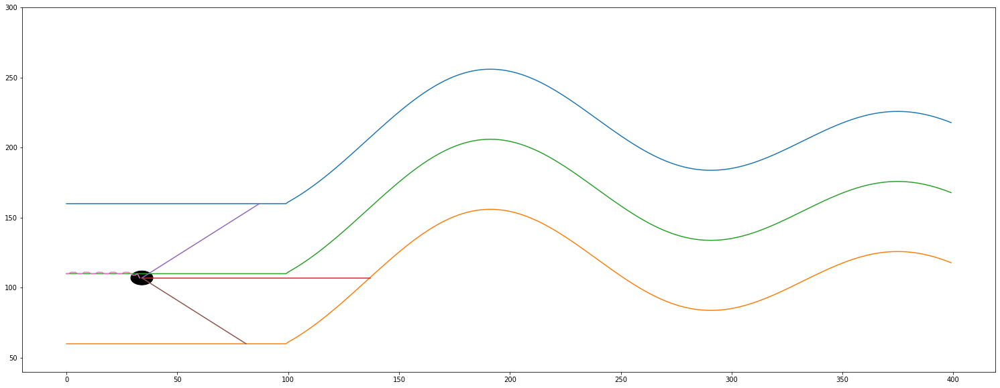

------------------------------ IF i % 3 == 1 ------------------------------
# i =  34
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 54 104  48]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 2.         -0.09090909 -1.        ]]
actual predicted =  [1.11528032]
actual self.y_distance[-1] =  1.127659574468085
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085]
8
8


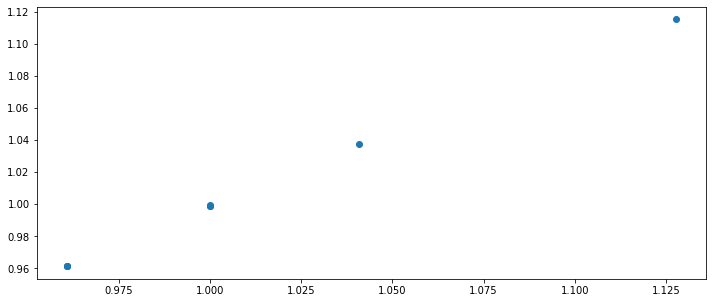

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  34
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(11, 4)
(11, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  51., 117.,  51.]), array([111.,  50., 115.,  52.]), array([110.,  51., 

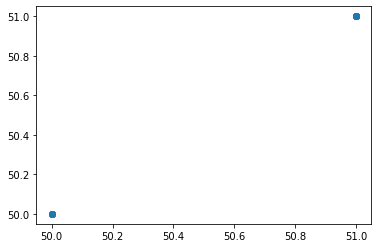

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


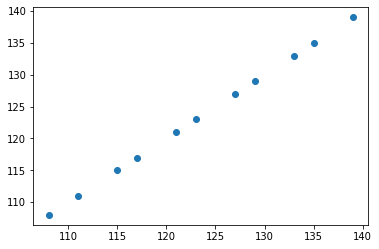

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


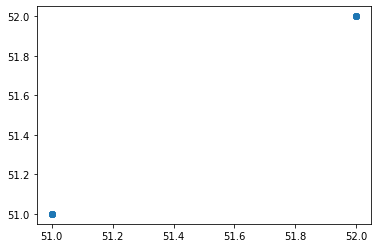

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[3.51940699e-14]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[104  -3]]
		 _X_right  =  [[48 -3]]
		 predicted_left   =  [[57.]]
		 predicted_center =  [[101.]]
		 predicted_right  =  [[45.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [3.55271368e-14]
		 regressi

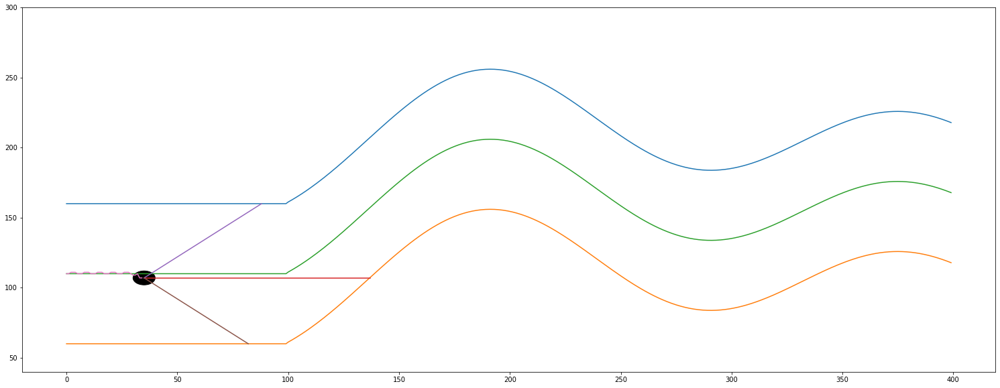

------------------------------ IF i % 3 == 2 ------------------------------
# i =  35
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  102
Sensor from left wall =  55
Sensor from right wall =  47
most távolsagra van a felső faltól =  54.0
most távolsagra van az alsó faltól =  46.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  35
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.173913043478261
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  36
			 len(self.sensor_left)   =  36
			 len(self.sensor_center) =  36
			 len(self.sensor_right)  =  36
			 self.x                  =  35
			 -------------- Teszt End --------------
self.y =  106.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  35
  Ha m

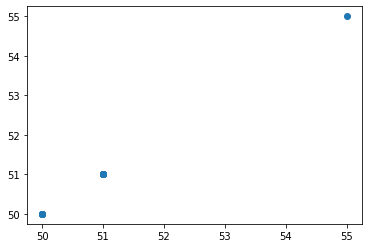

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


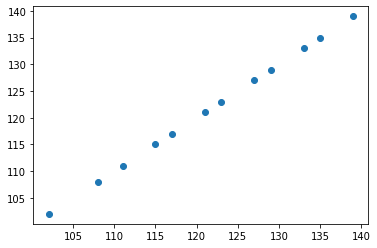

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


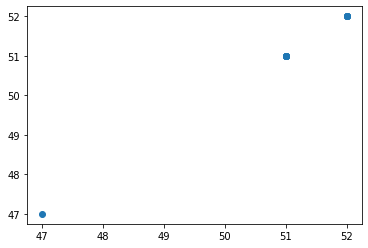

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.42108547e-14]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[55 -3]]
		 _X_center =  [[102  -3]]
		 _X_right  =  [[47 -3]]
		 predicted_left   =  [[58.]]
		 predicted_center =  [[99.]]
		 predicted_right  =  [[44.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [-1.42108547e-14]
		 regress

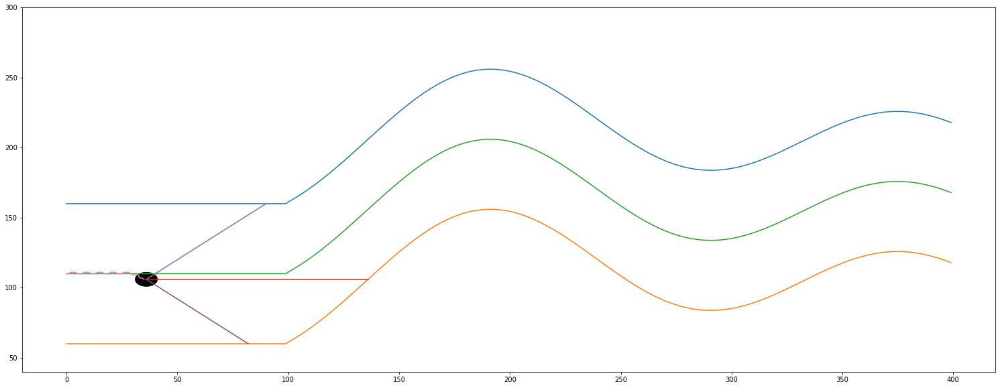

------------------------------ IF i % 3 == 0 ------------------------------
# i =  36
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (37, 3)
y.shape =  (37, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.  

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


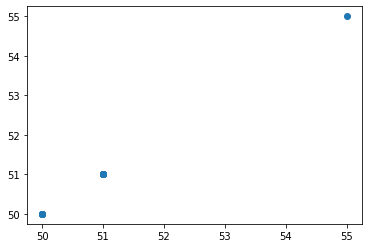

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


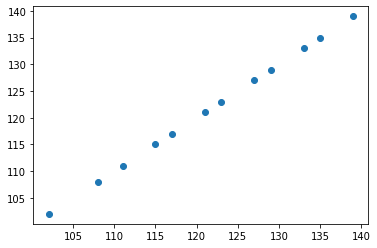

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


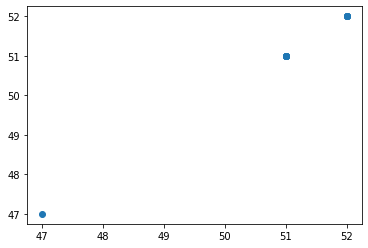

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.42108547e-14]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[55 -3]]
		 _X_center =  [[101  -3]]
		 _X_right  =  [[47 -3]]
		 predicted_left   =  [[58.]]
		 predicted_center =  [[98.]]
		 predicted_right  =  [[44.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [-1.42108547e-14]
		 regress

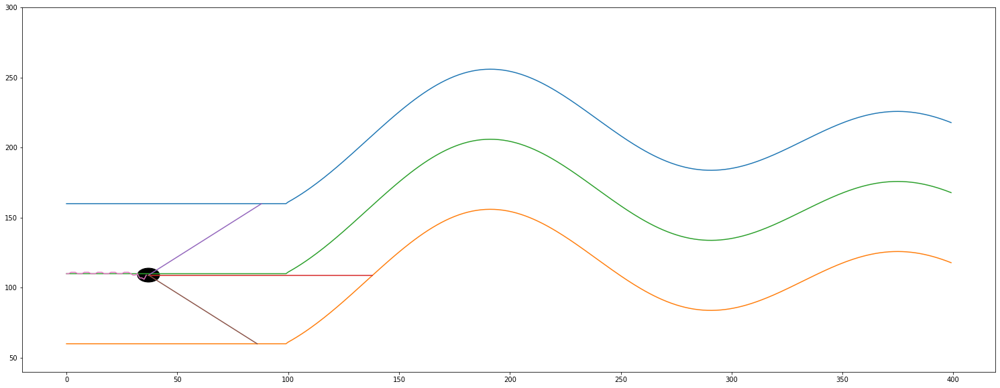

------------------------------ IF i % 3 == 1 ------------------------------
# i =  37
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 52 102  50]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.4        0.02564103 0.6       ]]
actual predicted =  [1.04353011]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265

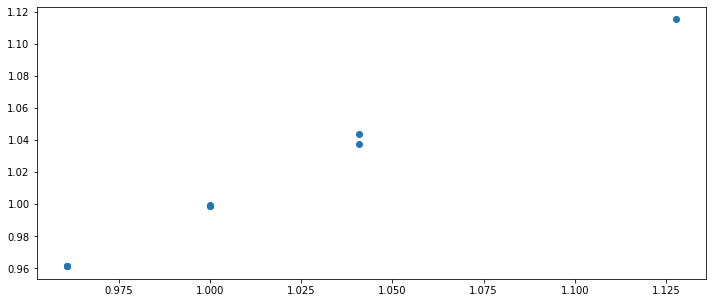

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  37
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(12, 4)
(12, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  51., 117.,  51.]), array([111.,  5

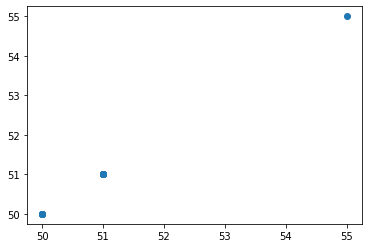

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


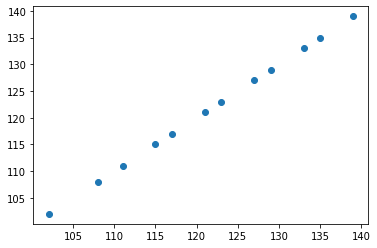

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


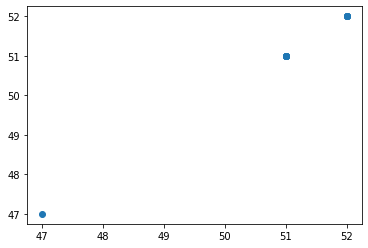

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.42108547e-14]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[52 -3]]
		 _X_center =  [[102  -3]]
		 _X_right  =  [[50 -3]]
		 predicted_left   =  [[55.]]
		 predicted_center =  [[99.]]
		 predicted_right  =  [[47.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [-1.42108547e-14]
		 regress

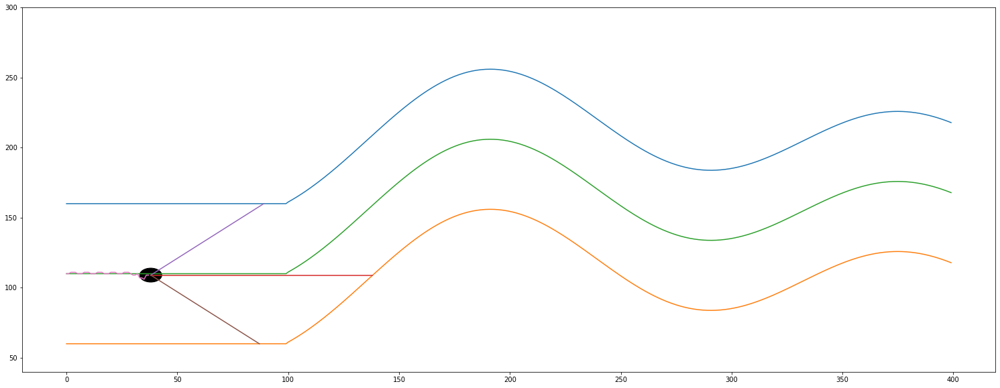

------------------------------ IF i % 3 == 2 ------------------------------
# i =  38
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  102
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  38
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  39
			 len(self.sensor_left)   =  39
			 len(self.sensor_center) =  39
			 len(self.sensor_right)  =  39
			 self.x                  =  38
			 -------------- Teszt End --------------
self.y =  110.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  38
  Ha már van elég befo

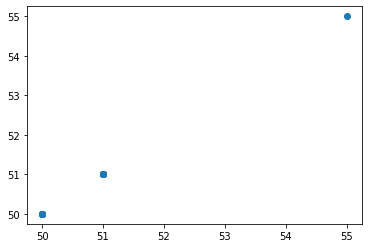

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


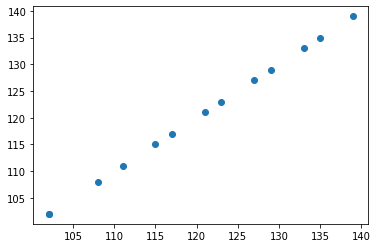

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


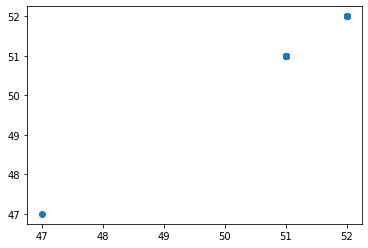

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.42108547e-14]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[102  -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[54.]]
		 predicted_center =  [[99.]]
		 predicted_right  =  [[48.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [-1.42108547e-14]
		 regress

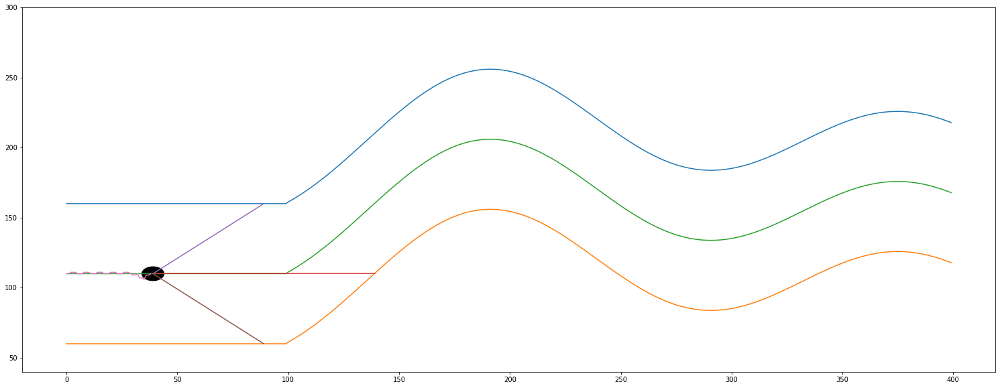

------------------------------ IF i % 3 == 0 ------------------------------
# i =  39
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (40, 3)
y.shape =  (40, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


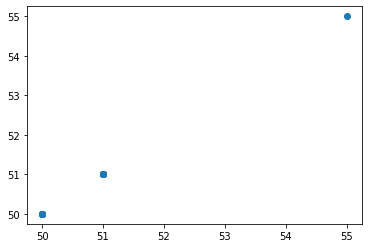

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


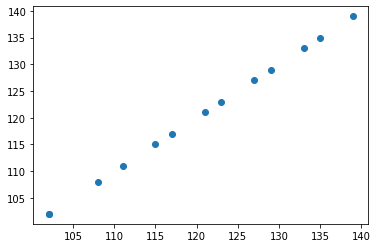

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


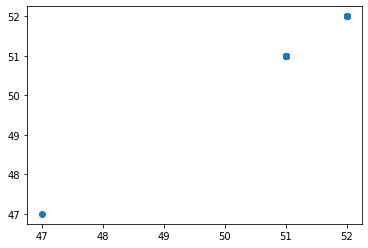

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.42108547e-14]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[101  -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[54.]]
		 predicted_center =  [[98.]]
		 predicted_right  =  [[48.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [-1.42108547e-14]
		 regress

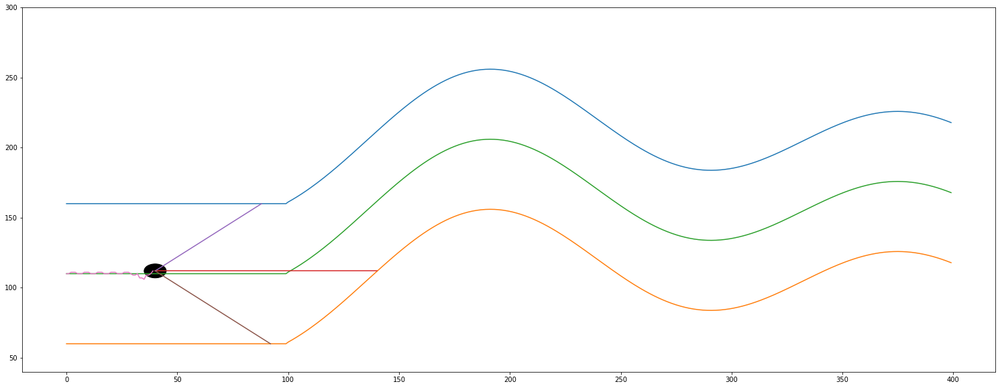

------------------------------ IF i % 3 == 1 ------------------------------
# i =  40
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 49 101  53]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[-0.2  0.   1.2]]
actual predicted =  [0.92017813]
actual self.y_distance[-1] =  0.9230769230769231
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265306123, 1.04081632

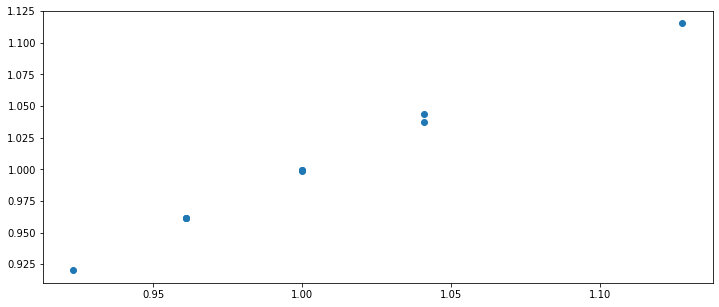

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  40
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(13, 4)
(13, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.

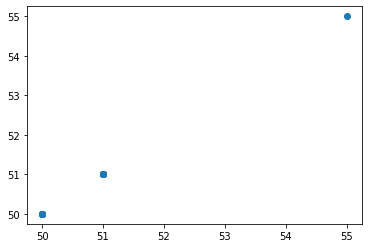

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


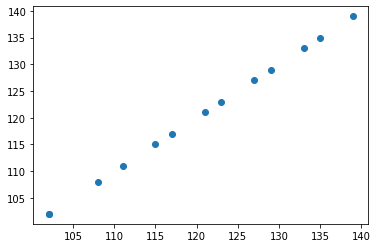

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


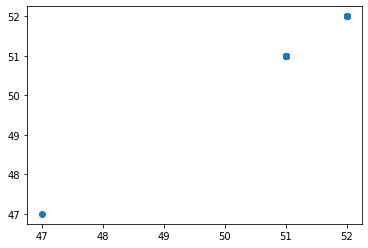

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.42108547e-14]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[49 -3]]
		 _X_center =  [[101  -3]]
		 _X_right  =  [[53 -3]]
		 predicted_left   =  [[52.]]
		 predicted_center =  [[98.]]
		 predicted_right  =  [[50.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [-1.42108547e-14]
		 regress

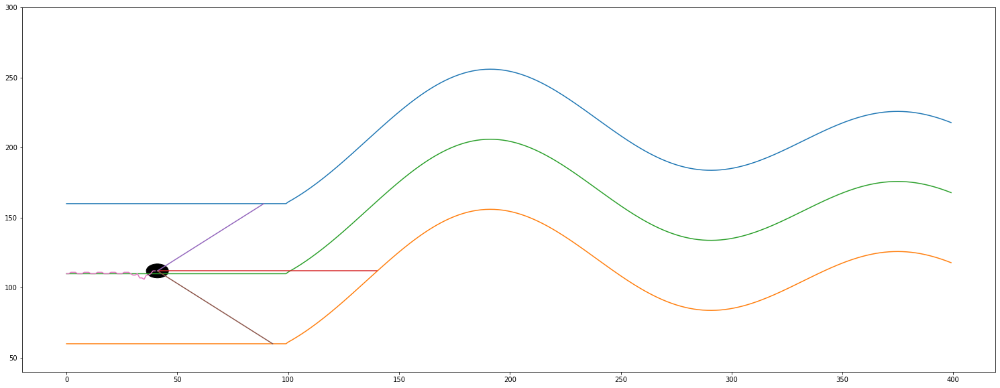

------------------------------ IF i % 3 == 2 ------------------------------
# i =  41
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  100
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  41
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  42
			 len(self.sensor_left)   =  42
			 len(self.sensor_center) =  42
			 len(self.sensor_right)  =  42
			 self.x                  =  41
			 -------------- Teszt End --------------
self.y =  111.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  41
  Ha 

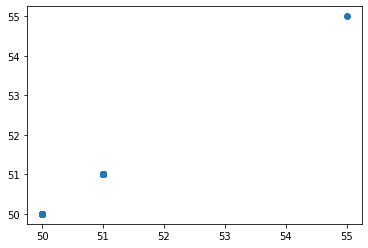

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.9918543  0.93729896]]


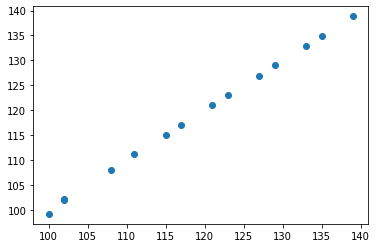

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


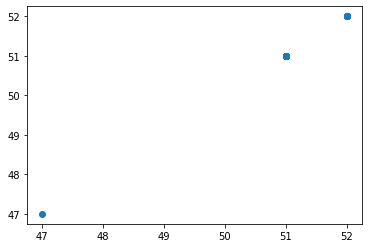

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.42108547e-14]]
-------- 1 y up ->  center =  [[2.96701041]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[50 -3]]
		 _X_center =  [[100  -3]]
		 _X_right  =  [[52 -3]]
		 predicted_left   =  [[53.]]
		 predicted_center =  [[97.41139073]]
		 predicted_right  =  [[49.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[0.9918543  0.93729896]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_  

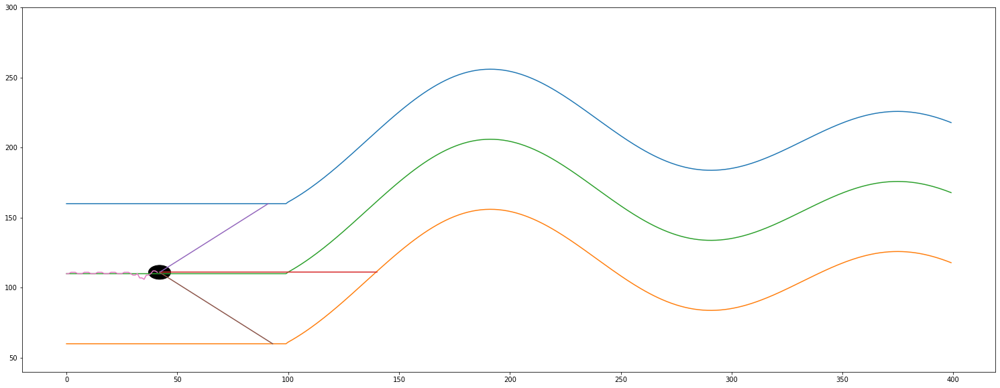

------------------------------ IF i % 3 == 0 ------------------------------
# i =  42
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (43, 3)
y.shape =  (43, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


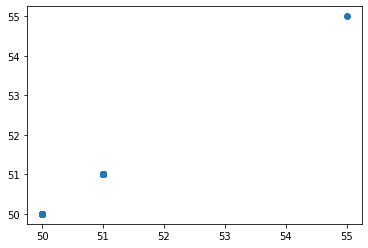

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.9918543  0.93729896]]


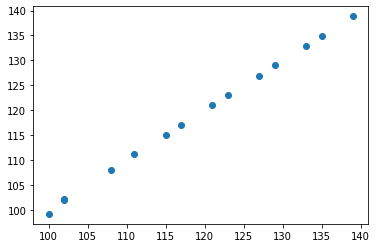

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


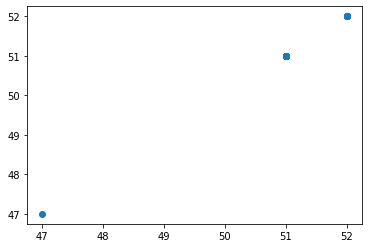

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.42108547e-14]]
-------- 1 y up ->  center =  [[2.96701041]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[50 -3]]
		 _X_center =  [[99 -3]]
		 _X_right  =  [[52 -3]]
		 predicted_left   =  [[53.]]
		 predicted_center =  [[96.41953642]]
		 predicted_right  =  [[49.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[0.9918543  0.93729896]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =

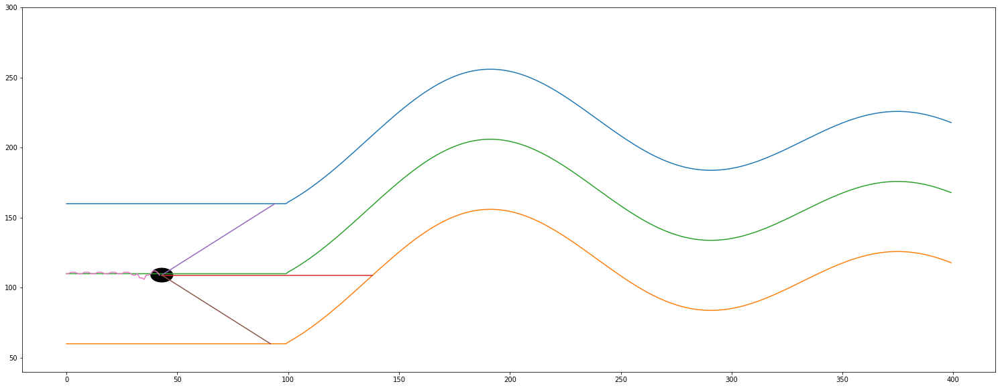

------------------------------ IF i % 3 == 1 ------------------------------
# i =  43
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[52 96 50]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.5        -0.07317073  0.5       ]]
actual predicted =  [1.04333909]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265

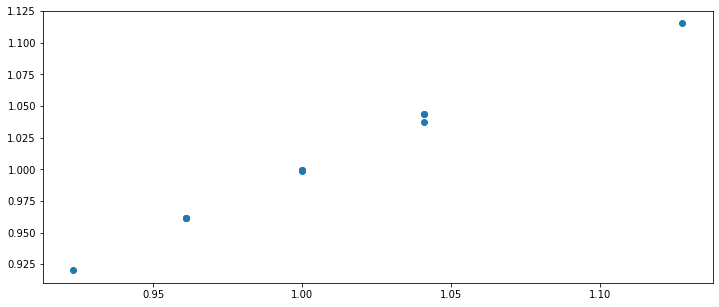

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  43
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(14, 4)
(14, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([

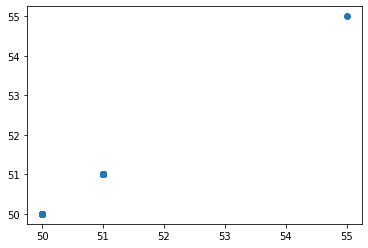

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.9918543  0.93729896]]


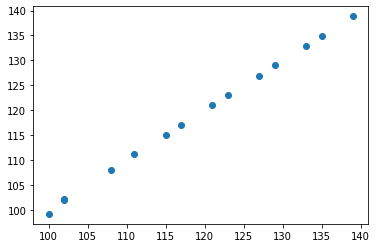

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


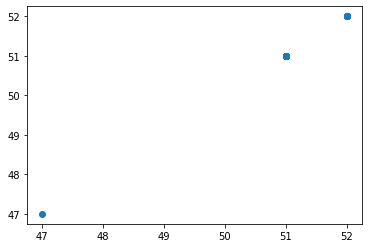

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.42108547e-14]]
-------- 1 y up ->  center =  [[2.96701041]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[52 -3]]
		 _X_center =  [[96 -3]]
		 _X_right  =  [[50 -3]]
		 predicted_left   =  [[55.]]
		 predicted_center =  [[93.44397351]]
		 predicted_right  =  [[47.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[0.9918543  0.93729896]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =

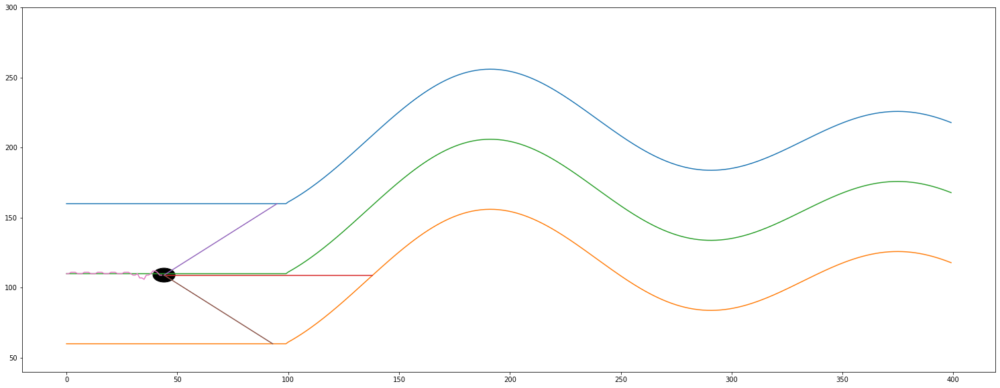

------------------------------ IF i % 3 == 2 ------------------------------
# i =  44
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  96
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  44
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  45
			 len(self.sensor_left)   =  45
			 len(self.sensor_center) =  45
			 len(self.sensor_right)  =  45
			 self.x                  =  44
			 -------------- Teszt End --------------
self.y =  110.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  44
  Ha már van elég befor

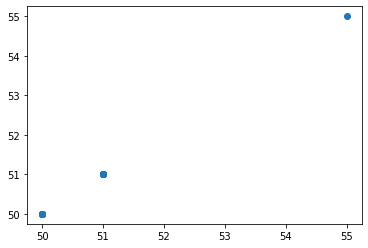

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99347173 0.92548216]]


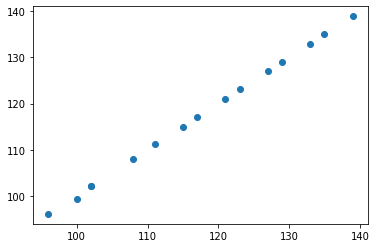

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


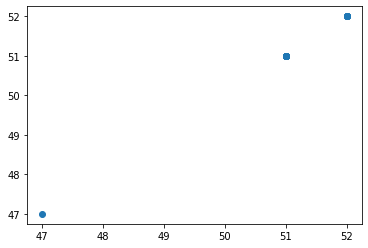

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.36557432e-14]]
-------- 1 y up ->  center =  [[2.75483152]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[96 -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[54.]]
		 predicted_center =  [[93.432717]]
		 predicted_right  =  [[48.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[0.99347173 0.92548216]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [

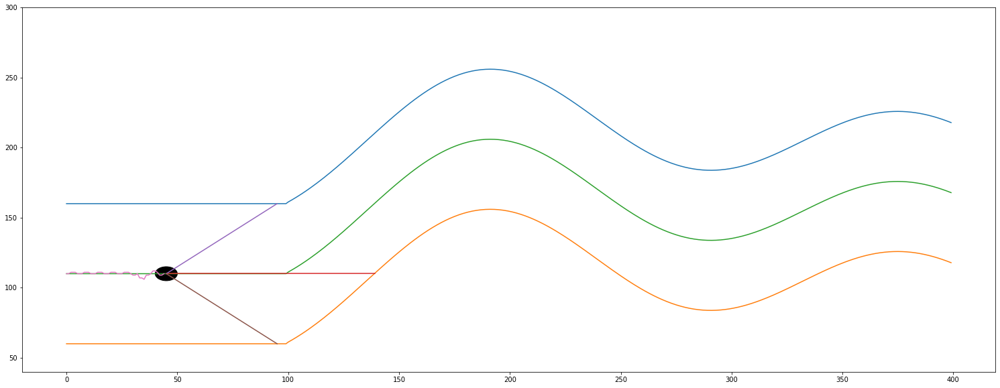

------------------------------ IF i % 3 == 0 ------------------------------
# i =  45
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (46, 3)
y.shape =  (46, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]]
y       =  [[1.        ]
 [1.        ]
 [1.       

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


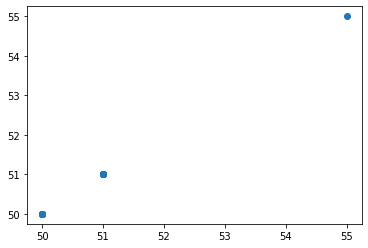

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99347173 0.92548216]]


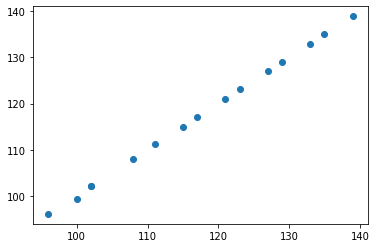

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


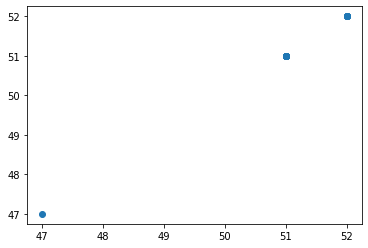

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.36557432e-14]]
-------- 1 y up ->  center =  [[2.75483152]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[95 -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[54.]]
		 predicted_center =  [[92.43924527]]
		 predicted_right  =  [[48.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[0.99347173 0.92548216]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   = 

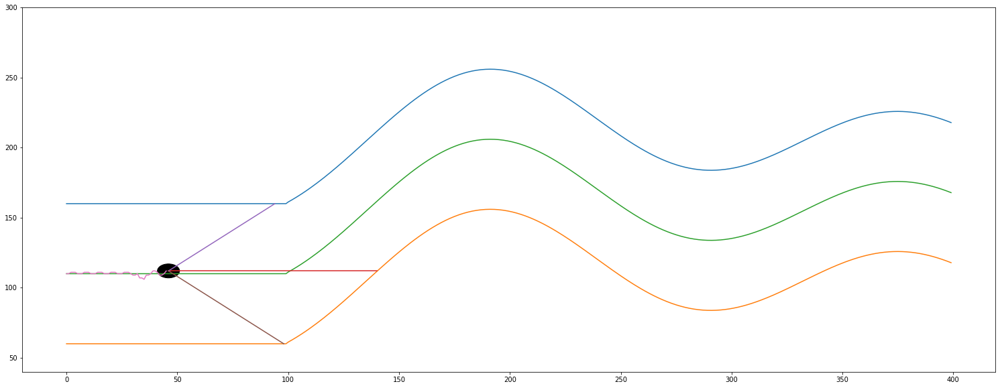

------------------------------ IF i % 3 == 1 ------------------------------
# i =  46
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[49 95 53]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0. 0. 1.]]
actual predicted =  [0.92117704]
actual self.y_distance[-1] =  0.9230769230769231
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265306123, 1.0408163265306123,

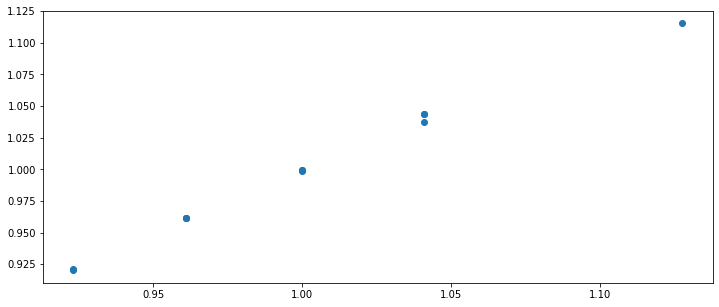

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  46
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(15, 4)
(15, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), arr

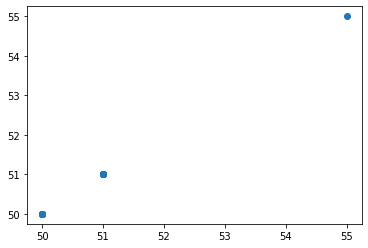

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99347173 0.92548216]]


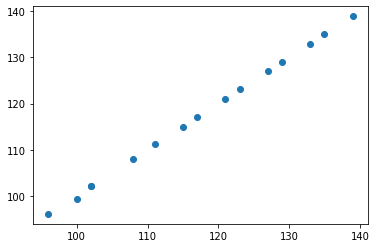

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


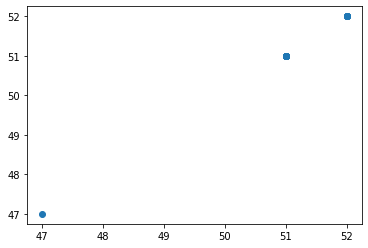

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.36557432e-14]]
-------- 1 y up ->  center =  [[2.75483152]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[49 -3]]
		 _X_center =  [[95 -3]]
		 _X_right  =  [[53 -3]]
		 predicted_left   =  [[52.]]
		 predicted_center =  [[92.43924527]]
		 predicted_right  =  [[50.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[0.99347173 0.92548216]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   = 

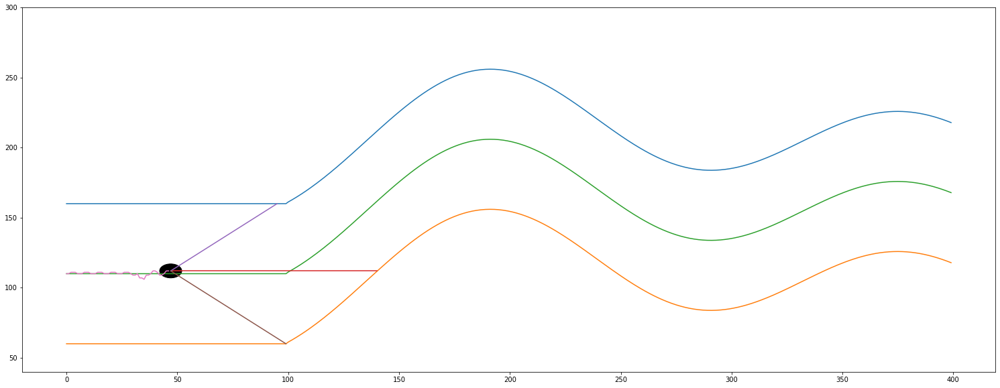

------------------------------ IF i % 3 == 2 ------------------------------
# i =  47
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  94
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  47
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  48
			 len(self.sensor_left)   =  48
			 len(self.sensor_center) =  48
			 len(self.sensor_right)  =  48
			 self.x                  =  47
			 -------------- Teszt End --------------
self.y =  111.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  47
  Ha m

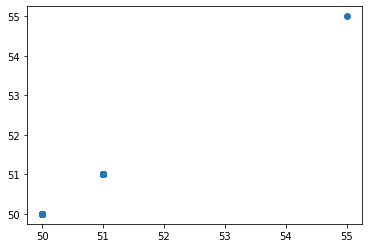

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.98890725 0.88609275]]


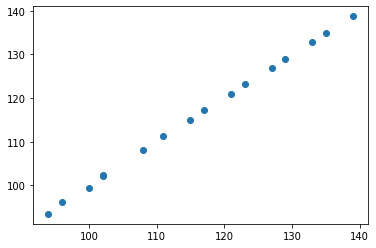

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


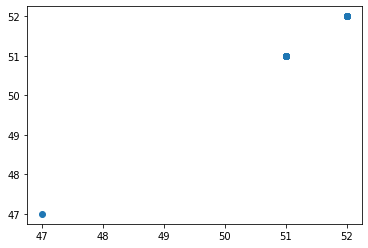

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.39888101e-14]]
-------- 1 y up ->  center =  [[3.28259972]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[50 -3]]
		 _X_center =  [[94 -3]]
		 _X_right  =  [[52 -3]]
		 predicted_left   =  [[53.]]
		 predicted_center =  [[91.70660255]]
		 predicted_right  =  [[49.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[0.98890725 0.88609275]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =

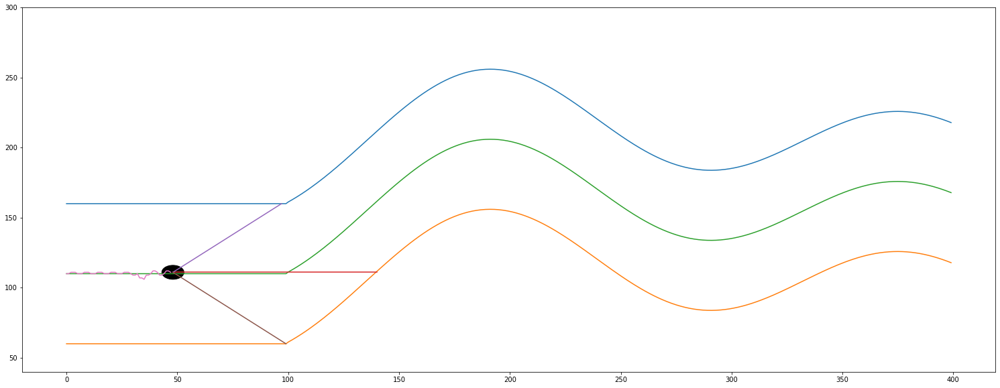

------------------------------ IF i % 3 == 0 ------------------------------
# i =  48
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (49, 3)
y.shape =  (49, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]]
y    

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


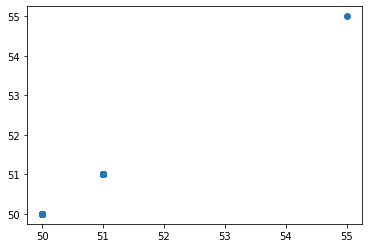

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.98890725 0.88609275]]


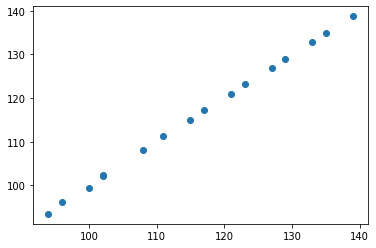

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


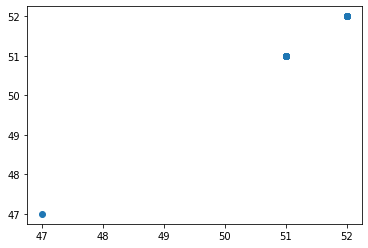

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.39888101e-14]]
-------- 1 y up ->  center =  [[3.28259972]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[50 -3]]
		 _X_center =  [[93 -3]]
		 _X_right  =  [[52 -3]]
		 predicted_left   =  [[53.]]
		 predicted_center =  [[90.7176953]]
		 predicted_right  =  [[49.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[0.98890725 0.88609275]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   = 

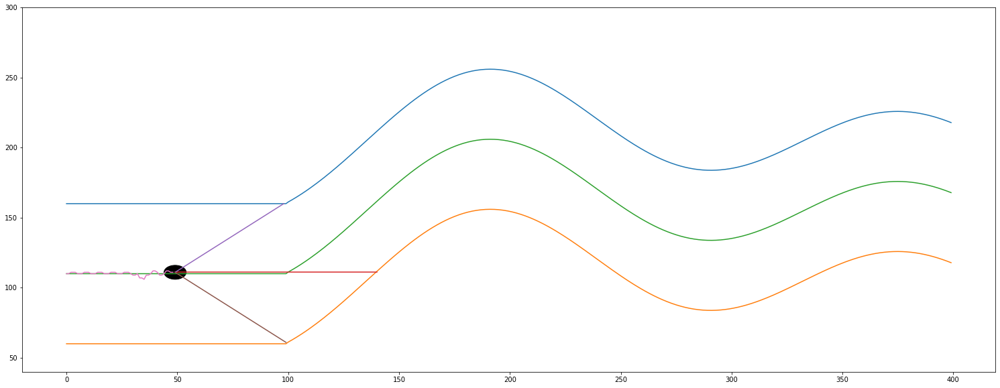

------------------------------ IF i % 3 == 1 ------------------------------
# i =  49
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[50 92 51]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.16666667 -0.0212766   0.66666667]]
actual predicted =  [0.98167232]
actual self.y_distance[-1] =  0.9607843137254902
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265

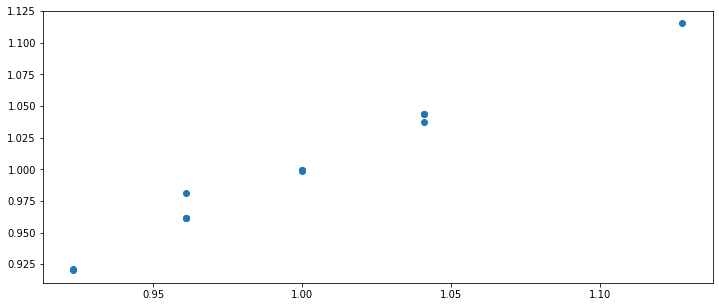

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  49
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(16, 4)
(16, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]),

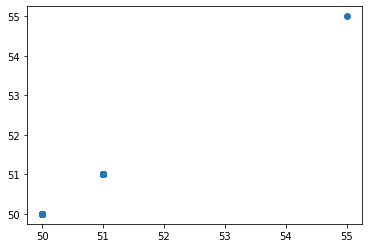

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.98890725 0.88609275]]


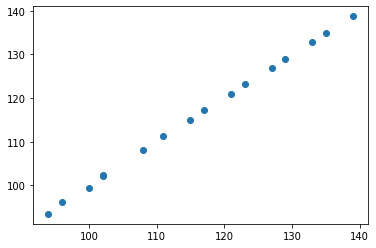

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


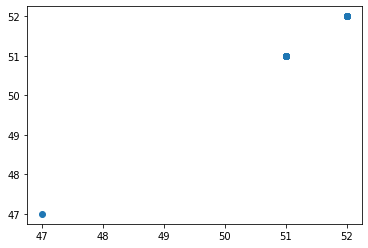

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.39888101e-14]]
-------- 1 y up ->  center =  [[3.28259972]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[50 -3]]
		 _X_center =  [[92 -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[53.]]
		 predicted_center =  [[89.72878806]]
		 predicted_right  =  [[48.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[0.98890725 0.88609275]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =

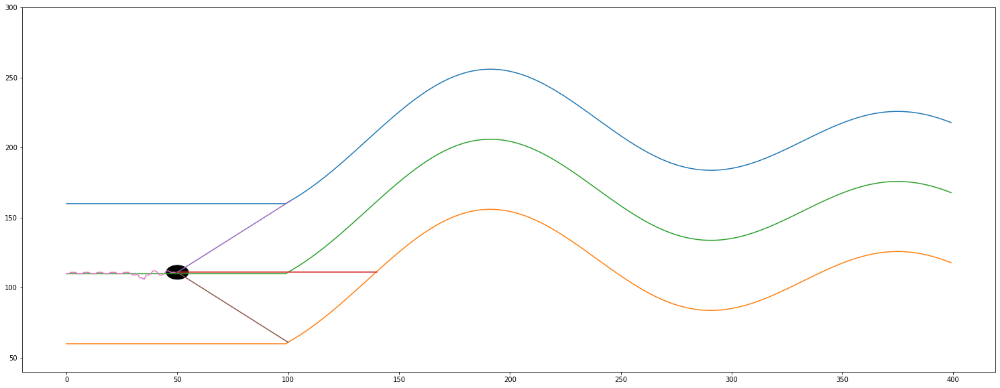

------------------------------ IF i % 3 == 2 ------------------------------
# i =  50
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  91
Sensor from left wall =  49
Sensor from right wall =  51
most távolsagra van a felső faltól =  48.0
most távolsagra van az alsó faltól =  52.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  50
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9230769230769231
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  51
			 len(self.sensor_left)   =  51
			 len(self.sensor_center) =  51
			 len(self.sensor_right)  =  51
			 self.x                  =  50
			 -------------- Teszt End --------------
self.y =  112.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  50
  Ha már

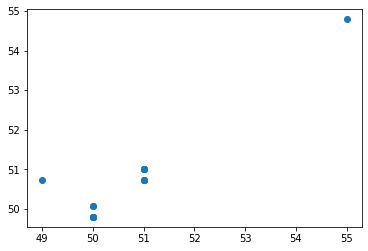

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99668418 0.81803983]]


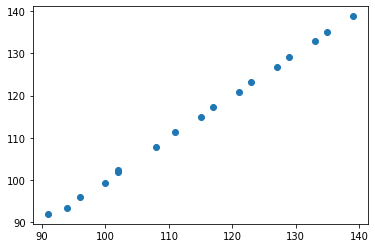

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.98290598 0.93518519]]


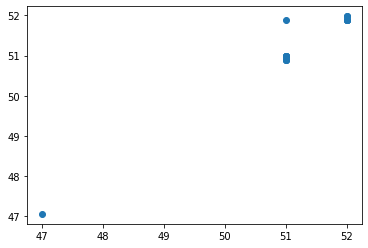

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[2.61971831]]
-------- 1 y up ->  center =  [[2.26283957]]
-------- 1 y up ->  right  =  [[2.73789174]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[49 -3]]
		 _X_center =  [[91 -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[52.22535211]]
		 predicted_center =  [[88.69225657]]
		 predicted_right  =  [[48.14245014]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.94366197 -1.07746479]]
		 regression_center.coef_ =  [[0.99668418 0.81803983]]
		 regression_right.coef_  =  [[0.9829

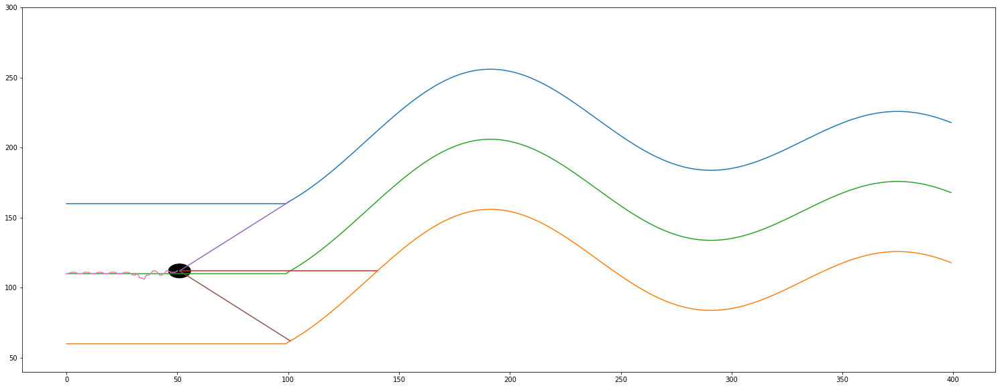

------------------------------ IF i % 3 == 0 ------------------------------
# i =  51
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (52, 3)
y.shape =  (52, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


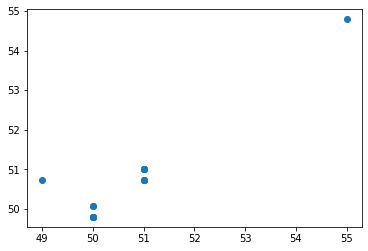

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99668418 0.81803983]]


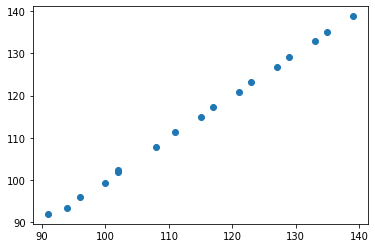

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.98290598 0.93518519]]


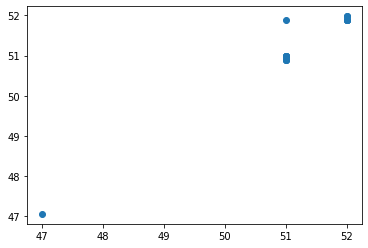

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[2.61971831]]
-------- 1 y up ->  center =  [[2.26283957]]
-------- 1 y up ->  right  =  [[2.73789174]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[90 -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[54.11267606]]
		 predicted_center =  [[87.69557238]]
		 predicted_right  =  [[48.14245014]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.94366197 -1.07746479]]
		 regression_center.coef_ =  [[0.99668418 0.81803983]]
		 regression_right.coef_  =  [[0.9829

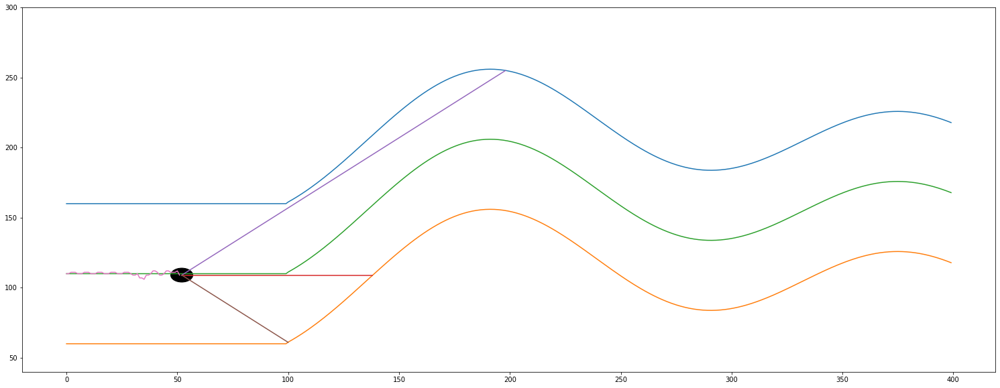

------------------------------ IF i % 3 == 1 ------------------------------
# i =  52
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[147  87  49]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[16.33333333 -0.06        0.33333333]]
actual predicted =  [1.73937263]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163

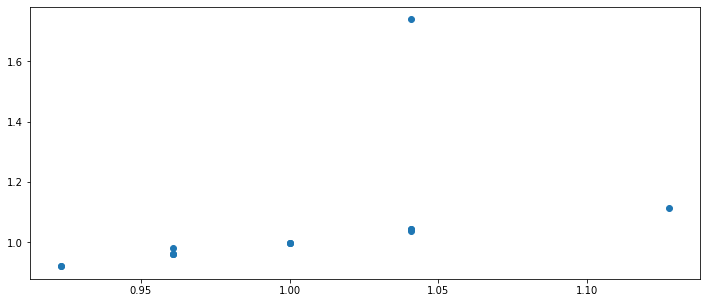

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  52
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(17, 4)
(17, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52

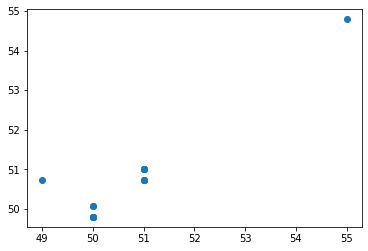

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99668418 0.81803983]]


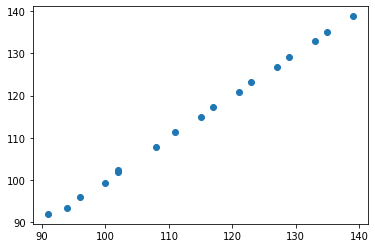

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.98290598 0.93518519]]


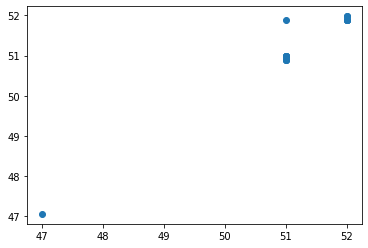

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[2.61971831]]
-------- 1 y up ->  center =  [[2.26283957]]
-------- 1 y up ->  right  =  [[2.73789174]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[147  -3]]
		 _X_center =  [[87 -3]]
		 _X_right  =  [[49 -3]]
		 predicted_left   =  [[144.70422535]]
		 predicted_center =  [[84.70551984]]
		 predicted_right  =  [[46.17663818]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.94366197 -1.07746479]]
		 regression_center.coef_ =  [[0.99668418 0.81803983]]
		 regression_right.coef_  =  [[0.9

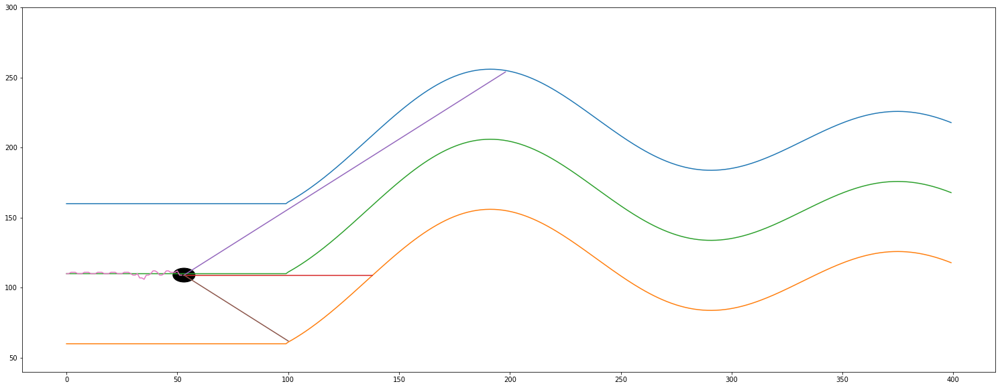

------------------------------ IF i % 3 == 2 ------------------------------
# i =  53
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  86
Sensor from left wall =  147
Sensor from right wall =  48
most távolsagra van a felső faltól =  52.0
most távolsagra van az alsó faltól =  48.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  53
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0833333333333333
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  54
			 len(self.sensor_left)   =  54
			 len(self.sensor_center) =  54
			 len(self.sensor_right)  =  54
			 self.x                  =  53
			 -------------- Teszt End --------------
self.y =  108.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  53
  Ha 

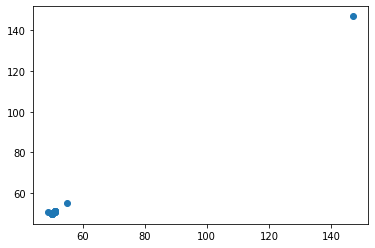

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99297169 0.78597747]]


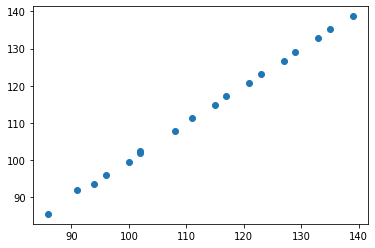

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.88541667 0.85069444]]


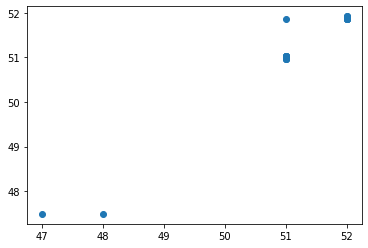

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.21536109]]
-------- 1 y up ->  center =  [[2.68152621]]
-------- 1 y up ->  right  =  [[7.57986111]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[147  -3]]
		 _X_center =  [[86 -3]]
		 _X_right  =  [[48 -3]]
		 predicted_left   =  [[150.2117945]]
		 predicted_center =  [[83.94020986]]
		 predicted_right  =  [[45.79166667]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.99986399 -1.1117534 ]]
		 regression_center.coef_ =  [[0.99297169 0.78597747]]
		 regression_right.coef_  =  [[0.8

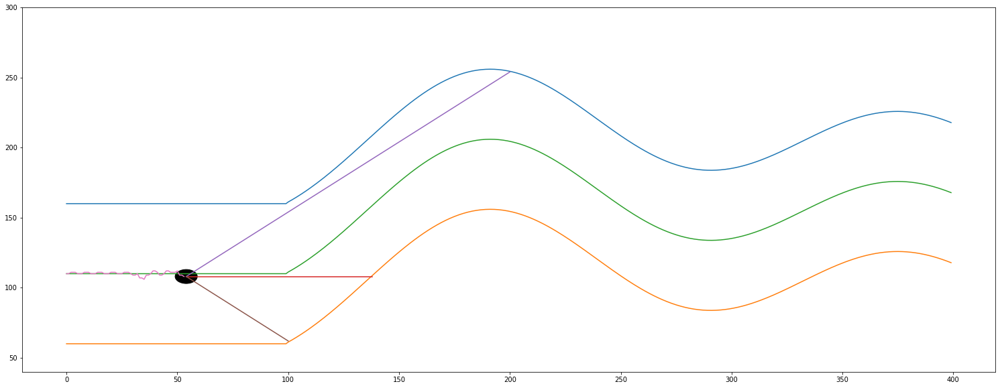

------------------------------ IF i % 3 == 0 ------------------------------
# i =  54
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (55, 3)
y.shape =  (55, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


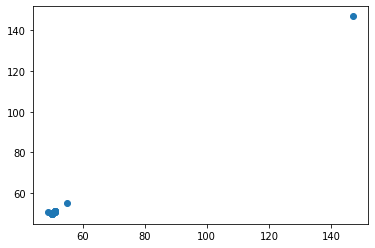

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99297169 0.78597747]]


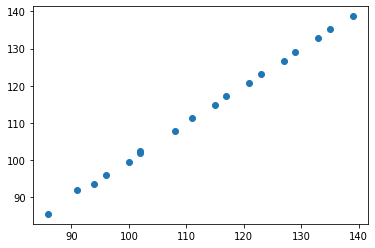

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.88541667 0.85069444]]


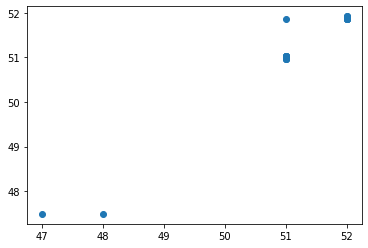

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.21536109]]
-------- 1 y up ->  center =  [[2.68152621]]
-------- 1 y up ->  right  =  [[7.57986111]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[147  -3]]
		 _X_center =  [[85 -3]]
		 _X_right  =  [[47 -3]]
		 predicted_left   =  [[150.2117945]]
		 predicted_center =  [[82.94723817]]
		 predicted_right  =  [[44.90625]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.99986399 -1.1117534 ]]
		 regression_center.coef_ =  [[0.99297169 0.78597747]]
		 regression_right.coef_  =  [[0.8854

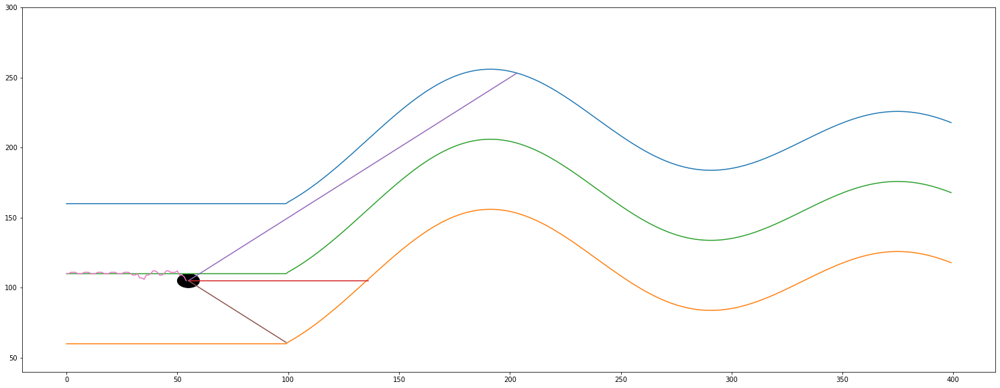

------------------------------ IF i % 3 == 1 ------------------------------
# i =  55
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[149  82  45]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 1.02040816 -0.05454545 -0.33333333]]
actual predicted =  [1.17531633]
actual self.y_distance[-1] =  1.2222222222222223
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163

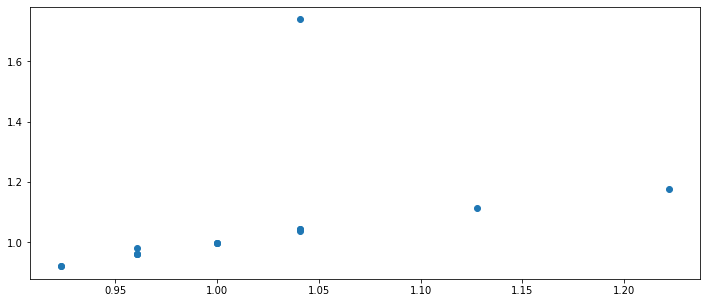

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  55
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(18, 4)
(18, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,

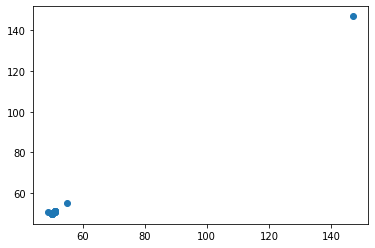

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99297169 0.78597747]]


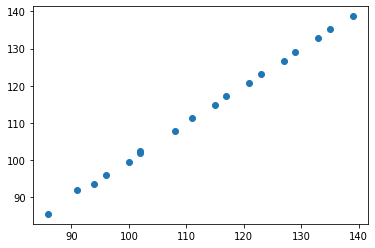

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.88541667 0.85069444]]


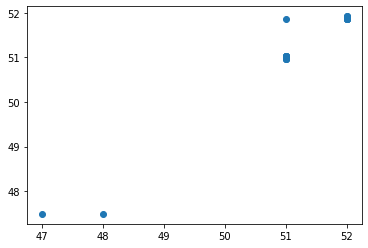

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.21536109]]
-------- 1 y up ->  center =  [[2.68152621]]
-------- 1 y up ->  right  =  [[7.57986111]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[149  -3]]
		 _X_center =  [[82 -3]]
		 _X_right  =  [[45 -3]]
		 predicted_left   =  [[152.21152248]]
		 predicted_center =  [[79.9683231]]
		 predicted_right  =  [[43.13541667]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.99986399 -1.1117534 ]]
		 regression_center.coef_ =  [[0.99297169 0.78597747]]
		 regression_right.coef_  =  [[0.8

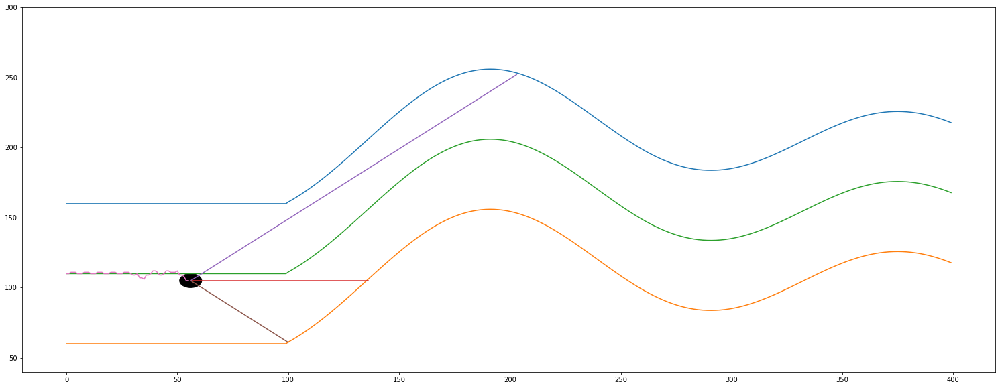

------------------------------ IF i % 3 == 2 ------------------------------
# i =  56
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  81
Sensor from left wall =  148
Sensor from right wall =  45
most távolsagra van a felső faltól =  54.0
most távolsagra van az alsó faltól =  46.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  56
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.173913043478261
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  57
			 len(self.sensor_left)   =  57
			 len(self.sensor_center) =  57
			 len(self.sensor_right)  =  57
			 self.x                  =  56
			 -------------- Teszt End --------------
self.y =  106.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  56
  Ha már

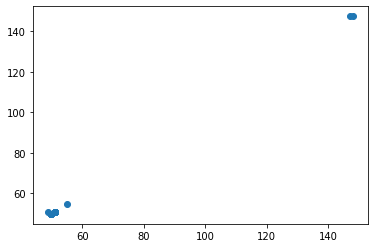

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99902261 0.73287179]]


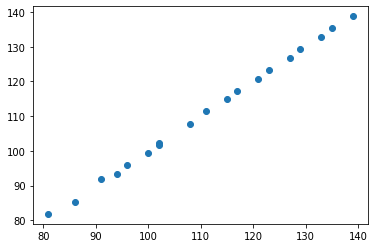

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.01423098 0.85322022]]


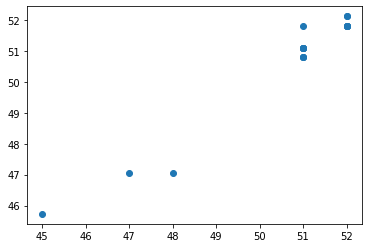

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.48143663]]
-------- 1 y up ->  center =  [[1.90702396]]
-------- 1 y up ->  right  =  [[1.10125889]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[148  -3]]
		 _X_center =  [[81 -3]]
		 _X_right  =  [[45 -3]]
		 predicted_left   =  [[151.65420788]]
		 predicted_center =  [[78.89734578]]
		 predicted_right  =  [[42.31454114]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0063467  -1.05066993]]
		 regression_center.coef_ =  [[0.99902261 0.73287179]]
		 regression_right.coef_  =  [[1.

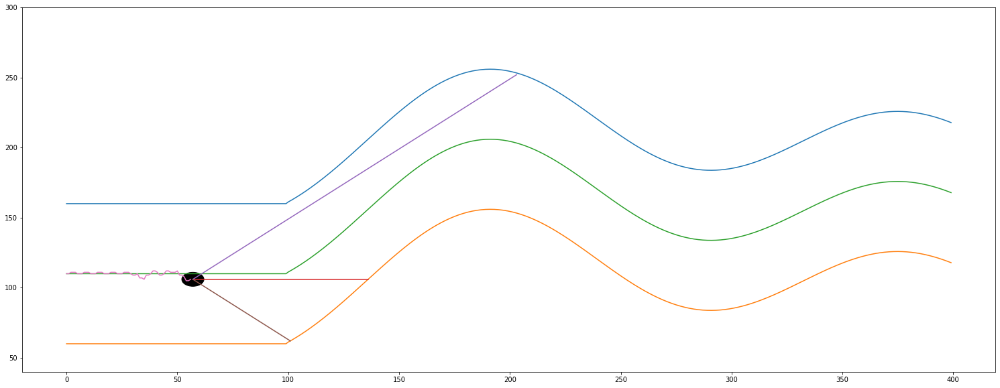

------------------------------ IF i % 3 == 0 ------------------------------
# i =  57
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (58, 3)
y.shape =  (58, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


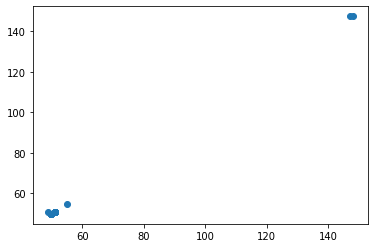

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99902261 0.73287179]]


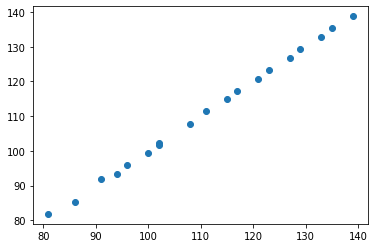

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.01423098 0.85322022]]


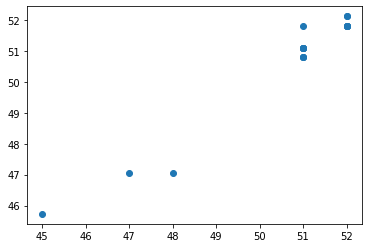

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.48143663]]
-------- 1 y up ->  center =  [[1.90702396]]
-------- 1 y up ->  right  =  [[1.10125889]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[147  -3]]
		 _X_center =  [[80 -3]]
		 _X_right  =  [[45 -3]]
		 predicted_left   =  [[150.64786118]]
		 predicted_center =  [[77.89832317]]
		 predicted_right  =  [[42.31454114]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0063467  -1.05066993]]
		 regression_center.coef_ =  [[0.99902261 0.73287179]]
		 regression_right.coef_  =  [[1.

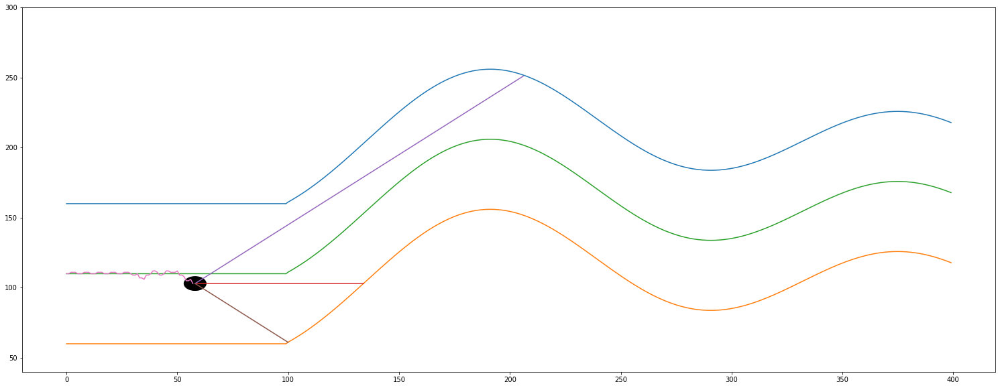

------------------------------ IF i % 3 == 1 ------------------------------
# i =  58
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[149  77  43]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 1.   -0.05 -0.25]]
actual predicted =  [1.27473571]
actual self.y_distance[-1] =  1.3255813953488371
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265306123, 1.04081

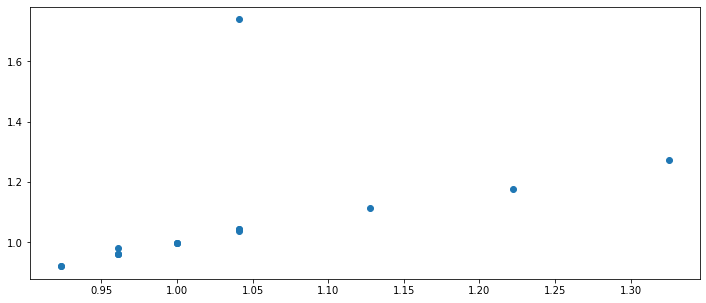

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  58
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1.]
(19, 4)
(19, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([105., 148.,  81.,  45.])]
[array([111.,  50., 

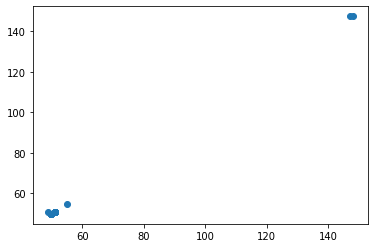

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99902261 0.73287179]]


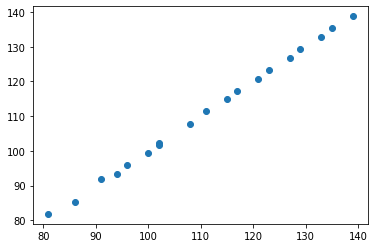

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.01423098 0.85322022]]


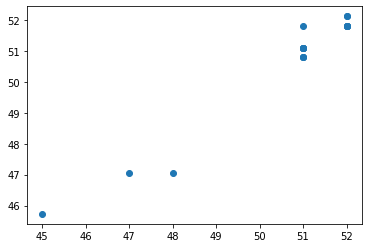

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.48143663]]
-------- 1 y up ->  center =  [[1.90702396]]
-------- 1 y up ->  right  =  [[1.10125889]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[149  -3]]
		 _X_center =  [[77 -3]]
		 _X_right  =  [[43 -3]]
		 predicted_left   =  [[152.66055458]]
		 predicted_center =  [[74.90125533]]
		 predicted_right  =  [[40.28607918]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0063467  -1.05066993]]
		 regression_center.coef_ =  [[0.99902261 0.73287179]]
		 regression_right.coef_  =  [[1.

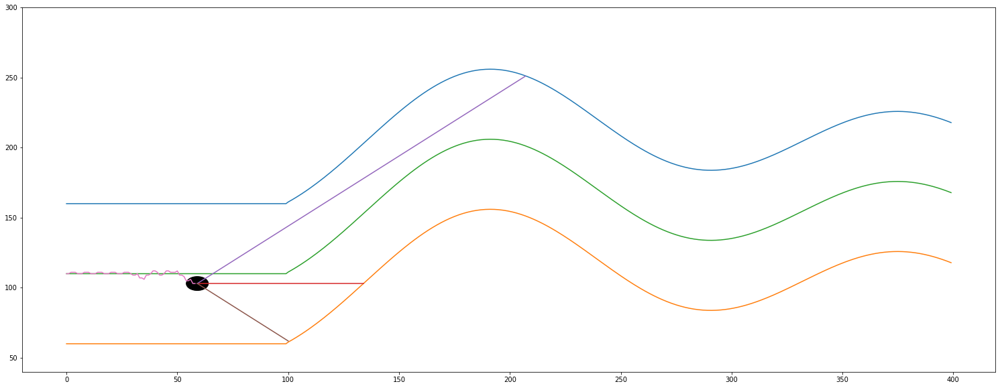

------------------------------ IF i % 3 == 2 ------------------------------
# i =  59
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  75
Sensor from left wall =  149
Sensor from right wall =  42
most távolsagra van a felső faltól =  58.0
most távolsagra van az alsó faltól =  42.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  59
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.380952380952381
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  60
			 len(self.sensor_left)   =  60
			 len(self.sensor_center) =  60
			 len(self.sensor_right)  =  60
			 self.x                  =  59
			 -------------- Teszt End --------------
self.y =  102.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  59
  Ha m

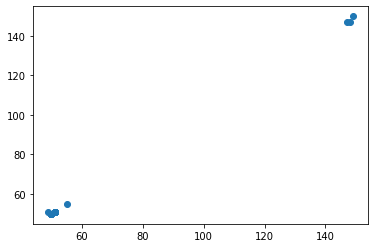

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00080457 0.74895406]]


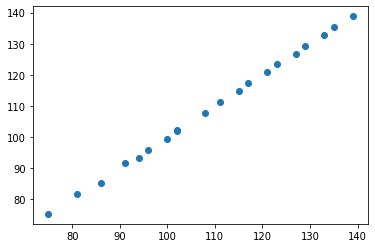

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.95262024 0.79289304]]


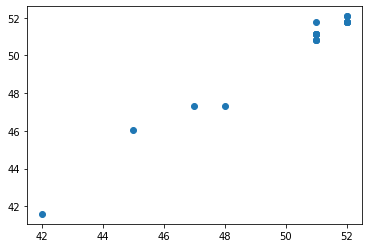

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.16585043]]
-------- 1 y up ->  center =  [[1.71189999]]
-------- 1 y up ->  right  =  [[4.12634602]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[149  -3]]
		 _X_center =  [[75 -3]]
		 _X_right  =  [[42 -3]]
		 predicted_left   =  [[151.97746465]]
		 predicted_center =  [[72.77562164]]
		 predicted_right  =  [[40.01220388]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00109568 -0.99528857]]
		 regression_center.coef_ =  [[1.00080457 0.74895406]]
		 regression_right.coef_  =  [[0.

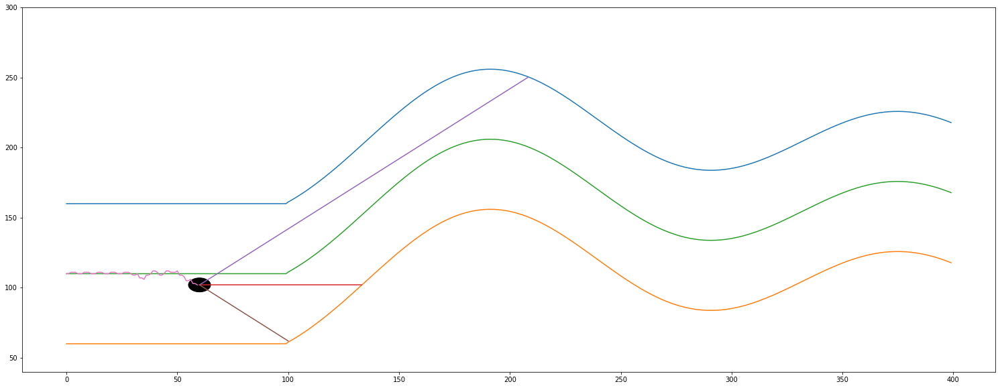

------------------------------ IF i % 3 == 0 ------------------------------
# i =  60
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (61, 3)
y.shape =  (61, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


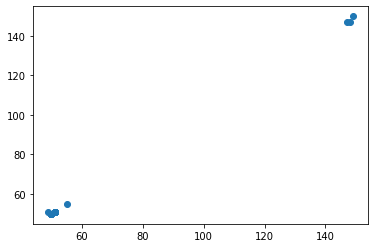

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00080457 0.74895406]]


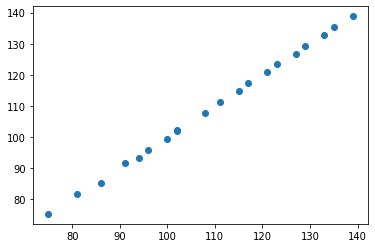

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.95262024 0.79289304]]


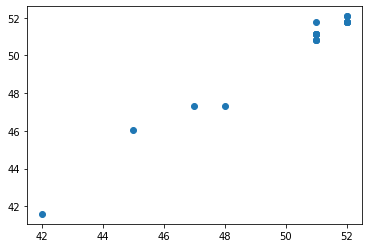

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.16585043]]
-------- 1 y up ->  center =  [[1.71189999]]
-------- 1 y up ->  right  =  [[4.12634602]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[149  -3]]
		 _X_center =  [[74 -3]]
		 _X_right  =  [[41 -3]]
		 predicted_left   =  [[151.97746465]]
		 predicted_center =  [[71.77481708]]
		 predicted_right  =  [[39.05958363]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00109568 -0.99528857]]
		 regression_center.coef_ =  [[1.00080457 0.74895406]]
		 regression_right.coef_  =  [[0.

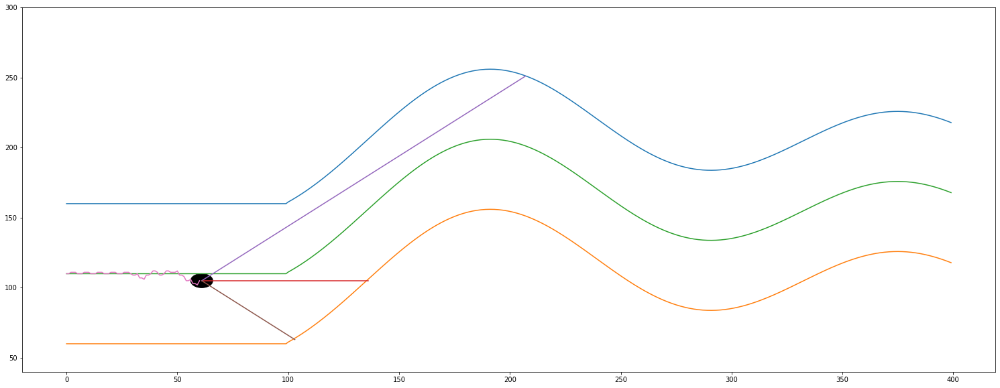

------------------------------ IF i % 3 == 1 ------------------------------
# i =  61
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[147  76  43]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.98       0.03030303 0.16666667]]
actual predicted =  [1.28754395]
actual self.y_distance[-1] =  1.2222222222222223
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265

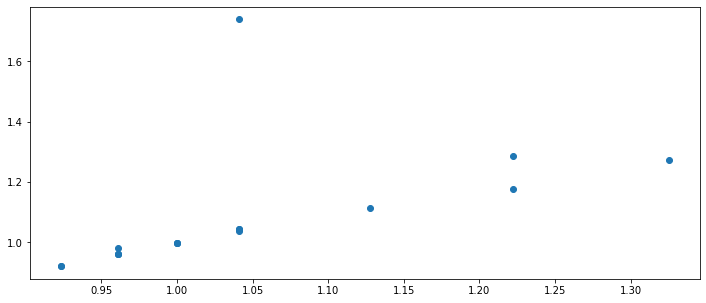

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  61
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.]
(20, 4)
(20, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([105., 148.,  81.,  45.]), array([103., 149

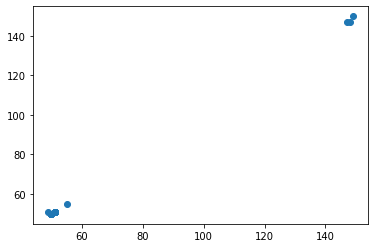

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00080457 0.74895406]]


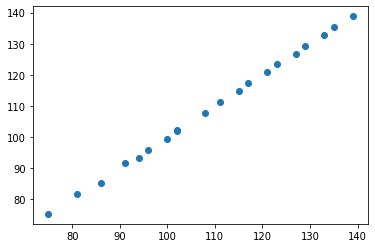

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.95262024 0.79289304]]


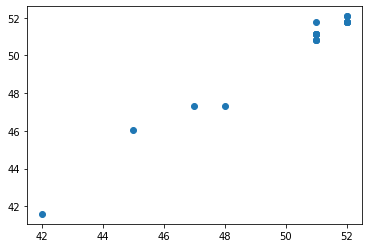

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.16585043]]
-------- 1 y up ->  center =  [[1.71189999]]
-------- 1 y up ->  right  =  [[4.12634602]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[147  -3]]
		 _X_center =  [[76 -3]]
		 _X_right  =  [[43 -3]]
		 predicted_left   =  [[149.97527328]]
		 predicted_center =  [[73.77642621]]
		 predicted_right  =  [[40.96482412]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00109568 -0.99528857]]
		 regression_center.coef_ =  [[1.00080457 0.74895406]]
		 regression_right.coef_  =  [[0.

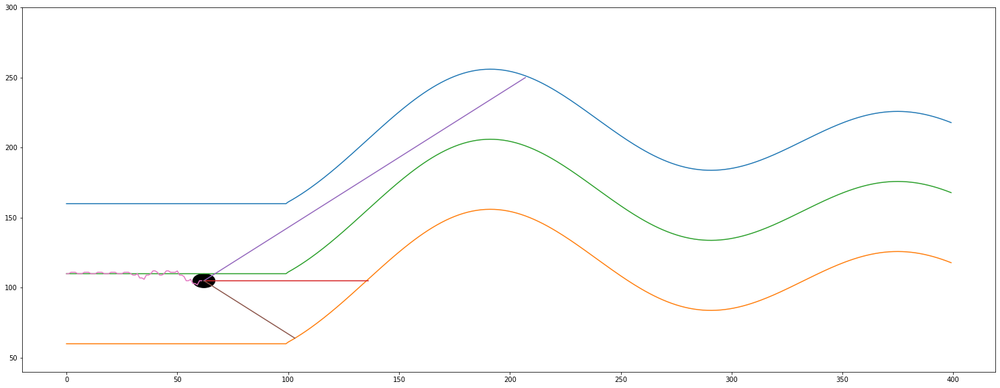

------------------------------ IF i % 3 == 2 ------------------------------
# i =  62
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  75
Sensor from left wall =  146
Sensor from right wall =  43
most távolsagra van a felső faltól =  54.0
most távolsagra van az alsó faltól =  46.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  62
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.173913043478261
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  63
			 len(self.sensor_left)   =  63
			 len(self.sensor_center) =  63
			 len(self.sensor_right)  =  63
			 self.x                  =  62
			 -------------- Teszt End --------------
self.y =  106.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  62
  Ha már

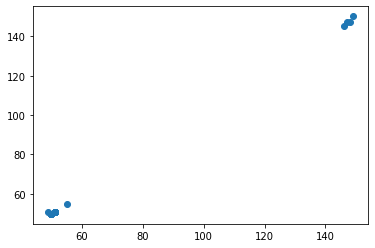

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00402403 0.71489845]]


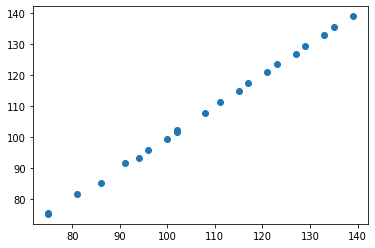

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.95942241 0.78806434]]


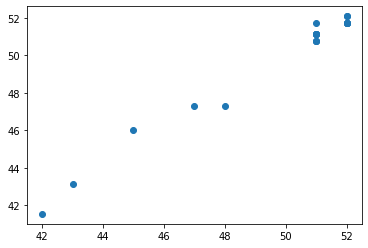

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.24941988]]
-------- 1 y up ->  center =  [[1.29962769]]
-------- 1 y up ->  right  =  [[3.78066167]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[146  -3]]
		 _X_center =  [[75 -3]]
		 _X_right  =  [[43 -3]]
		 predicted_left   =  [[149.07737096]]
		 predicted_center =  [[72.7378124]]
		 predicted_right  =  [[40.92414549]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00367777 -0.94837844]]
		 regression_center.coef_ =  [[1.00402403 0.71489845]]
		 regression_right.coef_  =  [[0.9

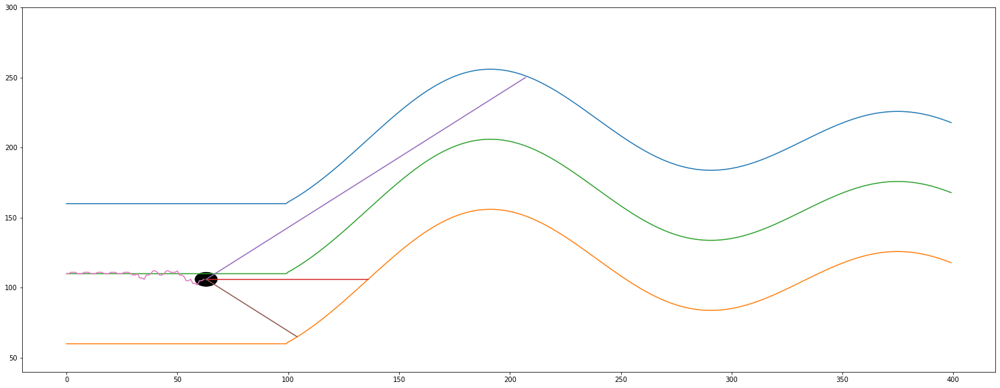

------------------------------ IF i % 3 == 0 ------------------------------
# i =  63
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (64, 3)
y.shape =  (64, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


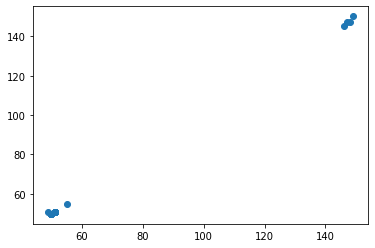

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00402403 0.71489845]]


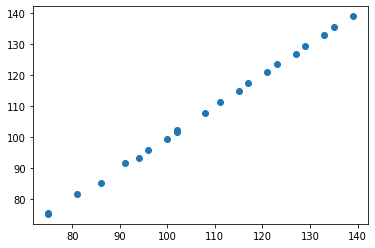

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.95942241 0.78806434]]


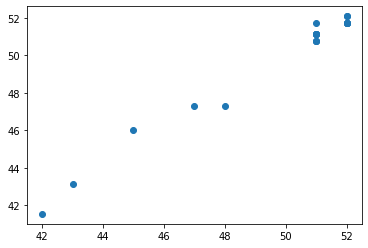

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.24941988]]
-------- 1 y up ->  center =  [[1.29962769]]
-------- 1 y up ->  right  =  [[3.78066167]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[145  -3]]
		 _X_center =  [[74 -3]]
		 _X_right  =  [[42 -3]]
		 predicted_left   =  [[148.07369319]]
		 predicted_center =  [[71.73378836]]
		 predicted_right  =  [[39.96472309]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00367777 -0.94837844]]
		 regression_center.coef_ =  [[1.00402403 0.71489845]]
		 regression_right.coef_  =  [[0.

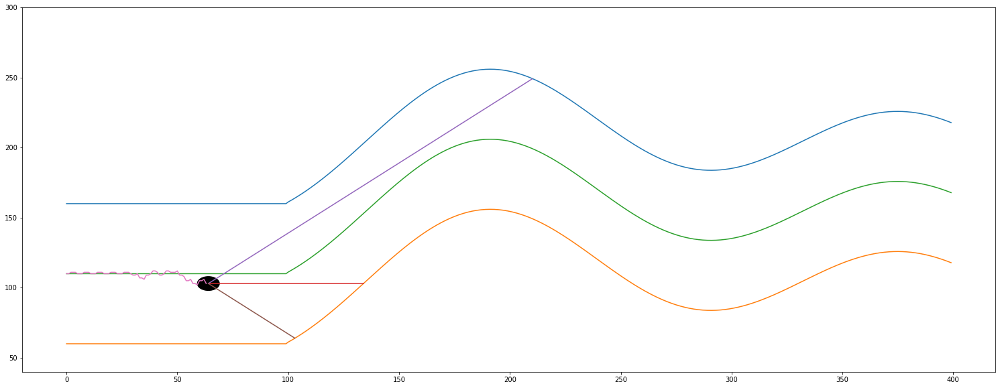

------------------------------ IF i % 3 == 1 ------------------------------
# i =  64
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[147  71  40]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.98       -0.04545455 -0.08333333]]
actual predicted =  [1.38513311]
actual self.y_distance[-1] =  1.3255813953488371
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163

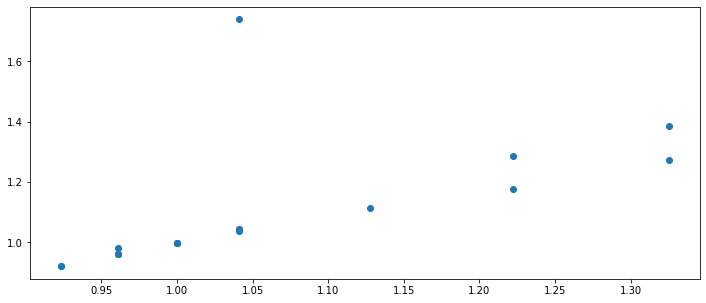

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  64
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1.]
(21, 4)
(21, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([105., 148.,  81.,  45.]), array([103.,

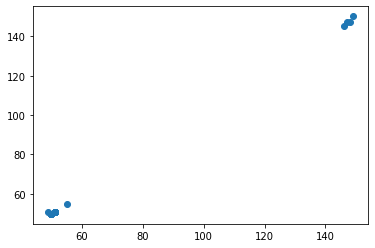

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00402403 0.71489845]]


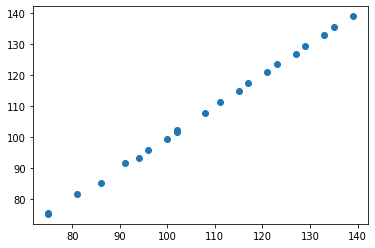

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.95942241 0.78806434]]


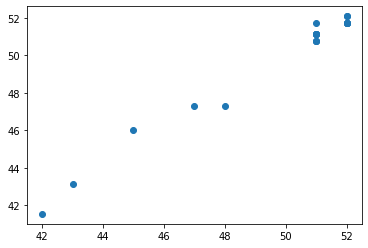

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.24941988]]
-------- 1 y up ->  center =  [[1.29962769]]
-------- 1 y up ->  right  =  [[3.78066167]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[147  -3]]
		 _X_center =  [[71 -3]]
		 _X_right  =  [[40 -3]]
		 predicted_left   =  [[150.08104873]]
		 predicted_center =  [[68.72171626]]
		 predicted_right  =  [[38.04587827]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00367777 -0.94837844]]
		 regression_center.coef_ =  [[1.00402403 0.71489845]]
		 regression_right.coef_  =  [[0.

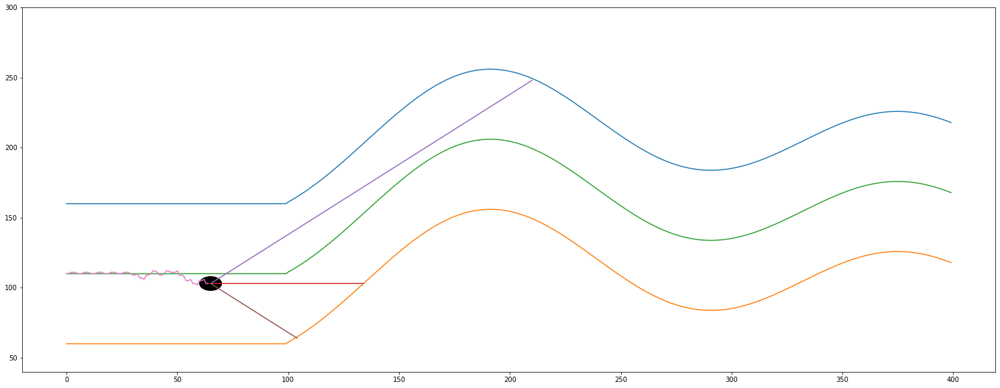

------------------------------ IF i % 3 == 2 ------------------------------
# i =  65
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  69
Sensor from left wall =  147
Sensor from right wall =  39
most távolsagra van a felső faltól =  58.0
most távolsagra van az alsó faltól =  42.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  65
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.380952380952381
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  66
			 len(self.sensor_left)   =  66
			 len(self.sensor_center) =  66
			 len(self.sensor_right)  =  66
			 self.x                  =  65
			 -------------- Teszt End --------------
self.y =  102.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  65
  Ha m

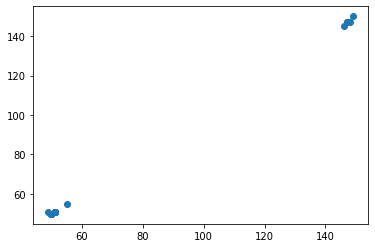

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00458623 0.72081031]]


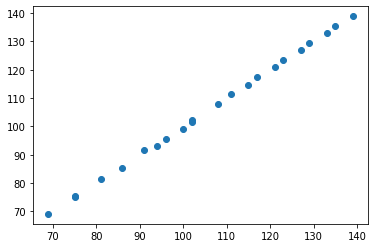

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.97920489 0.81723659]]


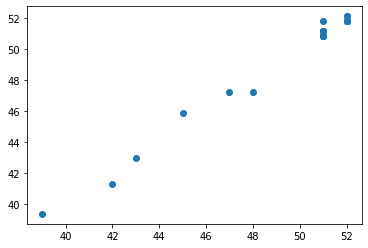

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.22541375]]
-------- 1 y up ->  center =  [[1.23988121]]
-------- 1 y up ->  right  =  [[2.82390881]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[147  -3]]
		 _X_center =  [[69 -3]]
		 _X_right  =  [[39 -3]]
		 predicted_left   =  [[150.0260701]]
		 predicted_center =  [[66.66850384]]
		 predicted_right  =  [[36.7647484]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0033238  -0.94155244]]
		 regression_center.coef_ =  [[1.00458623 0.72081031]]
		 regression_right.coef_  =  [[0.97

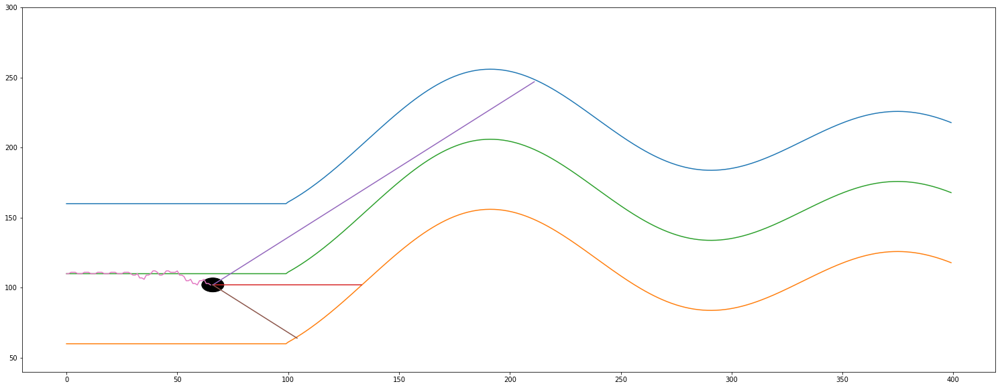

------------------------------ IF i % 3 == 0 ------------------------------
# i =  66
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (67, 3)
y.shape =  (67, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


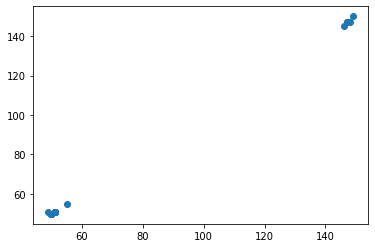

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00458623 0.72081031]]


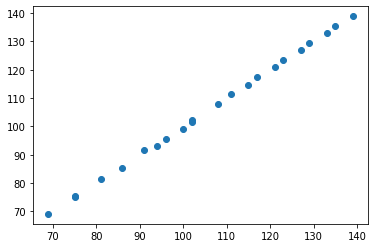

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.97920489 0.81723659]]


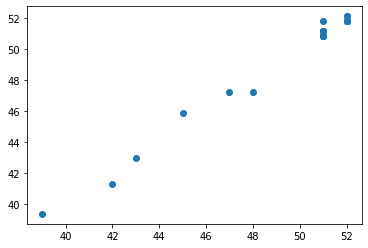

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.22541375]]
-------- 1 y up ->  center =  [[1.23988121]]
-------- 1 y up ->  right  =  [[2.82390881]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[146  -3]]
		 _X_center =  [[68 -3]]
		 _X_right  =  [[39 -3]]
		 predicted_left   =  [[149.0227463]]
		 predicted_center =  [[65.66391761]]
		 predicted_right  =  [[36.7647484]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0033238  -0.94155244]]
		 regression_center.coef_ =  [[1.00458623 0.72081031]]
		 regression_right.coef_  =  [[0.97

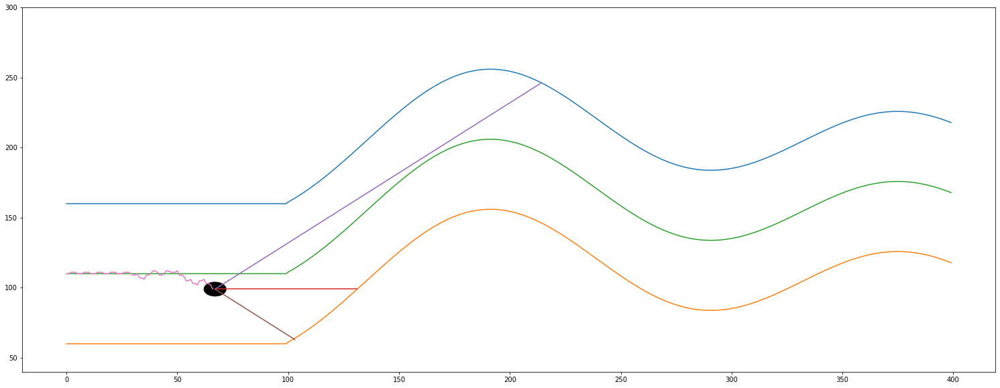

------------------------------ IF i % 3 == 1 ------------------------------
# i =  67
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[148  65  37]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.99       -0.04166667 -0.14285714]]
actual predicted =  [1.45761494]
actual self.y_distance[-1] =  1.564102564102564
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.04081632

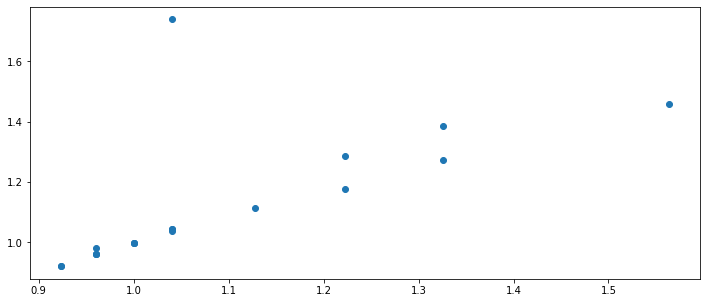

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  67
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.]
(22, 4)
(22, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([105., 148.,  81.,  45.]), array([1

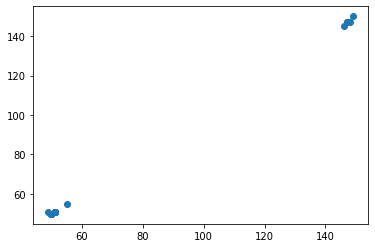

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00458623 0.72081031]]


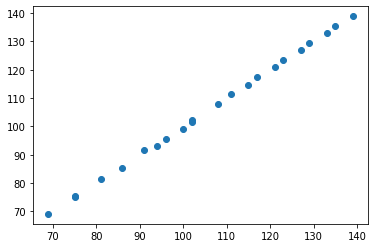

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.97920489 0.81723659]]


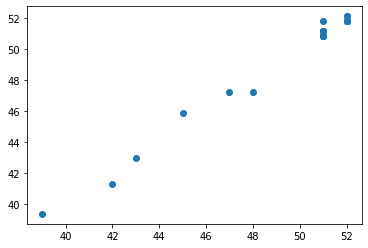

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.22541375]]
-------- 1 y up ->  center =  [[1.23988121]]
-------- 1 y up ->  right  =  [[2.82390881]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[148  -3]]
		 _X_center =  [[65 -3]]
		 _X_right  =  [[37 -3]]
		 predicted_left   =  [[151.02939389]]
		 predicted_center =  [[62.65015891]]
		 predicted_right  =  [[34.80633862]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0033238  -0.94155244]]
		 regression_center.coef_ =  [[1.00458623 0.72081031]]
		 regression_right.coef_  =  [[0.

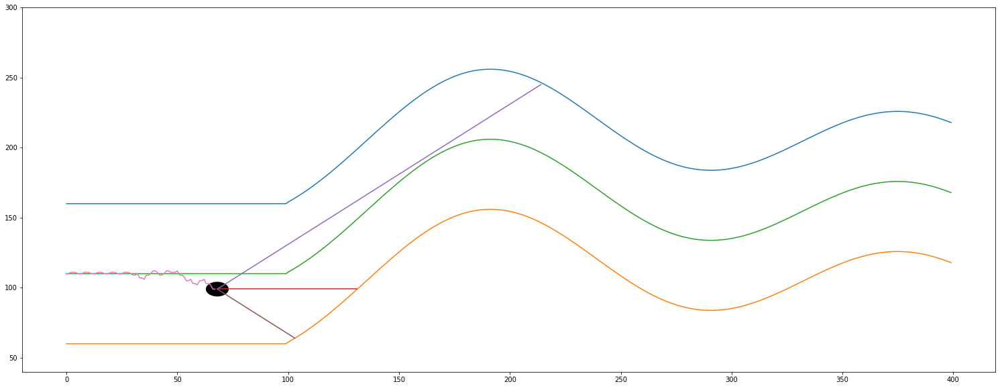

------------------------------ IF i % 3 == 2 ------------------------------
# i =  68
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  65
Sensor from left wall =  147
Sensor from right wall =  37
most távolsagra van a felső faltól =  60.0
most távolsagra van az alsó faltól =  40.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  68
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.5
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  69
			 len(self.sensor_left)   =  69
			 len(self.sensor_center) =  69
			 len(self.sensor_right)  =  69
			 self.x                  =  68
			 -------------- Teszt End --------------
self.y =  100.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  68
  Ha már van elég befo

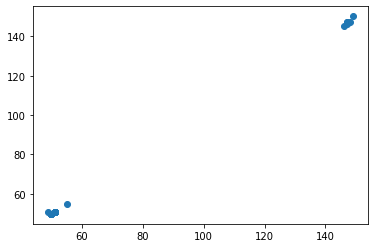

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00284847 0.73975849]]


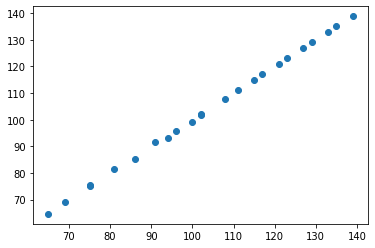

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.98175812 0.81477099]]


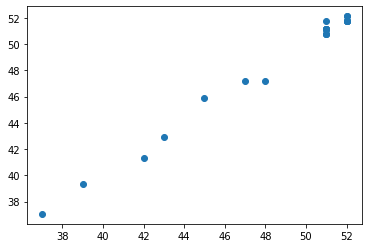

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.25991468]]
-------- 1 y up ->  center =  [[1.45755759]]
-------- 1 y up ->  right  =  [[2.69526204]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[147  -3]]
		 _X_center =  [[65 -3]]
		 _X_right  =  [[37 -3]]
		 predicted_left   =  [[150.0537487]]
		 predicted_center =  [[62.68082541]]
		 predicted_right  =  [[34.77947049]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00461769 -0.9098703 ]]
		 regression_center.coef_ =  [[1.00284847 0.73975849]]
		 regression_right.coef_  =  [[0.9

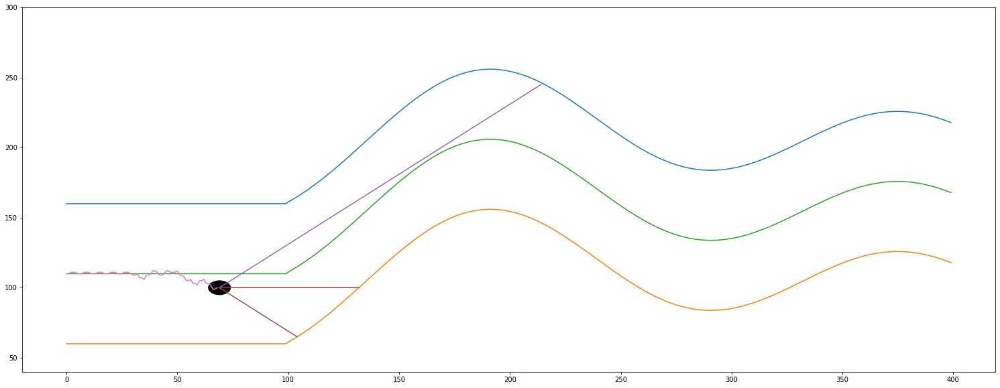

------------------------------ IF i % 3 == 0 ------------------------------
# i =  69
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (70, 3)
y.shape =  (70, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


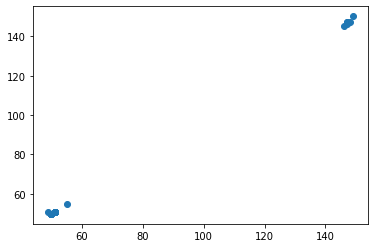

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00284847 0.73975849]]


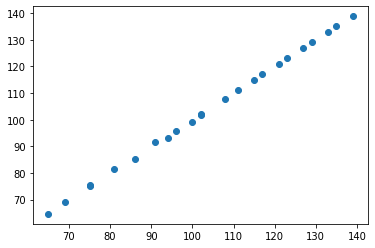

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.98175812 0.81477099]]


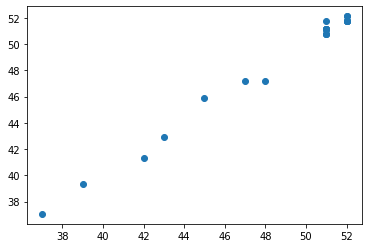

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.25991468]]
-------- 1 y up ->  center =  [[1.45755759]]
-------- 1 y up ->  right  =  [[2.69526204]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[146  -3]]
		 _X_center =  [[64 -3]]
		 _X_right  =  [[36 -3]]
		 predicted_left   =  [[149.04913101]]
		 predicted_center =  [[61.67797694]]
		 predicted_right  =  [[33.79771237]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00461769 -0.9098703 ]]
		 regression_center.coef_ =  [[1.00284847 0.73975849]]
		 regression_right.coef_  =  [[0.

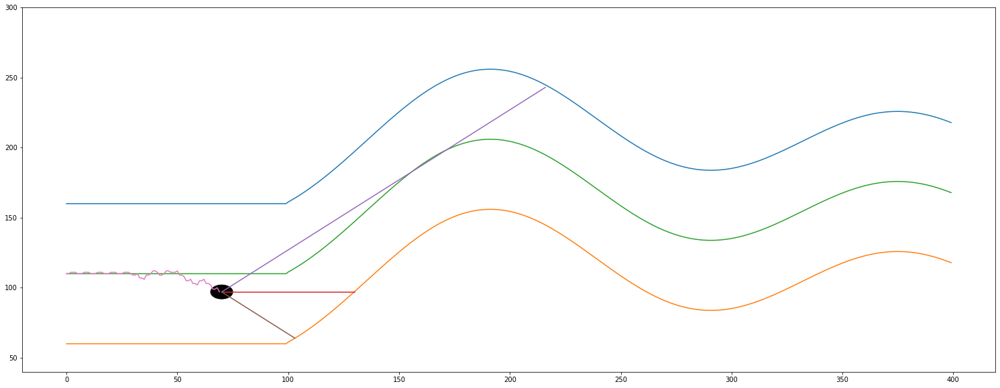

------------------------------ IF i % 3 == 1 ------------------------------
# i =  70
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[147  61  34]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.98       -0.03947368 -0.11764706]]
actual predicted =  [1.60015249]
actual self.y_distance[-1] =  1.7027027027027026
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163

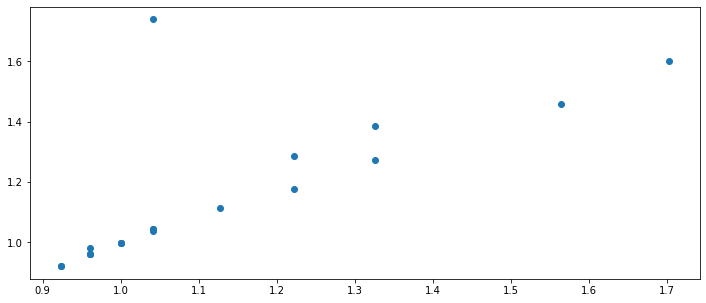

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  70
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1.]
(23, 4)
(23, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([105., 148.,  81.,  45.]), arra

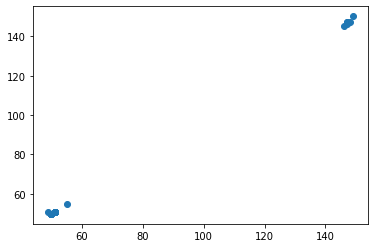

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00284847 0.73975849]]


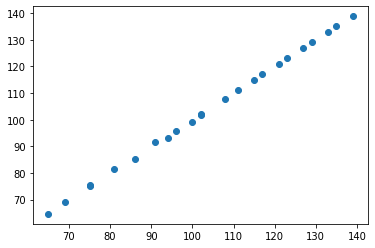

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.98175812 0.81477099]]


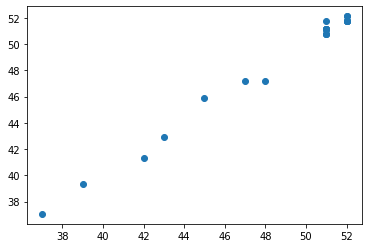

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.25991468]]
-------- 1 y up ->  center =  [[1.45755759]]
-------- 1 y up ->  right  =  [[2.69526204]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[147  -3]]
		 _X_center =  [[61 -3]]
		 _X_right  =  [[34 -3]]
		 predicted_left   =  [[150.0537487]]
		 predicted_center =  [[58.66943155]]
		 predicted_right  =  [[31.83419612]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00461769 -0.9098703 ]]
		 regression_center.coef_ =  [[1.00284847 0.73975849]]
		 regression_right.coef_  =  [[0.9

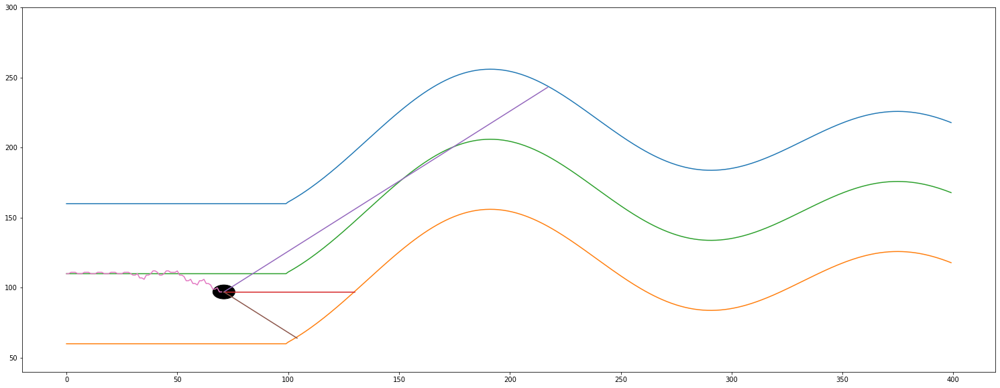

------------------------------ IF i % 3 == 2 ------------------------------
# i =  71
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  59
Sensor from left wall =  148
Sensor from right wall =  33
most távolsagra van a felső faltól =  64.0
most távolsagra van az alsó faltól =  36.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  71
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.7777777777777777
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  72
			 len(self.sensor_left)   =  72
			 len(self.sensor_center) =  72
			 len(self.sensor_right)  =  72
			 self.x                  =  71
			 -------------- Teszt End --------------
self.y =  96.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  71
  Ha m

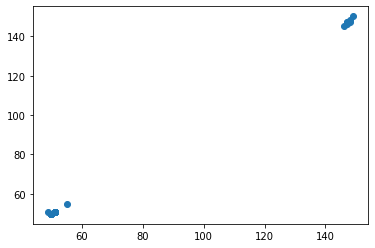

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00332222 0.7451551 ]]


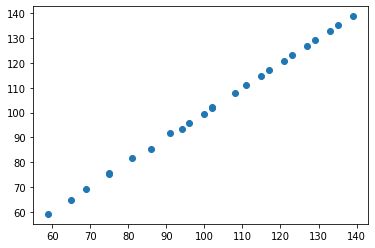

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99142052 0.83369081]]


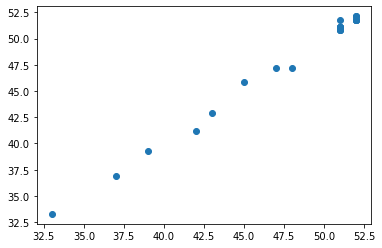

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.23527463]]
-------- 1 y up ->  center =  [[1.40891925]]
-------- 1 y up ->  right  =  [[2.23871389]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[148  -3]]
		 _X_center =  [[59 -3]]
		 _X_right  =  [[33 -3]]
		 predicted_left   =  [[151.00002867]]
		 predicted_center =  [[56.62098731]]
		 predicted_right  =  [[30.6294072]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00428621 -0.90130776]]
		 regression_center.coef_ =  [[1.00332222 0.7451551 ]]
		 regression_right.coef_  =  [[0.9

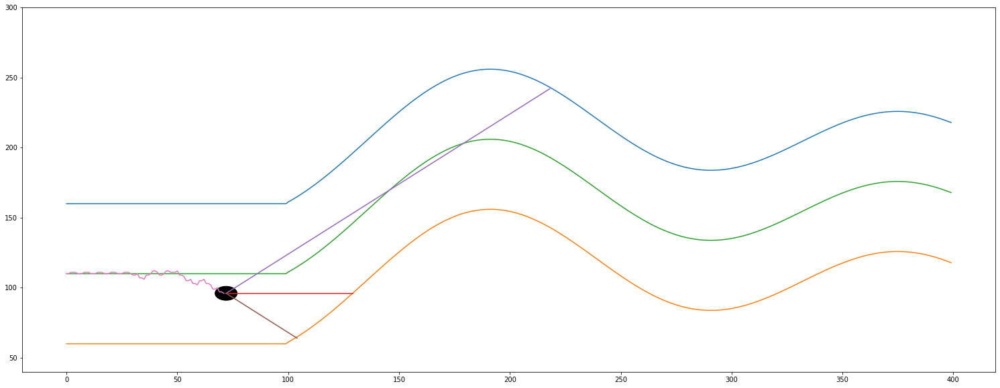

------------------------------ IF i % 3 == 0 ------------------------------
# i =  72
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (73, 3)
y.shape =  (73, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


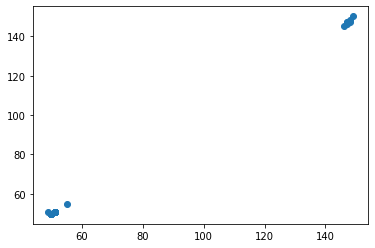

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00332222 0.7451551 ]]


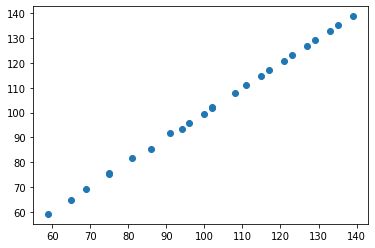

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99142052 0.83369081]]


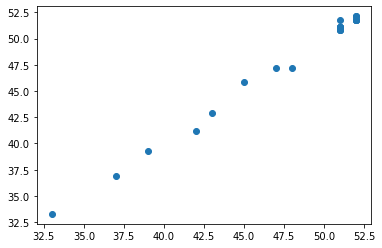

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.23527463]]
-------- 1 y up ->  center =  [[1.40891925]]
-------- 1 y up ->  right  =  [[2.23871389]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[147  -3]]
		 _X_center =  [[58 -3]]
		 _X_right  =  [[33 -3]]
		 predicted_left   =  [[149.99574247]]
		 predicted_center =  [[55.6176651]]
		 predicted_right  =  [[30.6294072]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00428621 -0.90130776]]
		 regression_center.coef_ =  [[1.00332222 0.7451551 ]]
		 regression_right.coef_  =  [[0.99

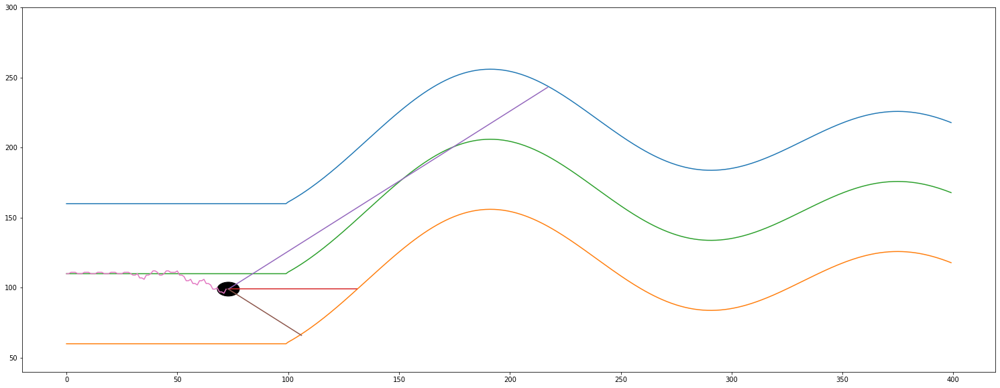

------------------------------ IF i % 3 == 1 ------------------------------
# i =  73
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[145  59  34]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.96       0.01219512 0.05      ]]
actual predicted =  [1.67992389]
actual self.y_distance[-1] =  1.564102564102564
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.04081632653

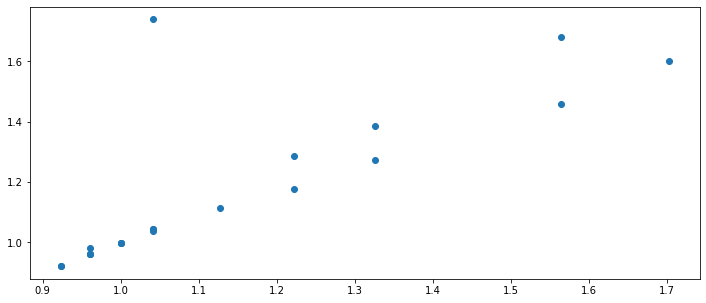

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  73
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.]
(24, 4)
(24, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([105., 148.,  81.,  45.]), 

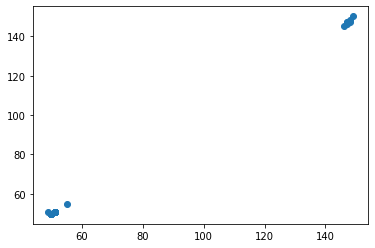

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00332222 0.7451551 ]]


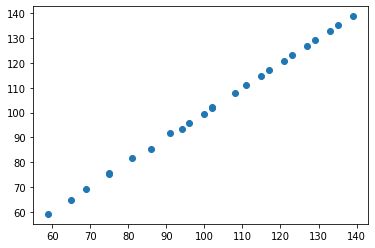

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99142052 0.83369081]]


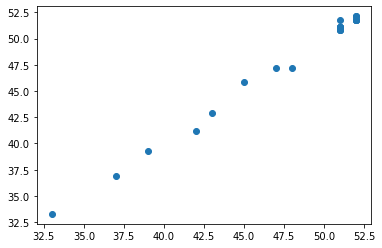

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.23527463]]
-------- 1 y up ->  center =  [[1.40891925]]
-------- 1 y up ->  right  =  [[2.23871389]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[145  -3]]
		 _X_center =  [[59 -3]]
		 _X_right  =  [[34 -3]]
		 predicted_left   =  [[147.98717005]]
		 predicted_center =  [[56.62098731]]
		 predicted_right  =  [[31.62082772]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00428621 -0.90130776]]
		 regression_center.coef_ =  [[1.00332222 0.7451551 ]]
		 regression_right.coef_  =  [[0.

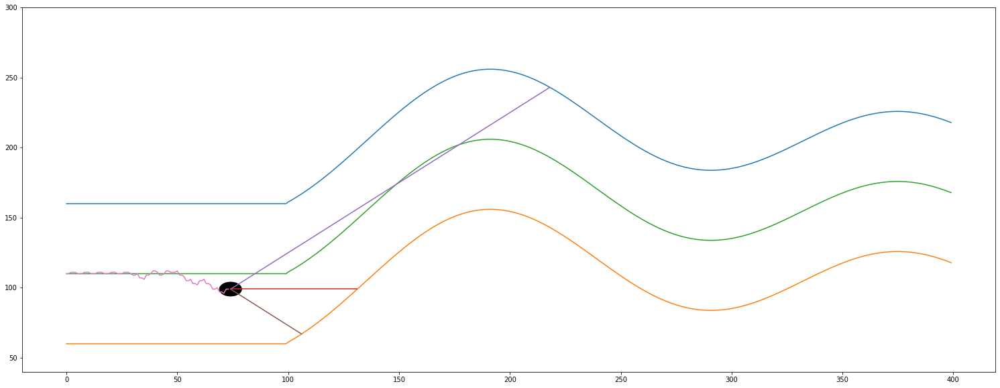

------------------------------ IF i % 3 == 2 ------------------------------
# i =  74
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  59
Sensor from left wall =  144
Sensor from right wall =  34
most távolsagra van a felső faltól =  60.0
most távolsagra van az alsó faltól =  40.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  74
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.5
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  75
			 len(self.sensor_left)   =  75
			 len(self.sensor_center) =  75
			 len(self.sensor_right)  =  75
			 self.x                  =  74
			 -------------- Teszt End --------------
self.y =  100.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  74
  Ha már van elég befo

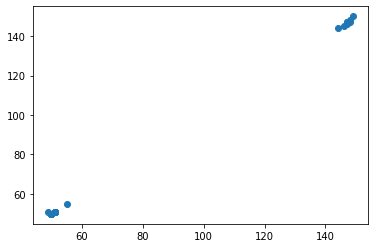

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00215372 0.76025736]]


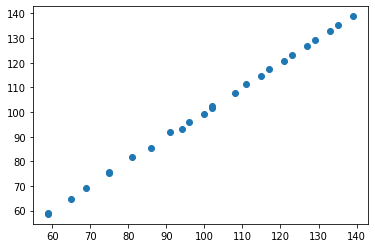

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99085672 0.83476167]]


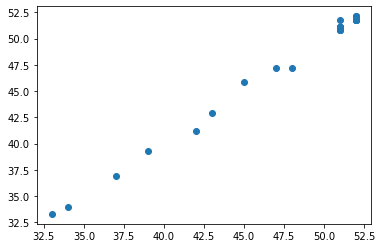

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.2255179]]
-------- 1 y up ->  center =  [[1.55568147]]
-------- 1 y up ->  right  =  [[2.26744819]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[144  -3]]
		 _X_center =  [[59 -3]]
		 _X_right  =  [[34 -3]]
		 predicted_left   =  [[146.98294905]]
		 predicted_center =  [[56.63956761]]
		 predicted_right  =  [[31.62667316]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00379511 -0.9164416 ]]
		 regression_center.coef_ =  [[1.00215372 0.76025736]]
		 regression_right.coef_  =  [[0.9

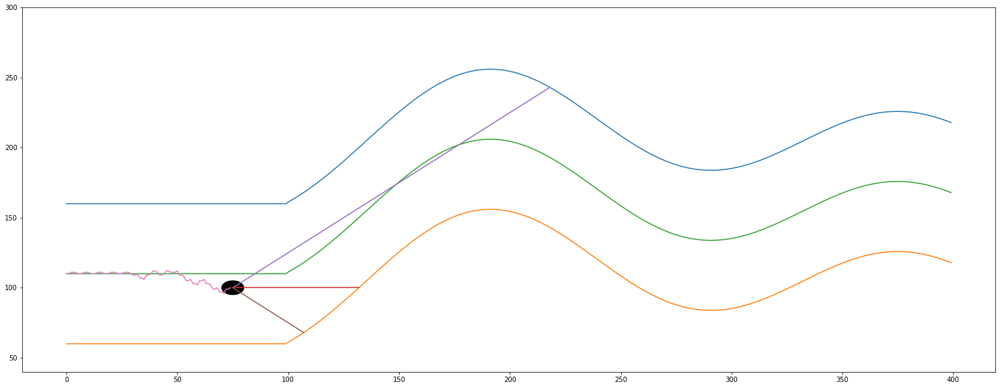

------------------------------ IF i % 3 == 0 ------------------------------
# i =  75
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (76, 3)
y.shape =  (76, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


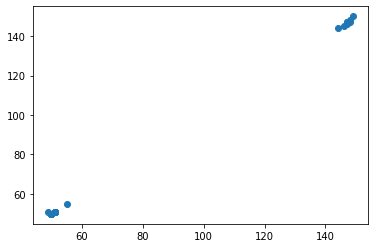

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00215372 0.76025736]]


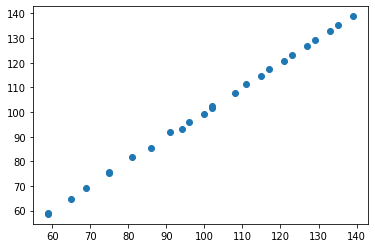

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99085672 0.83476167]]


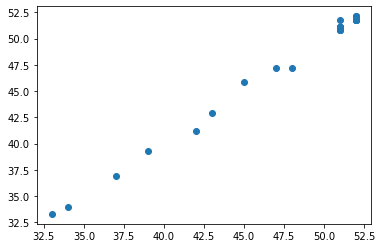

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.2255179]]
-------- 1 y up ->  center =  [[1.55568147]]
-------- 1 y up ->  right  =  [[2.26744819]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[144  -3]]
		 _X_center =  [[58 -3]]
		 _X_right  =  [[33 -3]]
		 predicted_left   =  [[146.98294905]]
		 predicted_center =  [[55.63741389]]
		 predicted_right  =  [[30.63581645]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00379511 -0.9164416 ]]
		 regression_center.coef_ =  [[1.00215372 0.76025736]]
		 regression_right.coef_  =  [[0.9

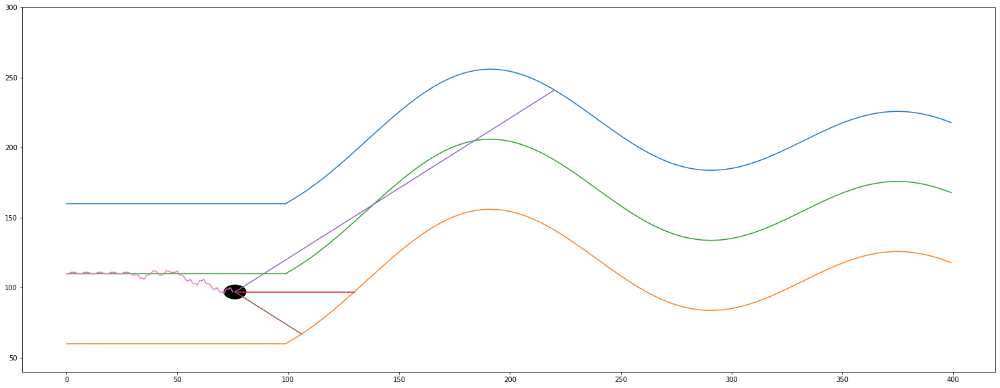

------------------------------ IF i % 3 == 1 ------------------------------
# i =  76
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[145  55  31]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.96       -0.03658537 -0.1       ]]
actual predicted =  [1.72480258]
actual self.y_distance[-1] =  1.7027027027027026
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163

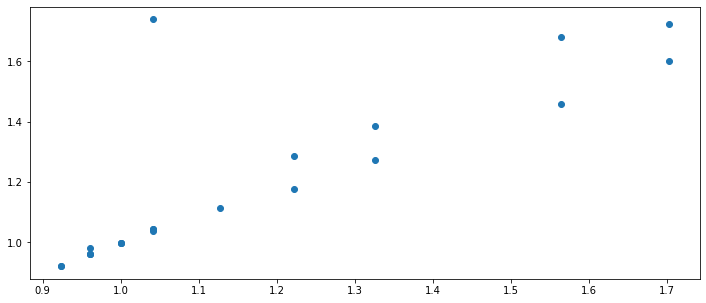

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  76
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1.]
(25, 4)
(25, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([105., 148.,  81.,  45.

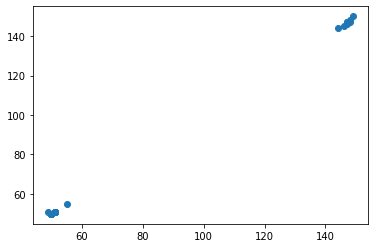

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00215372 0.76025736]]


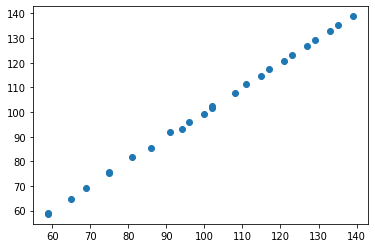

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99085672 0.83476167]]


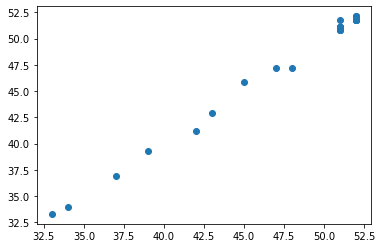

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.2255179]]
-------- 1 y up ->  center =  [[1.55568147]]
-------- 1 y up ->  right  =  [[2.26744819]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[145  -3]]
		 _X_center =  [[55 -3]]
		 _X_right  =  [[31 -3]]
		 predicted_left   =  [[147.98674416]]
		 predicted_center =  [[52.63095274]]
		 predicted_right  =  [[28.65410301]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00379511 -0.9164416 ]]
		 regression_center.coef_ =  [[1.00215372 0.76025736]]
		 regression_right.coef_  =  [[0.9

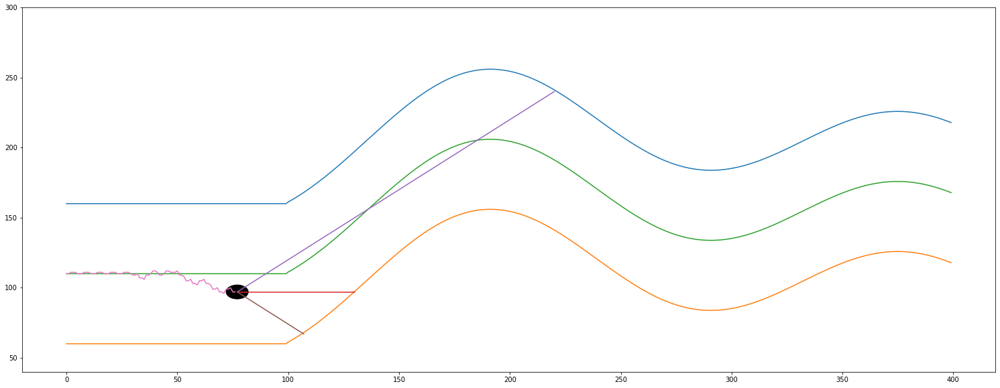

------------------------------ IF i % 3 == 2 ------------------------------
# i =  77
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  53
Sensor from left wall =  145
Sensor from right wall =  30
most távolsagra van a felső faltól =  64.0
most távolsagra van az alsó faltól =  36.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  77
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.7777777777777777
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  78
			 len(self.sensor_left)   =  78
			 len(self.sensor_center) =  78
			 len(self.sensor_right)  =  78
			 self.x                  =  77
			 -------------- Teszt End --------------
self.y =  96.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  77
  Ha m

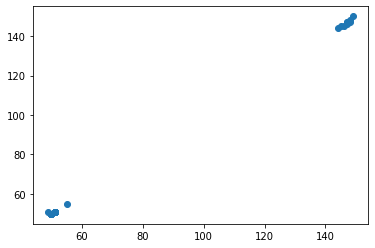

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00254401 0.76541476]]


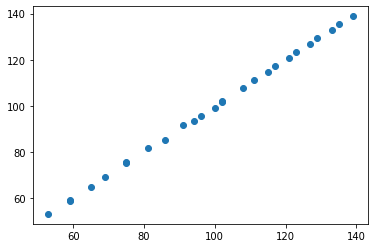

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99525254 0.84670163]]


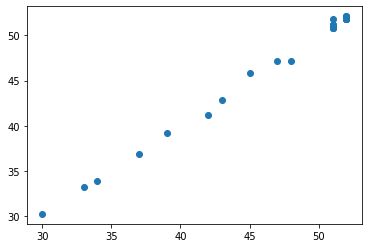

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.21282922]]
-------- 1 y up ->  center =  [[1.51698263]]
-------- 1 y up ->  right  =  [[2.06490226]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[145  -3]]
		 _X_center =  [[53 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[147.9555001]]
		 predicted_center =  [[50.58761199]]
		 predicted_right  =  [[27.54041936]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00363589 -0.91119037]]
		 regression_center.coef_ =  [[1.00254401 0.76541476]]
		 regression_right.coef_  =  [[0.9

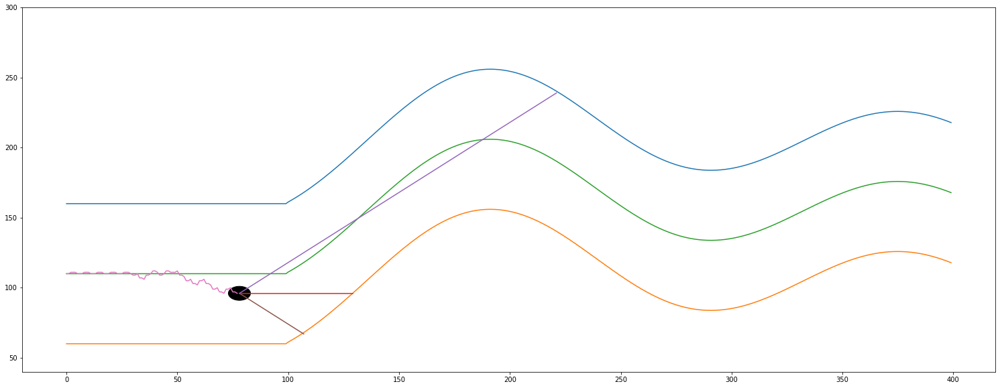

------------------------------ IF i % 3 == 0 ------------------------------
# i =  78
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (79, 3)
y.shape =  (79, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


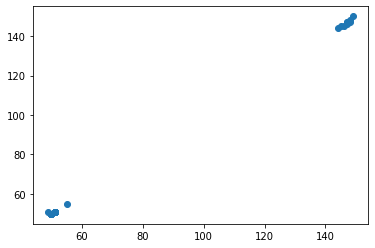

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00254401 0.76541476]]


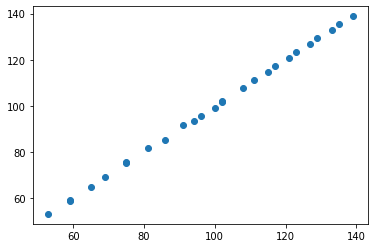

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99525254 0.84670163]]


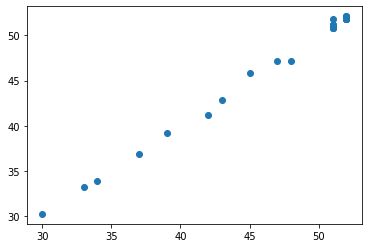

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.21282922]]
-------- 1 y up ->  center =  [[1.51698263]]
-------- 1 y up ->  right  =  [[2.06490226]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[144  -3]]
		 _X_center =  [[52 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[146.95186422]]
		 predicted_center =  [[49.58506799]]
		 predicted_right  =  [[27.54041936]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00363589 -0.91119037]]
		 regression_center.coef_ =  [[1.00254401 0.76541476]]
		 regression_right.coef_  =  [[0.

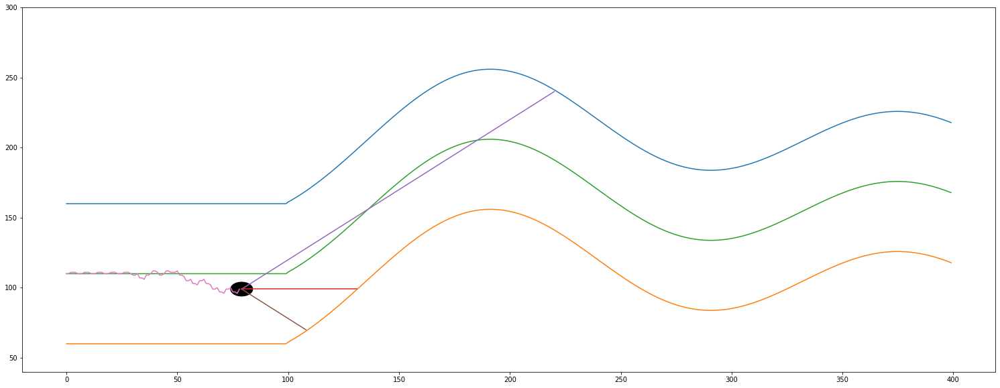

------------------------------ IF i % 3 == 1 ------------------------------
# i =  79
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[142  53  30]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.93       0.01136364 0.        ]]
actual predicted =  [1.76202617]
actual self.y_distance[-1] =  1.564102564102564
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.04081632653

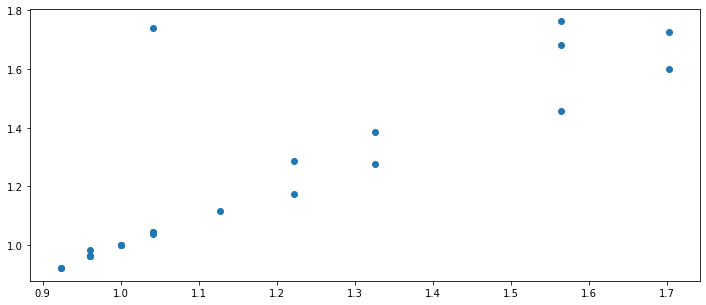

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  79
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.]
(26, 4)
(26, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([105., 148.,  81., 

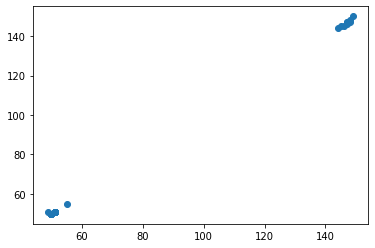

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00254401 0.76541476]]


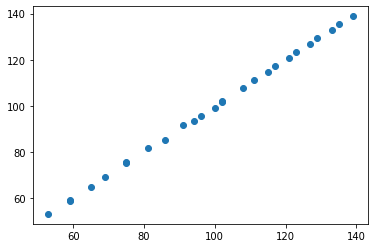

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99525254 0.84670163]]


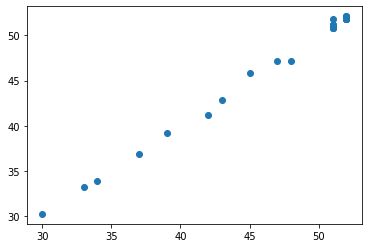

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.21282922]]
-------- 1 y up ->  center =  [[1.51698263]]
-------- 1 y up ->  right  =  [[2.06490226]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[142  -3]]
		 _X_center =  [[53 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[144.94459244]]
		 predicted_center =  [[50.58761199]]
		 predicted_right  =  [[27.54041936]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00363589 -0.91119037]]
		 regression_center.coef_ =  [[1.00254401 0.76541476]]
		 regression_right.coef_  =  [[0.

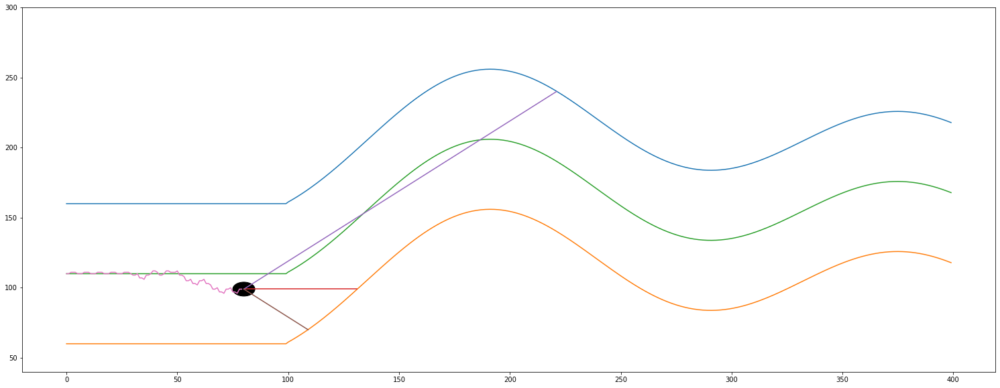

------------------------------ IF i % 3 == 2 ------------------------------
# i =  80
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  53
Sensor from left wall =  141
Sensor from right wall =  30
most távolsagra van a felső faltól =  60.0
most távolsagra van az alsó faltól =  40.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  80
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.5
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  81
			 len(self.sensor_left)   =  81
			 len(self.sensor_center) =  81
			 len(self.sensor_right)  =  81
			 self.x                  =  80
			 -------------- Teszt End --------------
self.y =  100.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  80
  Ha már van elég befo

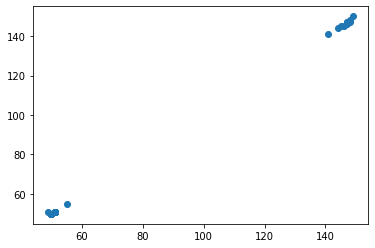

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00169759 0.77784562]]


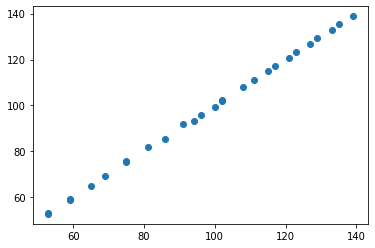

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00548148 0.81864469]]


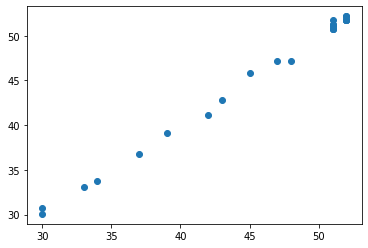

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20906798]]
-------- 1 y up ->  center =  [[1.62323087]]
-------- 1 y up ->  right  =  [[1.53983059]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[141  -3]]
		 _X_center =  [[53 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[143.94691691]]
		 predicted_center =  [[50.60012295]]
		 predicted_right  =  [[27.42421486]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00333641 -0.92222196]]
		 regression_center.coef_ =  [[1.00169759 0.77784562]]
		 regression_right.coef_  =  [[1.

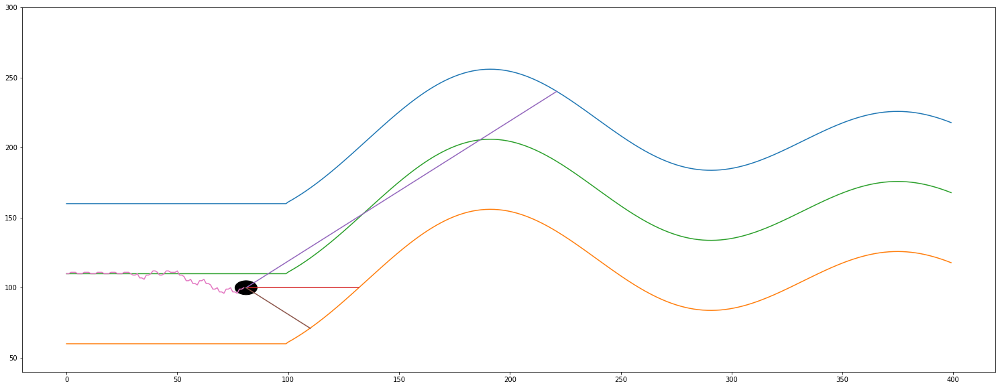

------------------------------ IF i % 3 == 0 ------------------------------
# i =  81
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (82, 3)
y.shape =  (82, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


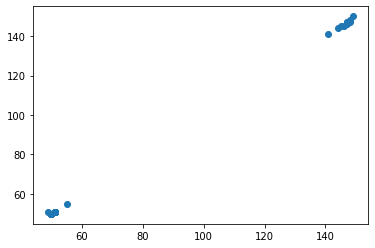

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00169759 0.77784562]]


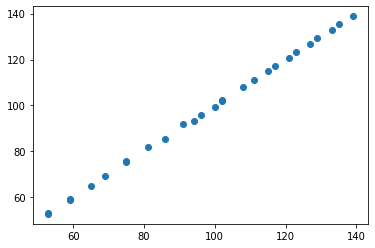

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00548148 0.81864469]]


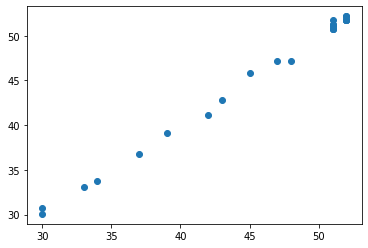

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20906798]]
-------- 1 y up ->  center =  [[1.62323087]]
-------- 1 y up ->  right  =  [[1.53983059]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[141  -3]]
		 _X_center =  [[52 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[143.94691691]]
		 predicted_center =  [[49.59842536]]
		 predicted_right  =  [[27.42421486]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00333641 -0.92222196]]
		 regression_center.coef_ =  [[1.00169759 0.77784562]]
		 regression_right.coef_  =  [[1.

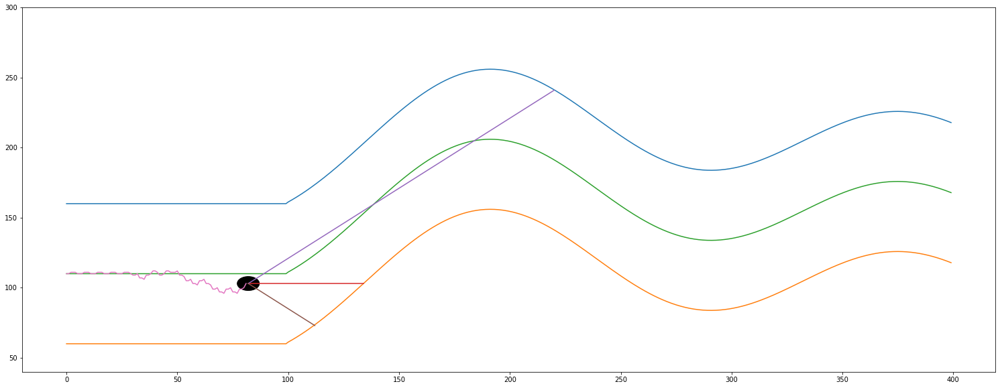

------------------------------ IF i % 3 == 1 ------------------------------
# i =  82
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[139  53  31]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.9        0.01136364 0.04347826]]
actual predicted =  [1.60417808]
actual self.y_distance[-1] =  1.3255813953488371
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265

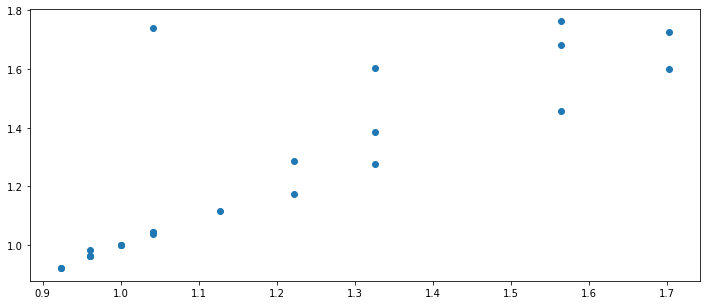

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  82
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(27, 4)
(27, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([105., 148.,  8

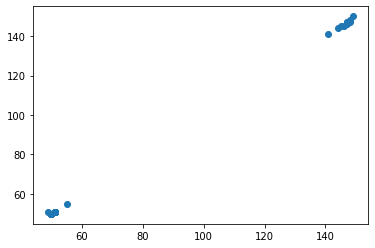

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00169759 0.77784562]]


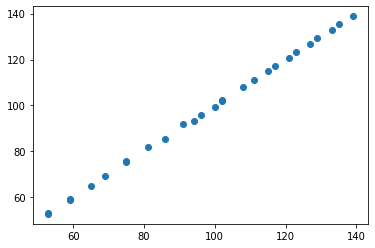

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00548148 0.81864469]]


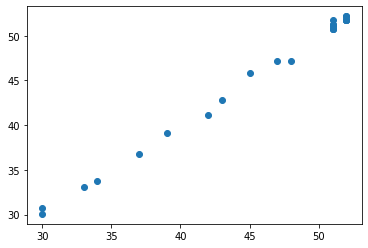

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20906798]]
-------- 1 y up ->  center =  [[1.62323087]]
-------- 1 y up ->  right  =  [[1.53983059]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[139  -3]]
		 _X_center =  [[53 -3]]
		 _X_right  =  [[31 -3]]
		 predicted_left   =  [[141.94024409]]
		 predicted_center =  [[50.60012295]]
		 predicted_right  =  [[28.42969634]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00333641 -0.92222196]]
		 regression_center.coef_ =  [[1.00169759 0.77784562]]
		 regression_right.coef_  =  [[1.

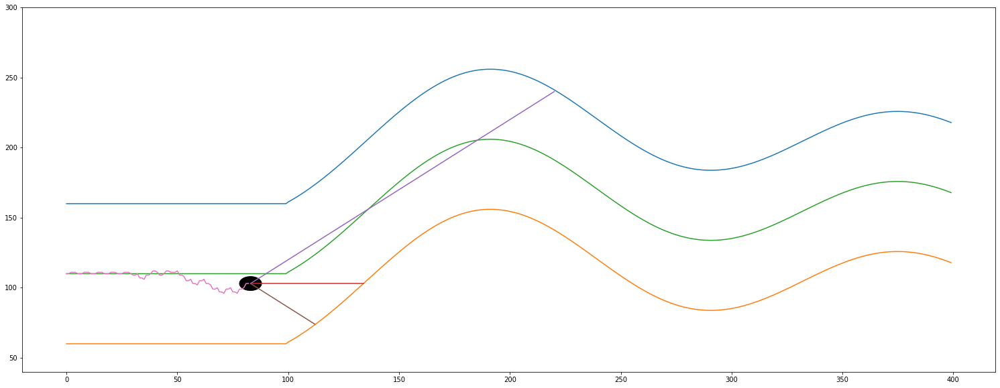

------------------------------ IF i % 3 == 2 ------------------------------
# i =  83
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  51
Sensor from left wall =  139
Sensor from right wall =  30
most távolsagra van a felső faltól =  58.0
most távolsagra van az alsó faltól =  42.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  83
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.380952380952381
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  84
			 len(self.sensor_left)   =  84
			 len(self.sensor_center) =  84
			 len(self.sensor_right)  =  84
			 self.x                  =  83
			 -------------- Teszt End --------------
self.y =  102.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  83
  Ha m

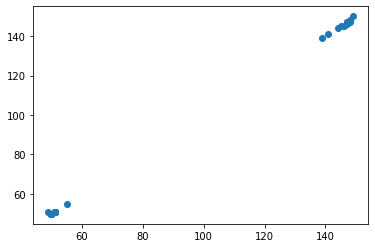

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00201195 0.78291193]]


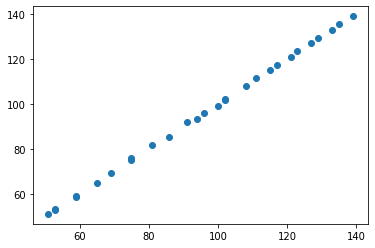

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99685046 0.78605174]]


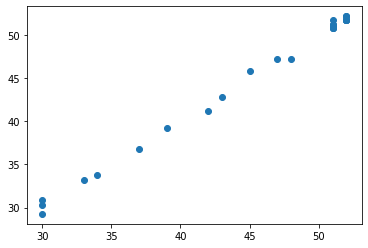

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20289731]]
-------- 1 y up ->  center =  [[1.59314226]]
-------- 1 y up ->  right  =  [[1.92699366]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[139  -3]]
		 _X_center =  [[51 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[141.92392605]]
		 predicted_center =  [[48.56209186]]
		 predicted_right  =  [[27.69145005]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00326301 -0.91913201]]
		 regression_center.coef_ =  [[1.00201195 0.78291193]]
		 regression_right.coef_  =  [[0.

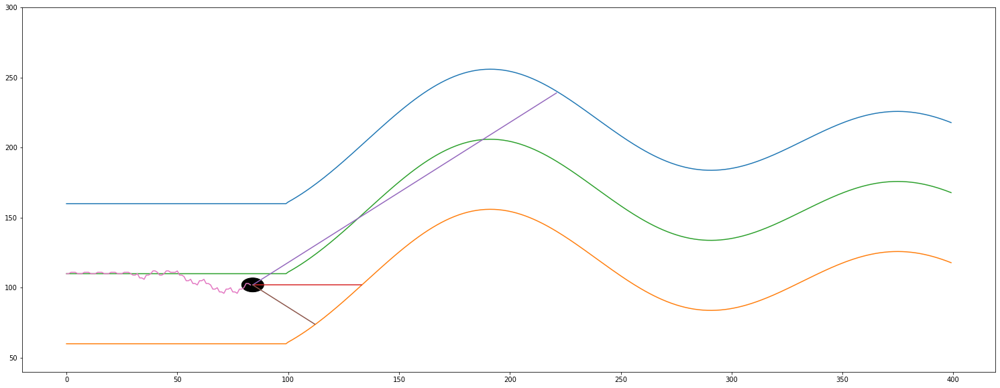

------------------------------ IF i % 3 == 0 ------------------------------
# i =  84
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (85, 3)
y.shape =  (85, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


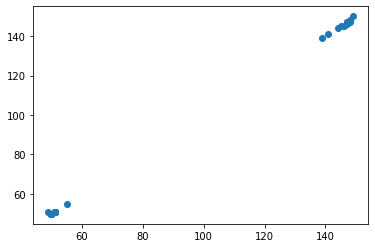

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00201195 0.78291193]]


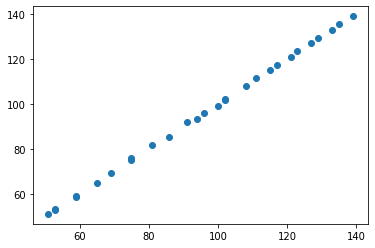

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99685046 0.78605174]]


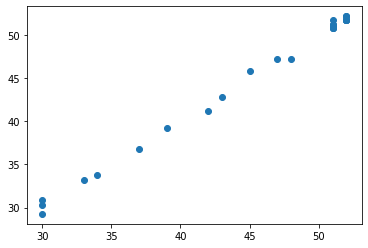

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20289731]]
-------- 1 y up ->  center =  [[1.59314226]]
-------- 1 y up ->  right  =  [[1.92699366]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[138  -3]]
		 _X_center =  [[50 -3]]
		 _X_right  =  [[29 -3]]
		 predicted_left   =  [[140.92066304]]
		 predicted_center =  [[47.56007991]]
		 predicted_right  =  [[26.69459959]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00326301 -0.91913201]]
		 regression_center.coef_ =  [[1.00201195 0.78291193]]
		 regression_right.coef_  =  [[0.

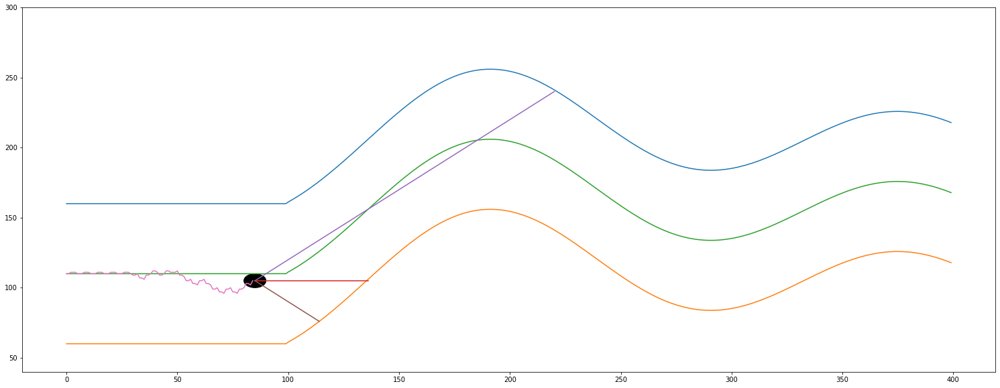

------------------------------ IF i % 3 == 1 ------------------------------
# i =  85
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[136  52  30]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.87       0.02222222 0.04166667]]
actual predicted =  [1.45761489]
actual self.y_distance[-1] =  1.2222222222222223
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265

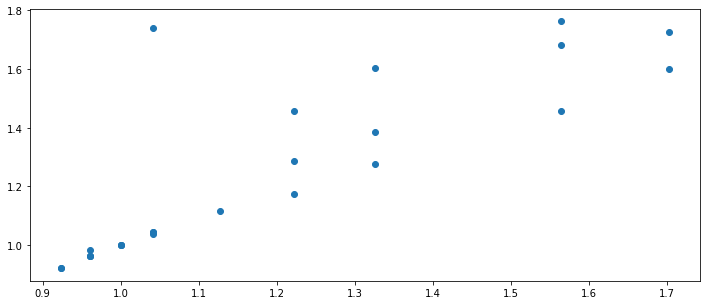

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  85
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(28, 4)
(28, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([105., 148.

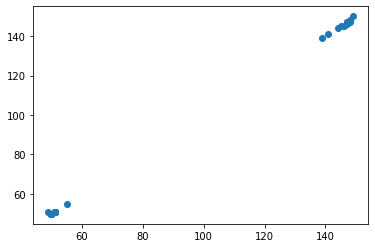

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00201195 0.78291193]]


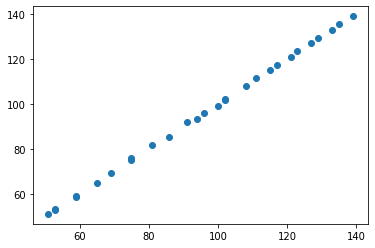

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99685046 0.78605174]]


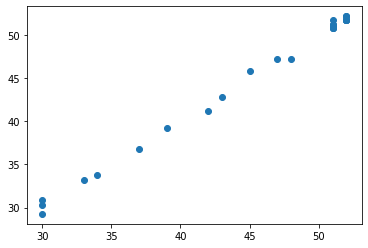

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20289731]]
-------- 1 y up ->  center =  [[1.59314226]]
-------- 1 y up ->  right  =  [[1.92699366]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[136  -3]]
		 _X_center =  [[52 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[138.91413702]]
		 predicted_center =  [[49.56410381]]
		 predicted_right  =  [[27.69145005]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00326301 -0.91913201]]
		 regression_center.coef_ =  [[1.00201195 0.78291193]]
		 regression_right.coef_  =  [[0.

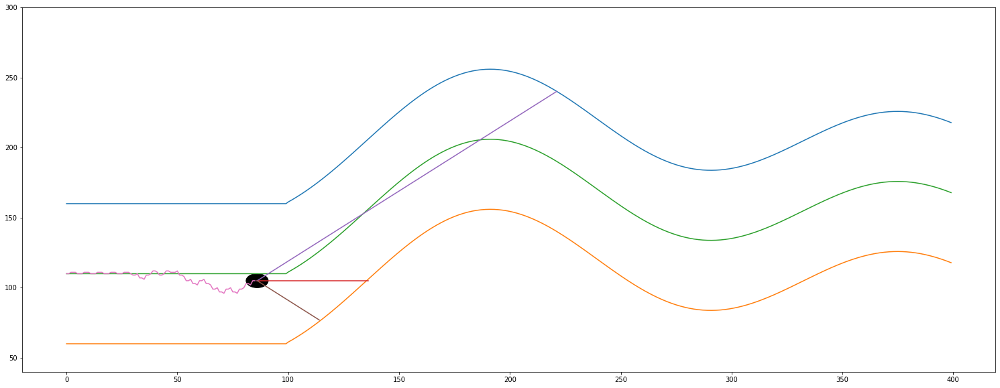

------------------------------ IF i % 3 == 2 ------------------------------
# i =  86
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  51
Sensor from left wall =  135
Sensor from right wall =  30
most távolsagra van a felső faltól =  54.0
most távolsagra van az alsó faltól =  46.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  86
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.173913043478261
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  87
			 len(self.sensor_left)   =  87
			 len(self.sensor_center) =  87
			 len(self.sensor_right)  =  87
			 self.x                  =  86
			 -------------- Teszt End --------------
self.y =  106.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  86
  Ha már

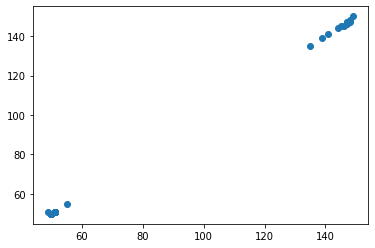

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00332712 0.7599595 ]]


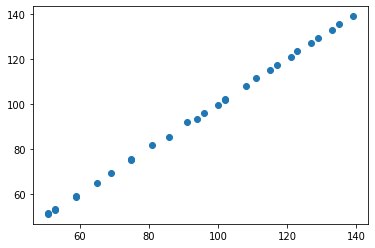

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99556057 0.79083826]]


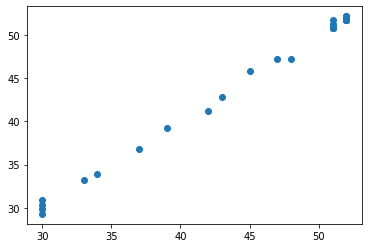

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20275526]]
-------- 1 y up ->  center =  [[1.42502055]]
-------- 1 y up ->  right  =  [[1.994151]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[135  -3]]
		 _X_center =  [[51 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[137.91908526]]
		 predicted_center =  [[48.55153835]]
		 predicted_right  =  [[27.70205454]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00308028 -0.92727071]]
		 regression_center.coef_ =  [[1.00332712 0.7599595 ]]
		 regression_right.coef_  =  [[0.99

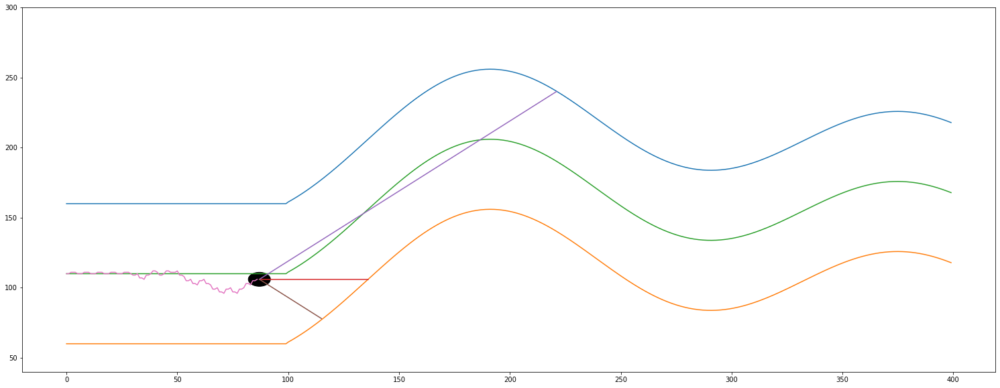

------------------------------ IF i % 3 == 0 ------------------------------
# i =  87
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (88, 3)
y.shape =  (88, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


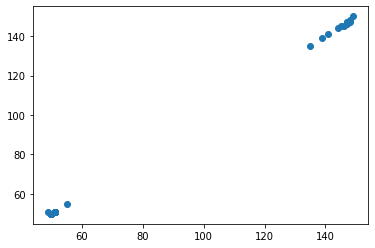

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00332712 0.7599595 ]]


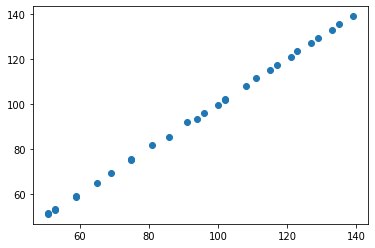

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99556057 0.79083826]]


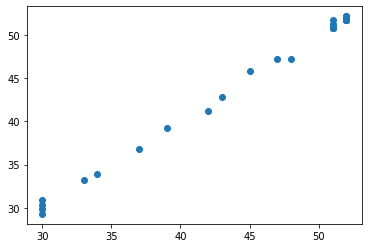

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20275526]]
-------- 1 y up ->  center =  [[1.42502055]]
-------- 1 y up ->  right  =  [[1.994151]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[135  -3]]
		 _X_center =  [[50 -3]]
		 _X_right  =  [[29 -3]]
		 predicted_left   =  [[137.91908526]]
		 predicted_center =  [[47.54821124]]
		 predicted_right  =  [[26.70649397]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00308028 -0.92727071]]
		 regression_center.coef_ =  [[1.00332712 0.7599595 ]]
		 regression_right.coef_  =  [[0.99

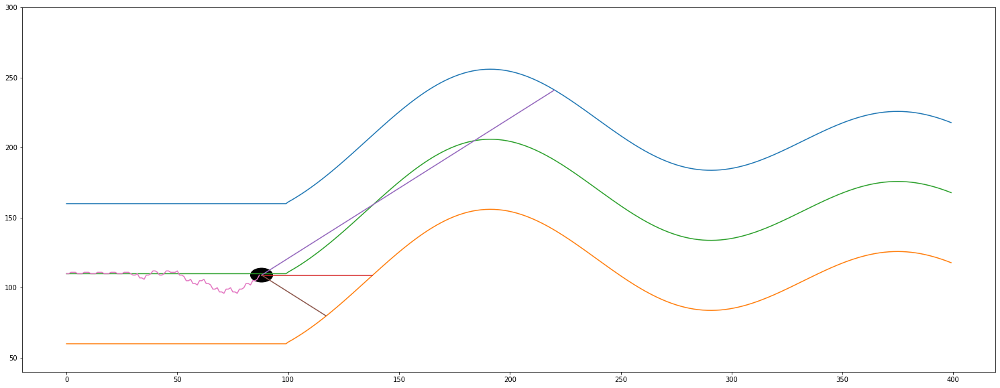

------------------------------ IF i % 3 == 1 ------------------------------
# i =  88
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[133  51  30]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.84       0.01111111 0.04166667]]
actual predicted =  [1.28827427]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265

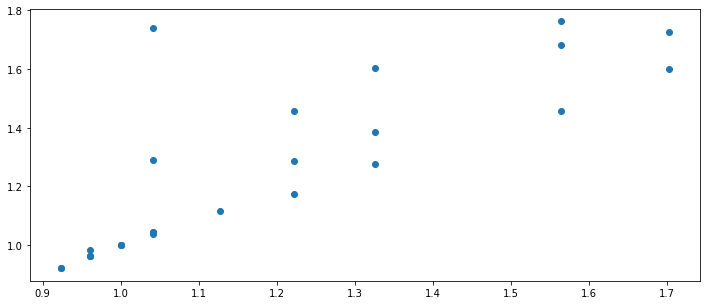

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  88
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(29, 4)
(29, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([105., 

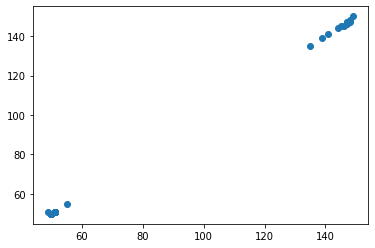

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00332712 0.7599595 ]]


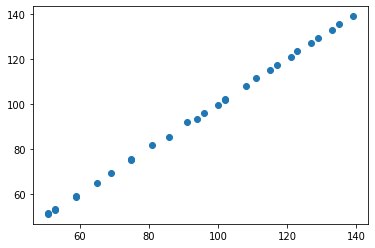

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99556057 0.79083826]]


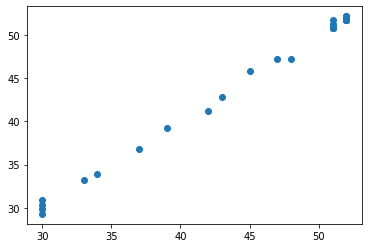

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20275526]]
-------- 1 y up ->  center =  [[1.42502055]]
-------- 1 y up ->  right  =  [[1.994151]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[133  -3]]
		 _X_center =  [[51 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[135.9129247]]
		 predicted_center =  [[48.55153835]]
		 predicted_right  =  [[27.70205454]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00308028 -0.92727071]]
		 regression_center.coef_ =  [[1.00332712 0.7599595 ]]
		 regression_right.coef_  =  [[0.995

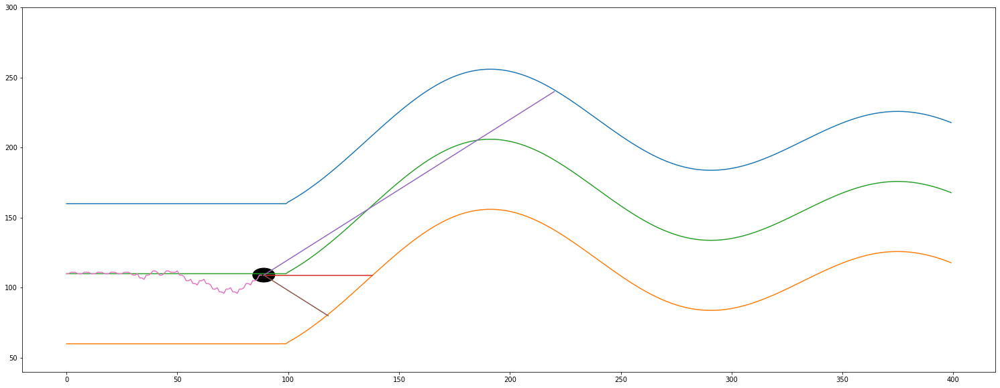

------------------------------ IF i % 3 == 2 ------------------------------
# i =  89
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  50
Sensor from left wall =  133
Sensor from right wall =  29
most távolsagra van a felső faltól =  52.0
most távolsagra van az alsó faltól =  48.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  89
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0833333333333333
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  90
			 len(self.sensor_left)   =  90
			 len(self.sensor_center) =  90
			 len(self.sensor_right)  =  90
			 self.x                  =  89
			 -------------- Teszt End --------------
self.y =  108.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  89
  Ha 

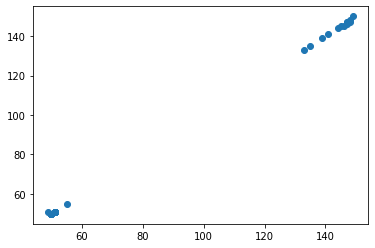

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.0017553  0.73099293]]


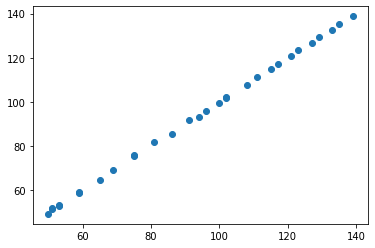

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.9974482  0.80017012]]


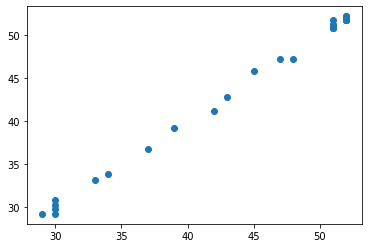

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.199825]]
-------- 1 y up ->  center =  [[1.57067552]]
-------- 1 y up ->  right  =  [[1.91159852]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[133  -3]]
		 _X_center =  [[50 -3]]
		 _X_right  =  [[29 -3]]
		 predicted_left   =  [[135.90440298]]
		 predicted_center =  [[47.73271349]]
		 predicted_right  =  [[26.63946777]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00304678 -0.92551327]]
		 regression_center.coef_ =  [[1.0017553  0.73099293]]
		 regression_right.coef_  =  [[0.99

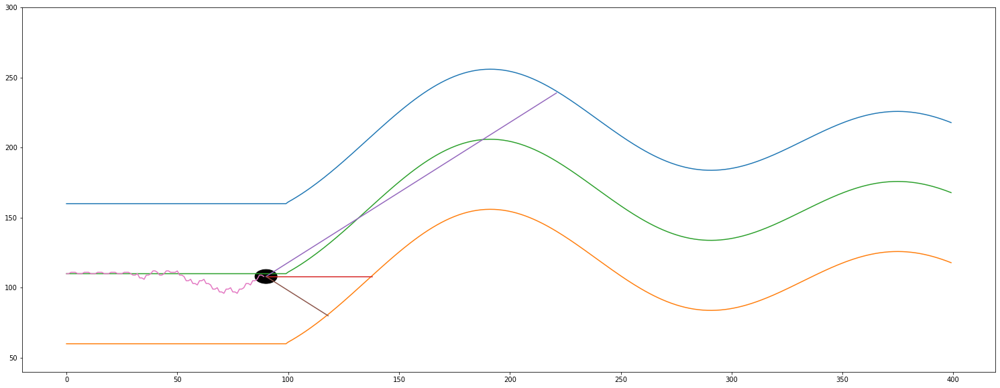

------------------------------ IF i % 3 == 0 ------------------------------
# i =  90
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (91, 3)
y.shape =  (91, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



		 _y_left =  [[ 50.]
 [ 51.]
 [ 50.]
 [ 51.]
 [ 50.]
 [ 51.]
 [ 50.]
 [ 51.]
 [ 50.]
 [ 51.]
 [ 51.]
 [ 55.]
 [ 51.]
 [ 50.]
 [ 51.]
 [ 50.]
 [ 49.]
 [147.]
 [148.]
 [149.]
 [146.]
 [147.]
 [147.]
 [148.]
 [144.]
 [145.]
 [141.]
 [139.]
 [135.]
 [133.]]
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1.00304678 -0.92551327]]


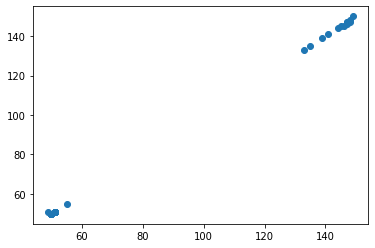

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.0017553  0.73099293]]


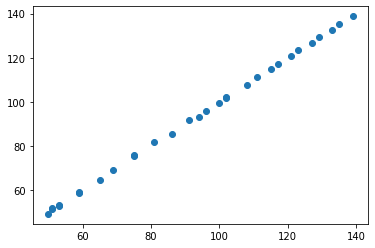

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.9974482  0.80017012]]


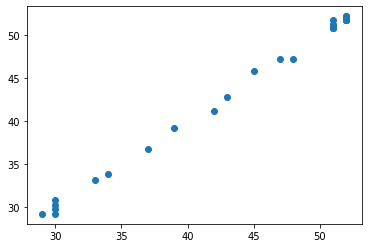

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.199825]]
-------- 1 y up ->  center =  [[1.57067552]]
-------- 1 y up ->  right  =  [[1.91159852]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[132  -3]]
		 _X_center =  [[49 -3]]
		 _X_right  =  [[29 -3]]
		 predicted_left   =  [[134.9013562]]
		 predicted_center =  [[46.73095819]]
		 predicted_right  =  [[26.63946777]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00304678 -0.92551327]]
		 regression_center.coef_ =  [[1.0017553  0.73099293]]
		 regression_right.coef_  =  [[0.997

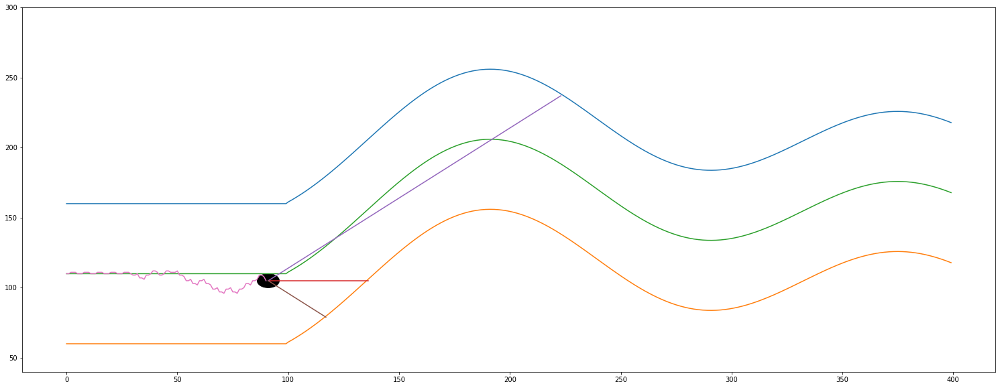

------------------------------ IF i % 3 == 1 ------------------------------
# i =  91
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[133  46  27]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.84       -0.03296703 -0.08333333]]
actual predicted =  [0.85763302]
actual self.y_distance[-1] =  1.2222222222222223
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163

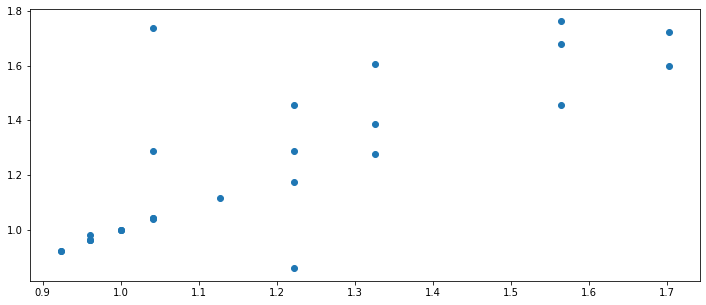

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  91
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(30, 4)
(30, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array([10

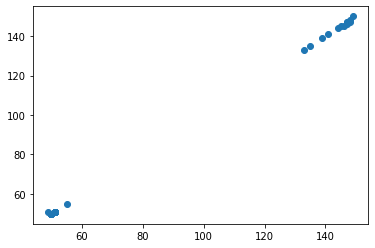

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.0017553  0.73099293]]


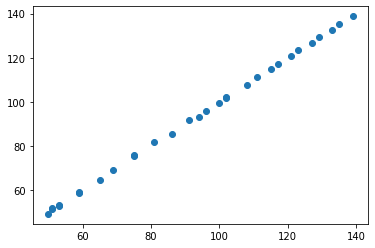

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.9974482  0.80017012]]


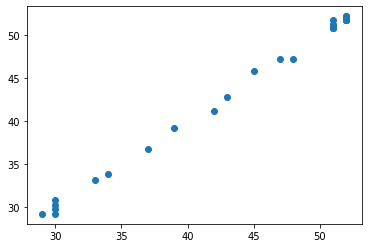

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.199825]]
-------- 1 y up ->  center =  [[1.57067552]]
-------- 1 y up ->  right  =  [[1.91159852]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[133  -3]]
		 _X_center =  [[46 -3]]
		 _X_right  =  [[27 -3]]
		 predicted_left   =  [[135.90440298]]
		 predicted_center =  [[43.72569229]]
		 predicted_right  =  [[24.64457136]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00304678 -0.92551327]]
		 regression_center.coef_ =  [[1.0017553  0.73099293]]
		 regression_right.coef_  =  [[0.99

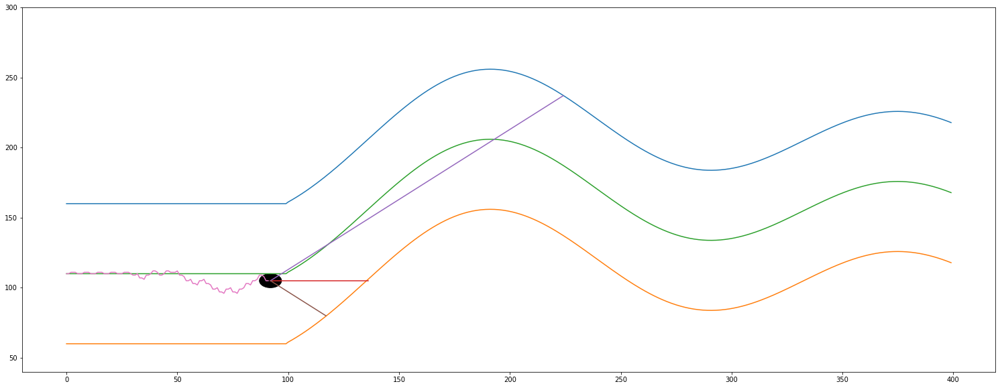

------------------------------ IF i % 3 == 2 ------------------------------
# i =  92
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  45
Sensor from left wall =  132
Sensor from right wall =  27
most távolsagra van a felső faltól =  54.0
most távolsagra van az alsó faltól =  46.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  92
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.173913043478261
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  93
			 len(self.sensor_left)   =  93
			 len(self.sensor_center) =  93
			 len(self.sensor_right)  =  93
			 self.x                  =  92
			 -------------- Teszt End --------------
self.y =  106.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  92
  Ha már

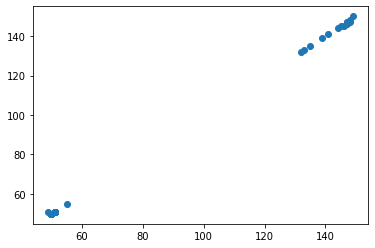

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00286964 0.71095472]]


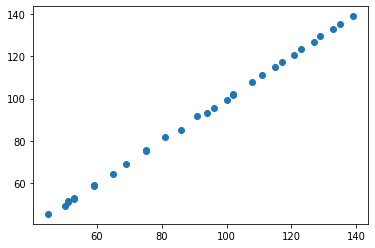

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.996389   0.80437679]]


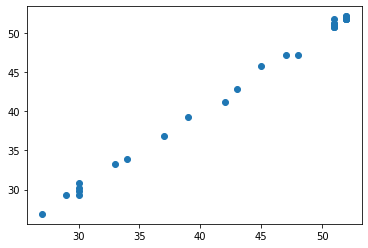

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20078668]]
-------- 1 y up ->  center =  [[1.43030883]]
-------- 1 y up ->  right  =  [[1.96619329]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[132  -3]]
		 _X_center =  [[45 -3]]
		 _X_right  =  [[27 -3]]
		 predicted_left   =  [[134.90933547]]
		 predicted_center =  [[42.71275394]]
		 predicted_right  =  [[24.65480006]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0029173  -0.93198883]]
		 regression_center.coef_ =  [[1.00286964 0.71095472]]
		 regression_right.coef_  =  [[0.

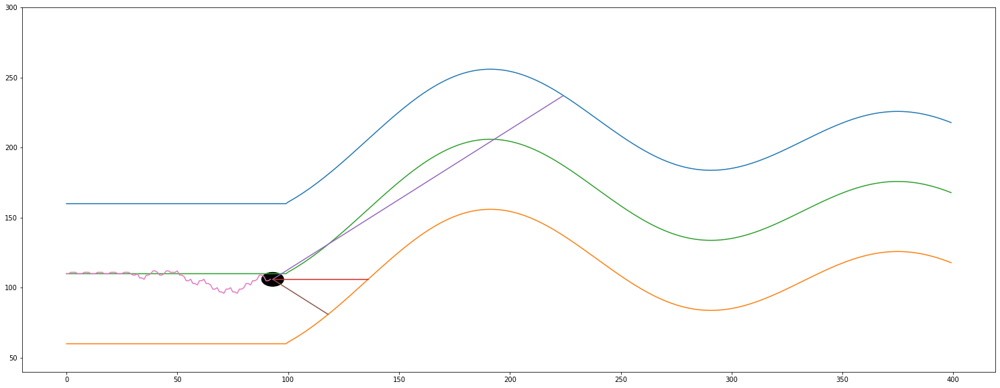

------------------------------ IF i % 3 == 0 ------------------------------
# i =  93
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (94, 3)
y.shape =  (94, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


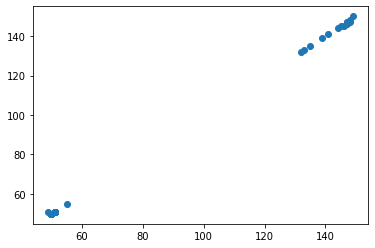

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00286964 0.71095472]]


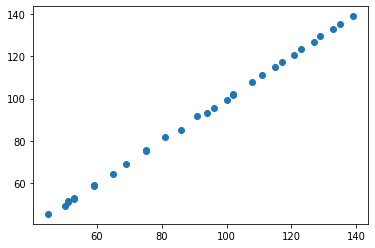

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.996389   0.80437679]]


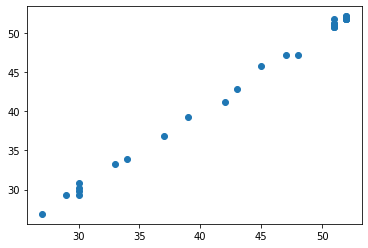

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20078668]]
-------- 1 y up ->  center =  [[1.43030883]]
-------- 1 y up ->  right  =  [[1.96619329]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[132  -3]]
		 _X_center =  [[44 -3]]
		 _X_right  =  [[26 -3]]
		 predicted_left   =  [[134.90933547]]
		 predicted_center =  [[41.7098843]]
		 predicted_right  =  [[23.65841106]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0029173  -0.93198883]]
		 regression_center.coef_ =  [[1.00286964 0.71095472]]
		 regression_right.coef_  =  [[0.9

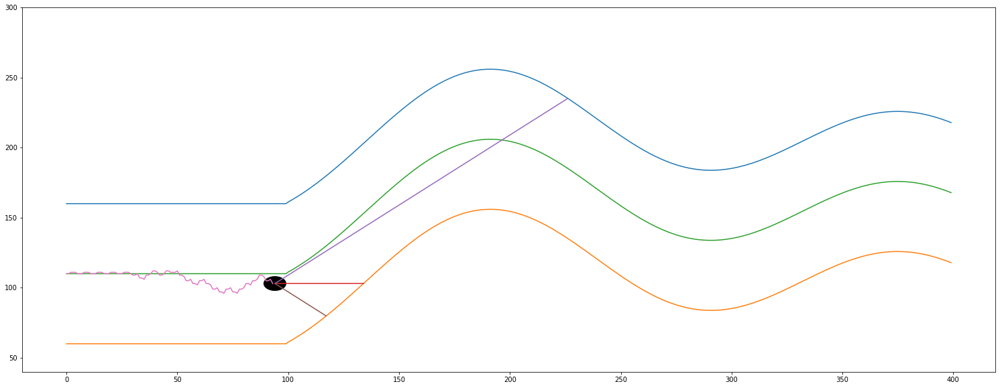

------------------------------ IF i % 3 == 1 ------------------------------
# i =  94
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[133  41  24]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.84       -0.03125    -0.07407407]]
actual predicted =  [1.0239169]
actual self.y_distance[-1] =  1.3255813953488371
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.04081632

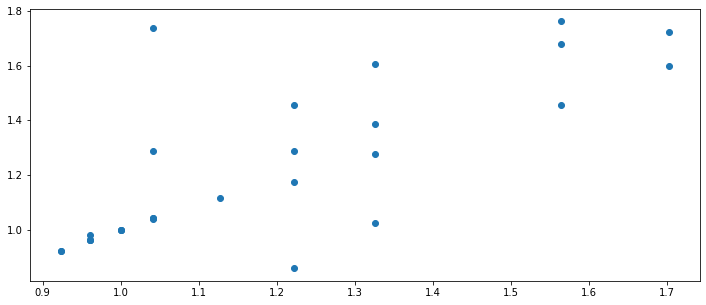

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  94
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(31, 4)
(31, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), array

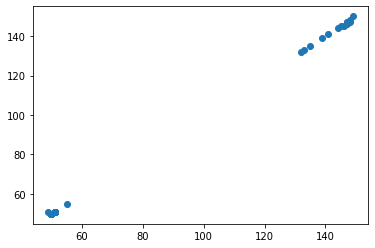

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00286964 0.71095472]]


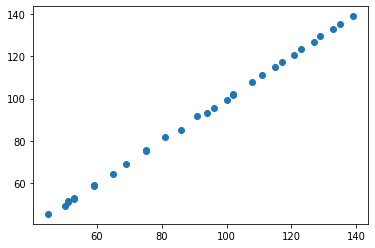

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.996389   0.80437679]]


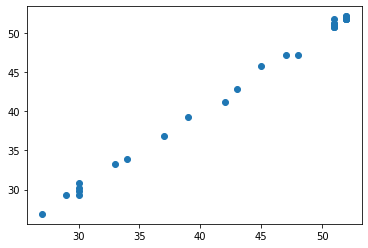

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.20078668]]
-------- 1 y up ->  center =  [[1.43030883]]
-------- 1 y up ->  right  =  [[1.96619329]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[133  -3]]
		 _X_center =  [[41 -3]]
		 _X_right  =  [[24 -3]]
		 predicted_left   =  [[135.91225278]]
		 predicted_center =  [[38.70127539]]
		 predicted_right  =  [[21.66563306]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0029173  -0.93198883]]
		 regression_center.coef_ =  [[1.00286964 0.71095472]]
		 regression_right.coef_  =  [[0.

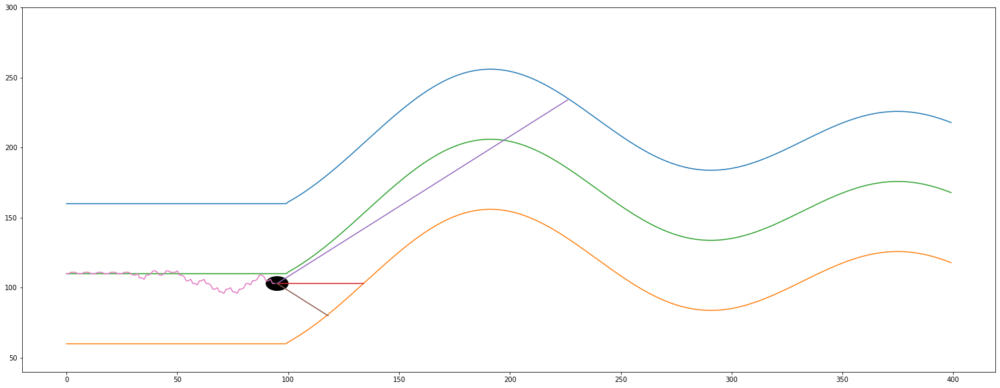

------------------------------ IF i % 3 == 2 ------------------------------
# i =  95
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  39
Sensor from left wall =  133
Sensor from right wall =  23
most távolsagra van a felső faltól =  58.0
most távolsagra van az alsó faltól =  42.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  95
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.380952380952381
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  96
			 len(self.sensor_left)   =  96
			 len(self.sensor_center) =  96
			 len(self.sensor_right)  =  96
			 self.x                  =  95
			 -------------- Teszt End --------------
self.y =  102.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  95
  Ha m

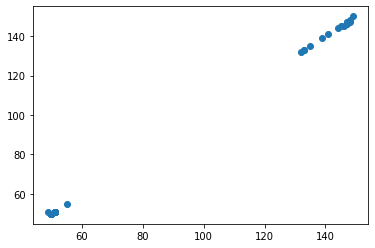

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00306823 0.7144353 ]]


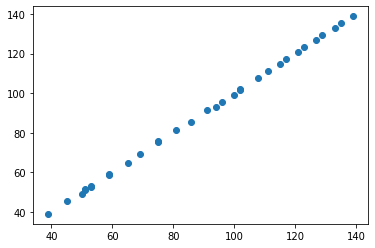

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.9982029  0.81272464]]


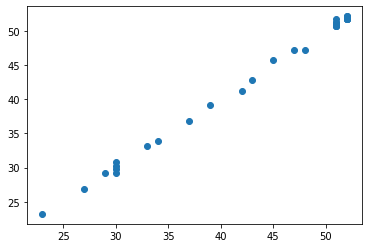

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.19857499]]
-------- 1 y up ->  center =  [[1.41250966]]
-------- 1 y up ->  right  =  [[1.88898902]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[133  -3]]
		 _X_center =  [[39 -3]]
		 _X_right  =  [[23 -3]]
		 predicted_left   =  [[135.90579272]]
		 predicted_center =  [[36.6713613]]
		 predicted_right  =  [[20.5985543]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0028928  -0.93062961]]
		 regression_center.coef_ =  [[1.00306823 0.7144353 ]]
		 regression_right.coef_  =  [[0.99

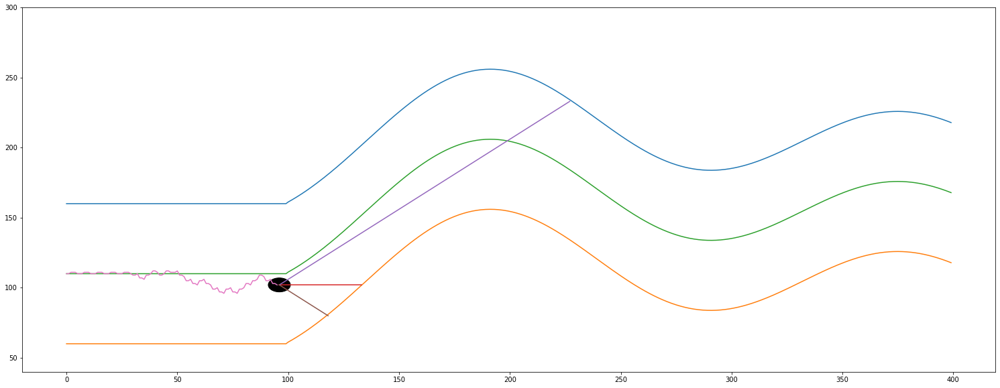

------------------------------ IF i % 3 == 0 ------------------------------
# i =  96
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (97, 3)
y.shape =  (97, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 50 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


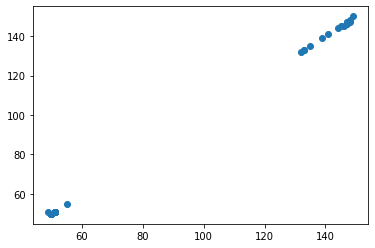

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00306823 0.7144353 ]]


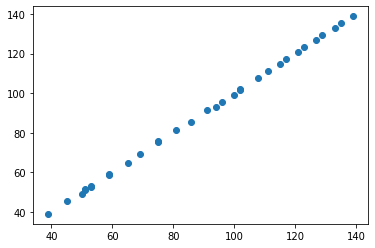

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.9982029  0.81272464]]


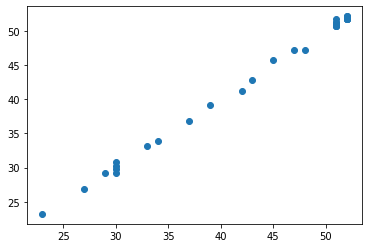

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.19857499]]
-------- 1 y up ->  center =  [[1.41250966]]
-------- 1 y up ->  right  =  [[1.88898902]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[132  -3]]
		 _X_center =  [[38 -3]]
		 _X_right  =  [[23 -3]]
		 predicted_left   =  [[134.90289993]]
		 predicted_center =  [[35.66829307]]
		 predicted_right  =  [[20.5985543]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0028928  -0.93062961]]
		 regression_center.coef_ =  [[1.00306823 0.7144353 ]]
		 regression_right.coef_  =  [[0.9

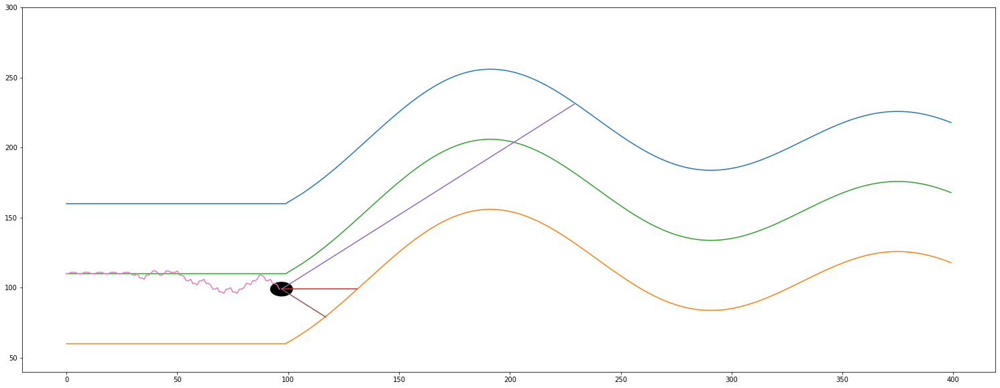

------------------------------ IF i % 3 == 1 ------------------------------
# i =  97
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[133  35  21]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.84       -0.02941176 -0.06666667]]
actual predicted =  [1.11592404]
actual self.y_distance[-1] =  1.564102564102564
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.04081632

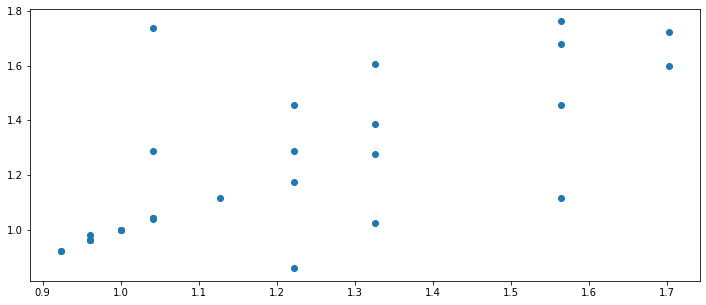

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  97
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(32, 4)
(32, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.]), a

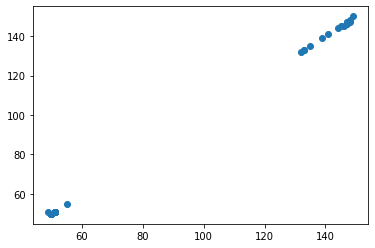

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00306823 0.7144353 ]]


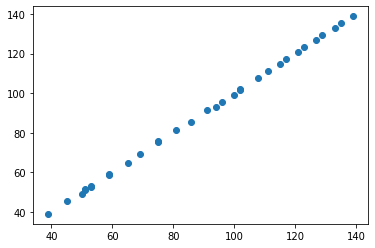

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.9982029  0.81272464]]


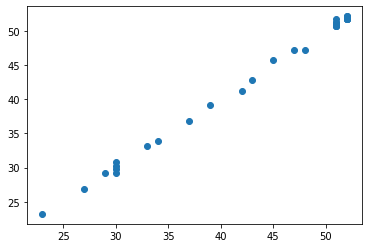

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.19857499]]
-------- 1 y up ->  center =  [[1.41250966]]
-------- 1 y up ->  right  =  [[1.88898902]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[133  -3]]
		 _X_center =  [[35 -3]]
		 _X_right  =  [[21 -3]]
		 predicted_left   =  [[135.90579272]]
		 predicted_center =  [[32.65908837]]
		 predicted_right  =  [[18.6021485]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0028928  -0.93062961]]
		 regression_center.coef_ =  [[1.00306823 0.7144353 ]]
		 regression_right.coef_  =  [[0.9

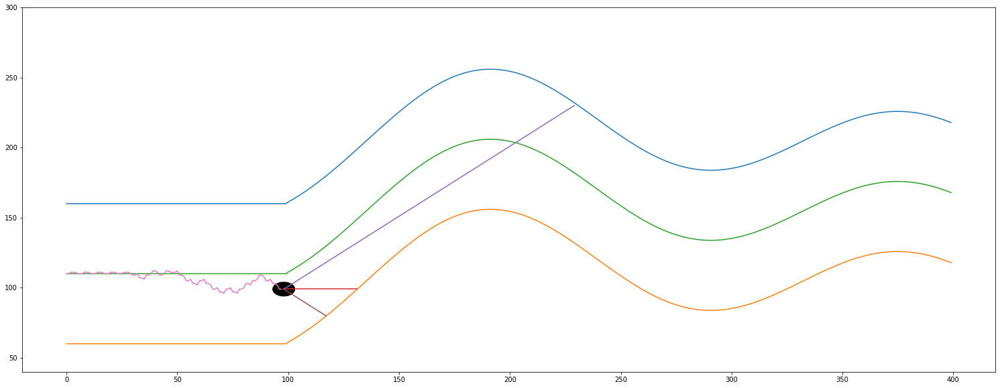

------------------------------ IF i % 3 == 2 ------------------------------
# i =  98
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  35
Sensor from left wall =  132
Sensor from right wall =  21
most távolsagra van a felső faltól =  60.0
most távolsagra van az alsó faltól =  40.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  98
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.5
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  99
			 len(self.sensor_left)   =  99
			 len(self.sensor_center) =  99
			 len(self.sensor_right)  =  99
			 self.x                  =  98
			 -------------- Teszt End --------------
self.y =  100.0
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  98
  Ha már van elég befo

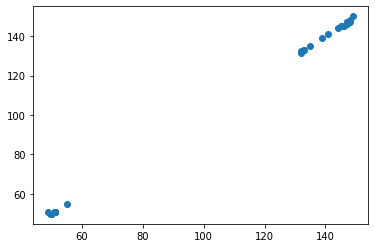

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00225802 0.72852644]]


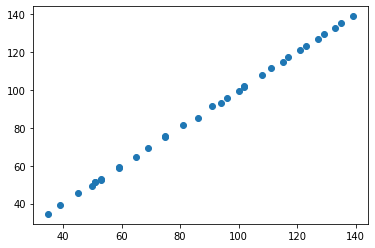

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99726819 0.816463  ]]


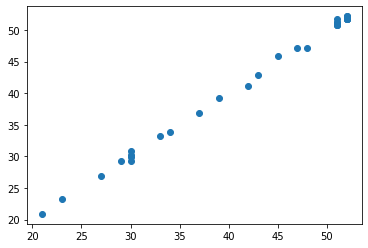

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.1930689]]
-------- 1 y up ->  center =  [[1.5110281]]
-------- 1 y up ->  right  =  [[1.93601553]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[132  -3]]
		 _X_center =  [[35 -3]]
		 _X_right  =  [[21 -3]]
		 predicted_left   =  [[134.87019709]]
		 predicted_center =  [[32.6736952]]
		 predicted_right  =  [[18.61552742]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00335376 -0.90598087]]
		 regression_center.coef_ =  [[1.00225802 0.72852644]]
		 regression_right.coef_  =  [[0.997

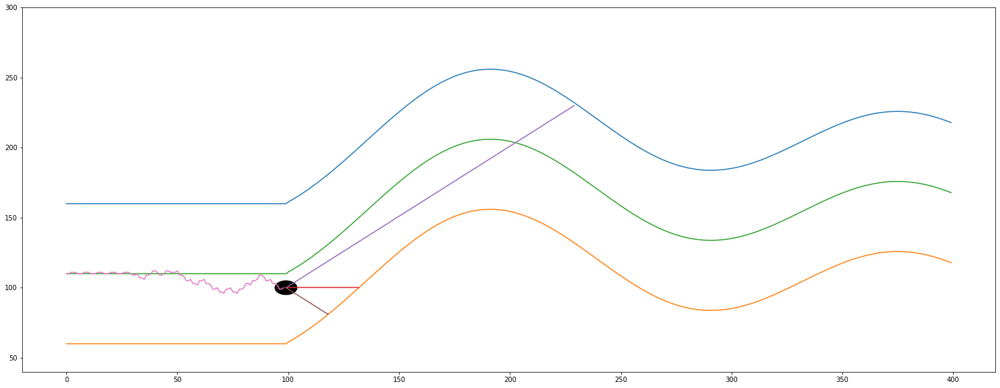

------------------------------ IF i % 3 == 0 ------------------------------
# i =  99
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (100, 3)
y.shape =  (100, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 5

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


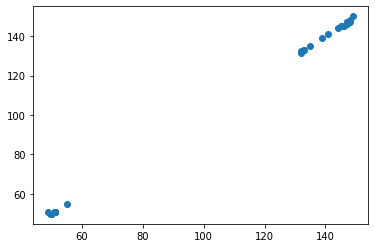

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00225802 0.72852644]]


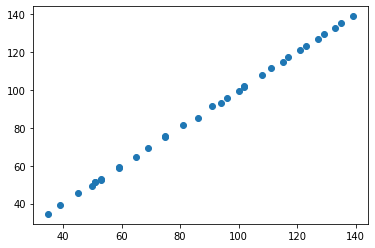

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99726819 0.816463  ]]


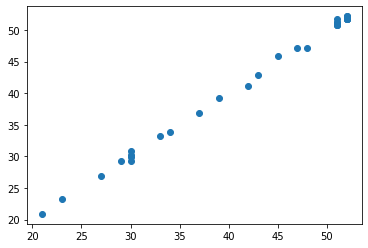

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.1930689]]
-------- 1 y up ->  center =  [[1.5110281]]
-------- 1 y up ->  right  =  [[1.93601553]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[131  -3]]
		 _X_center =  [[34 -3]]
		 _X_right  =  [[20 -3]]
		 predicted_left   =  [[133.86684333]]
		 predicted_center =  [[31.67143717]]
		 predicted_right  =  [[17.61825922]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00335376 -0.90598087]]
		 regression_center.coef_ =  [[1.00225802 0.72852644]]
		 regression_right.coef_  =  [[0.99

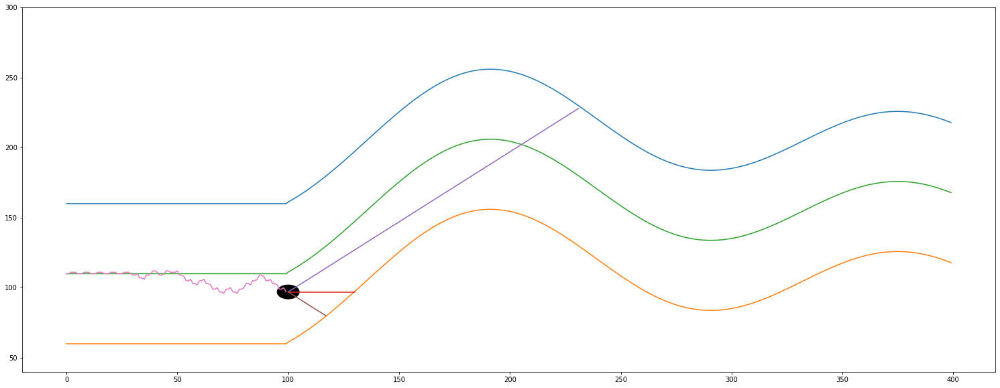

------------------------------ IF i % 3 == 1 ------------------------------
# i =  100
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[132  31  18]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.83       -0.02830189 -0.06060606]]
actual predicted =  [1.29625722]
actual self.y_distance[-1] =  1.7918807683047981
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.040816

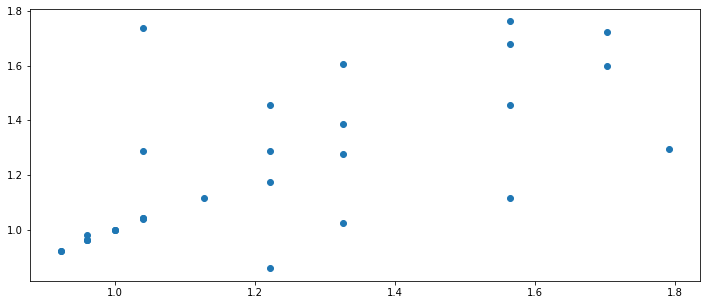

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  100
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(33, 4)
(33, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86.,  48.

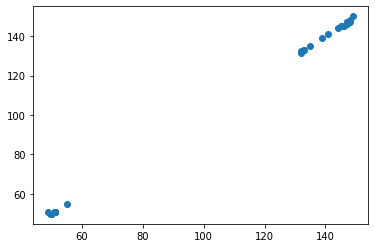

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00225802 0.72852644]]


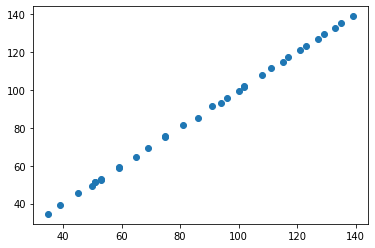

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99726819 0.816463  ]]


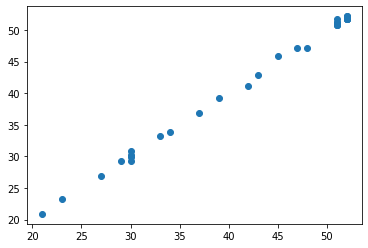

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.1930689]]
-------- 1 y up ->  center =  [[1.5110281]]
-------- 1 y up ->  right  =  [[1.93601553]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[132  -3]]
		 _X_center =  [[31 -3]]
		 _X_right  =  [[18 -3]]
		 predicted_left   =  [[134.87019709]]
		 predicted_center =  [[28.6646631]]
		 predicted_right  =  [[15.62372284]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00335376 -0.90598087]]
		 regression_center.coef_ =  [[1.00225802 0.72852644]]
		 regression_right.coef_  =  [[0.997

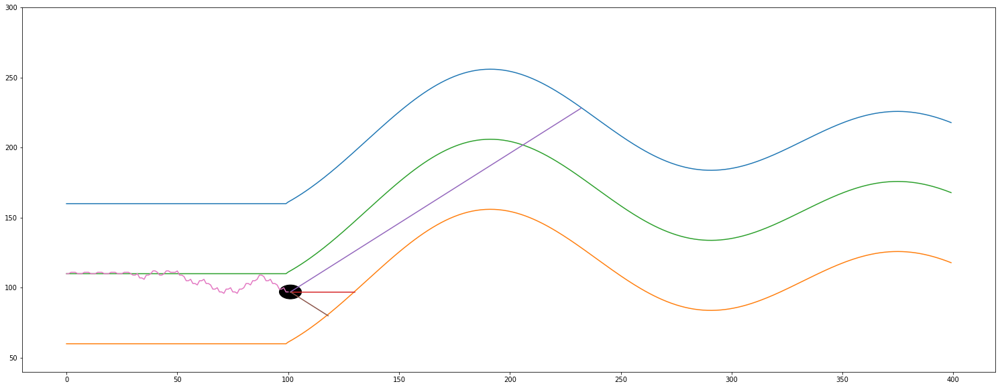

------------------------------ IF i % 3 == 2 ------------------------------
# i =  101
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  29
Sensor from left wall =  132
Sensor from right wall =  17
most távolsagra van a felső faltól =  66.07381028996195
most távolsagra van az alsó faltól =  33.92618971003806
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  101
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.9475753350047464
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  102
			 len(self.sensor_left)   =  102
			 len(self.sensor_center) =  102
			 len(self.sensor_right)  =  102
			 self.x                  =  101
			 -------------- Teszt End --------------
self.y =  96.0
------------------------------ IF len(self.before) > 9 ----------------

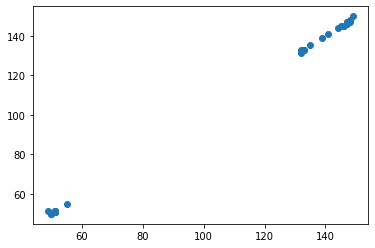

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00244305 0.73177325]]


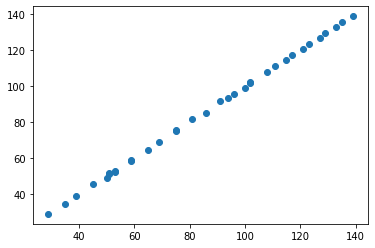

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99877903 0.82374488]]


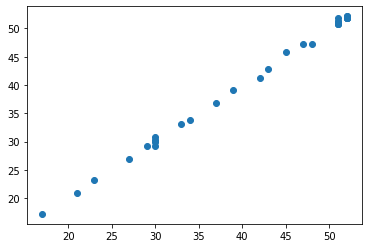

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.14521221]]
-------- 1 y up ->  center =  [[1.4950614]]
-------- 1 y up ->  right  =  [[1.87380447]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[132  -3]]
		 _X_center =  [[29 -3]]
		 _X_right  =  [[17 -3]]
		 predicted_left   =  [[134.73050621]]
		 predicted_center =  [[26.63637384]]
		 predicted_right  =  [[14.55928951]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00283721 -0.87601094]]
		 regression_center.coef_ =  [[1.00244305 0.73177325]]
		 regression_right.coef_  =  [[0.9

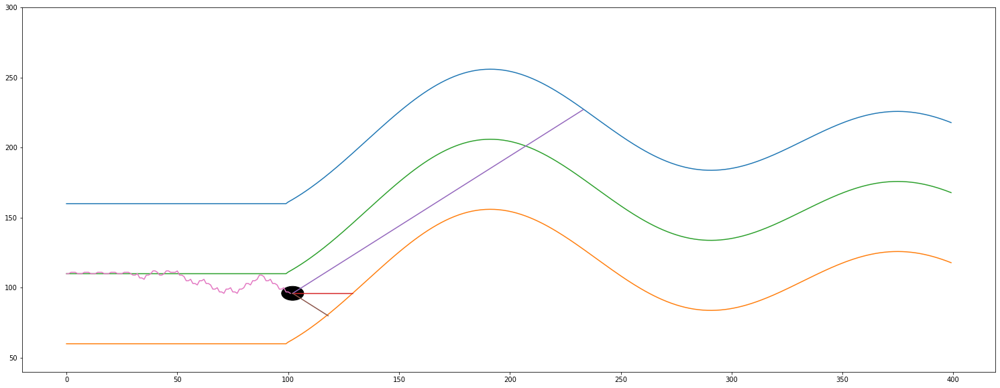

------------------------------ IF i % 3 == 0 ------------------------------
# i =  102
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (103, 3)
y.shape =  (103, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


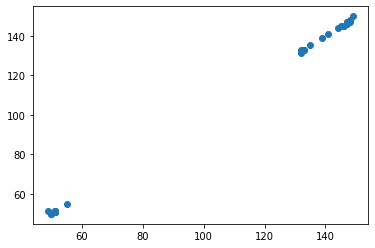

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00244305 0.73177325]]


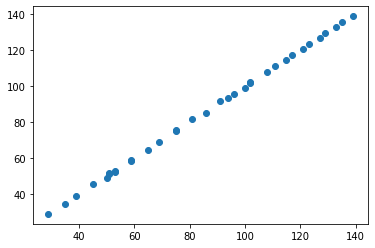

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99877903 0.82374488]]


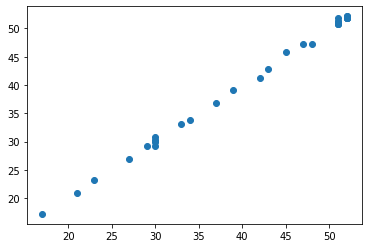

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.14521221]]
-------- 1 y up ->  center =  [[1.4950614]]
-------- 1 y up ->  right  =  [[1.87380447]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[132  -3]]
		 _X_center =  [[28 -3]]
		 _X_right  =  [[17 -3]]
		 predicted_left   =  [[134.73050621]]
		 predicted_center =  [[25.63393078]]
		 predicted_right  =  [[14.55928951]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00283721 -0.87601094]]
		 regression_center.coef_ =  [[1.00244305 0.73177325]]
		 regression_right.coef_  =  [[0.9

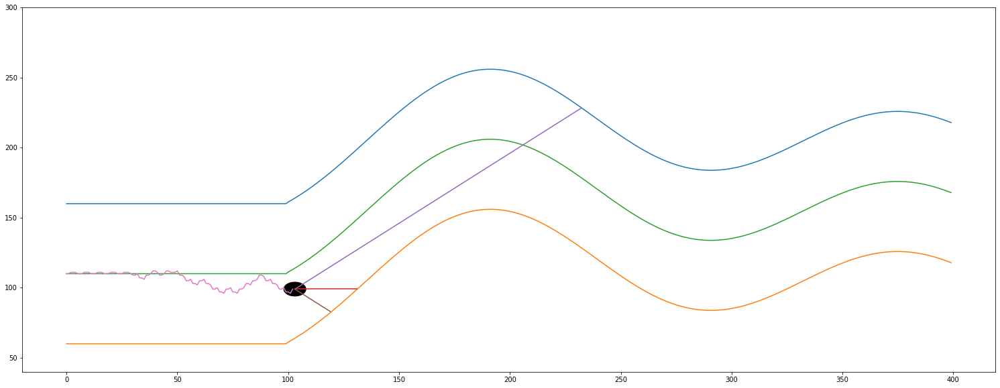

------------------------------ IF i % 3 == 1 ------------------------------
# i =  103
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[130  29  17]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.81       0.00892857 0.        ]]
actual predicted =  [1.82946486]
actual self.y_distance[-1] =  1.851987487441058
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265

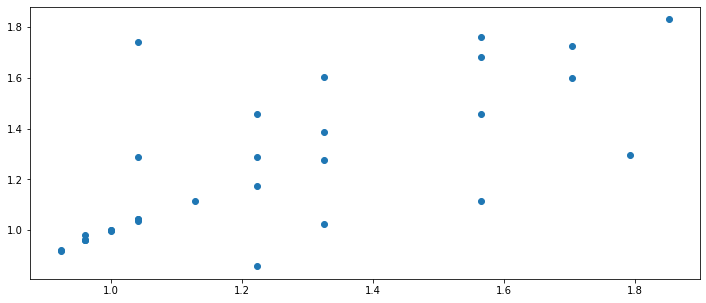

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  103
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(34, 4)
(34, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  86., 

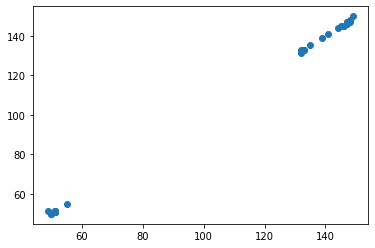

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00244305 0.73177325]]


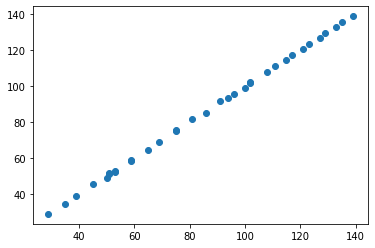

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99877903 0.82374488]]


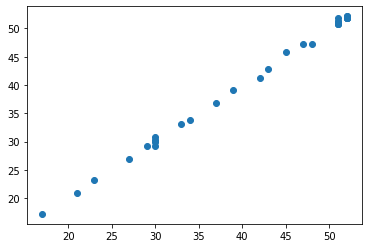

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.14521221]]
-------- 1 y up ->  center =  [[1.4950614]]
-------- 1 y up ->  right  =  [[1.87380447]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[130  -3]]
		 _X_center =  [[29 -3]]
		 _X_right  =  [[17 -3]]
		 predicted_left   =  [[132.72483179]]
		 predicted_center =  [[26.63637384]]
		 predicted_right  =  [[14.55928951]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00283721 -0.87601094]]
		 regression_center.coef_ =  [[1.00244305 0.73177325]]
		 regression_right.coef_  =  [[0.9

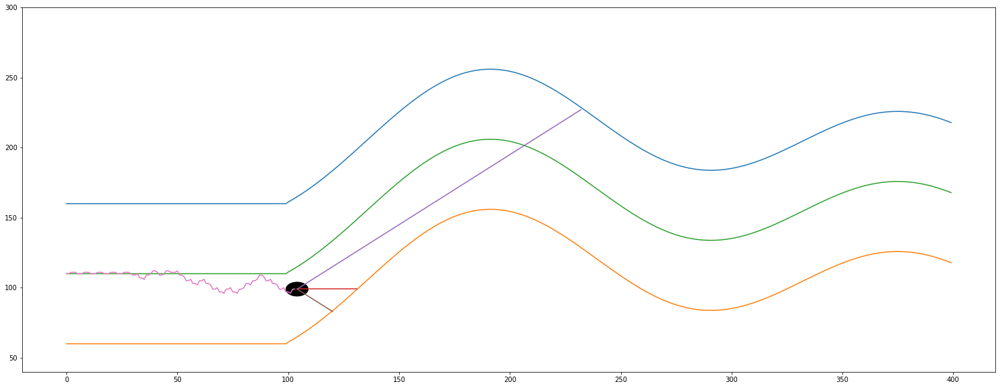

------------------------------ IF i % 3 == 2 ------------------------------
# i =  104
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  29
Sensor from left wall =  129
Sensor from right wall =  17
most távolsagra van a felső faltól =  64.90706152640314
most távolsagra van az alsó faltól =  35.09293847359686
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  104
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.8495761355304503
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  105
			 len(self.sensor_left)   =  105
			 len(self.sensor_center) =  105
			 len(self.sensor_right)  =  105
			 self.x                  =  104
			 -------------- Teszt End --------------
self.y =  100.0
------------------------------ IF len(self.before) > 9 -----------------

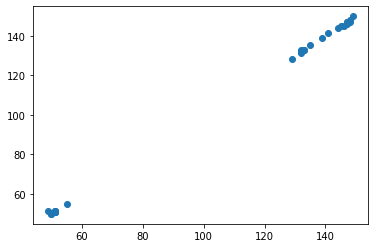

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00180371 0.7438354 ]]


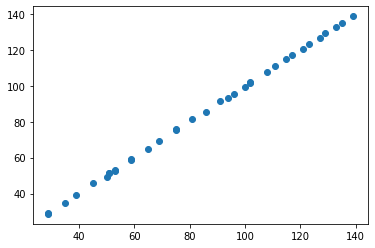

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00315149 0.80230143]]


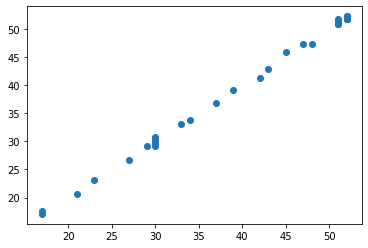

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.13676037]]
-------- 1 y up ->  center =  [[1.57251412]]
-------- 1 y up ->  right  =  [[1.65241835]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[129  -3]]
		 _X_center =  [[29 -3]]
		 _X_right  =  [[17 -3]]
		 predicted_left   =  [[131.68904322]]
		 predicted_center =  [[26.64767644]]
		 predicted_right  =  [[14.49363651]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0032071  -0.85382378]]
		 regression_center.coef_ =  [[1.00180371 0.7438354 ]]
		 regression_right.coef_  =  [[1.

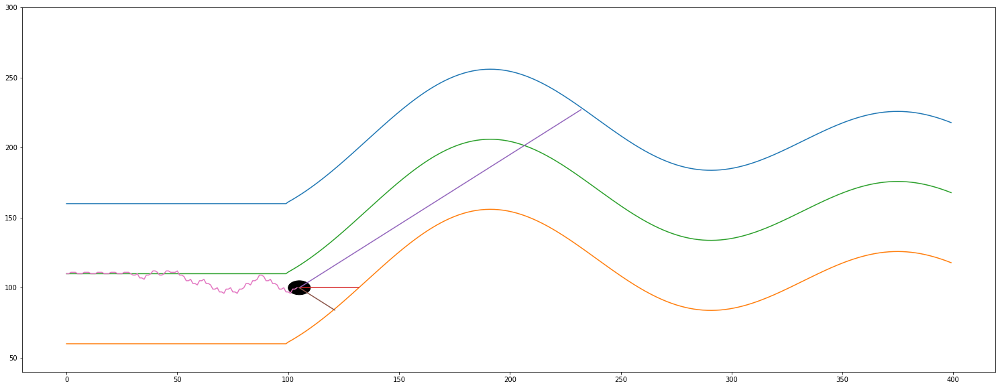

------------------------------ IF i % 3 == 0 ------------------------------
# i =  105
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (106, 3)
y.shape =  (106, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


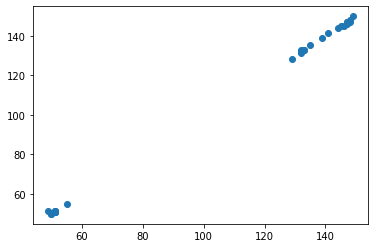

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00180371 0.7438354 ]]


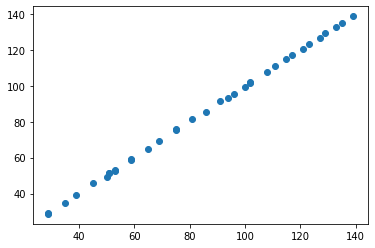

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00315149 0.80230143]]


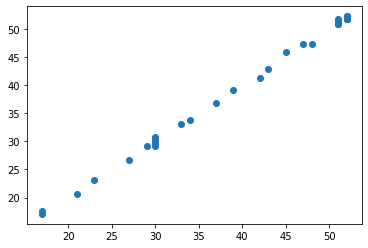

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.13676037]]
-------- 1 y up ->  center =  [[1.57251412]]
-------- 1 y up ->  right  =  [[1.65241835]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[128  -3]]
		 _X_center =  [[28 -3]]
		 _X_right  =  [[17 -3]]
		 predicted_left   =  [[130.68583612]]
		 predicted_center =  [[25.64587273]]
		 predicted_right  =  [[14.49363651]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0032071  -0.85382378]]
		 regression_center.coef_ =  [[1.00180371 0.7438354 ]]
		 regression_right.coef_  =  [[1.

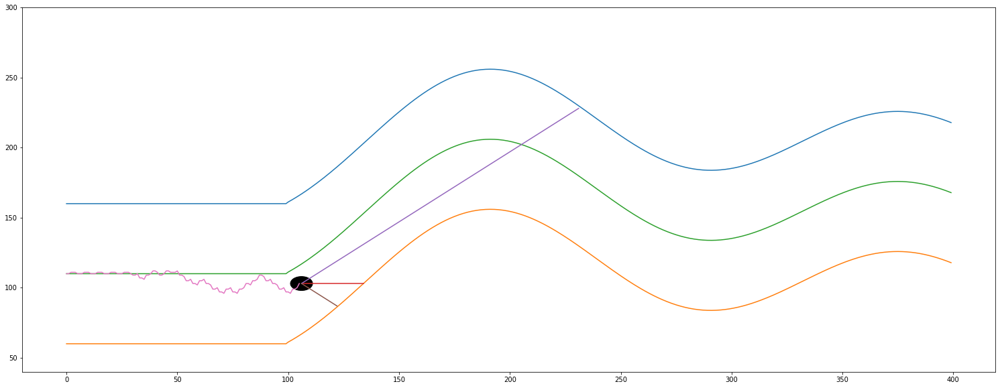

------------------------------ IF i % 3 == 1 ------------------------------
# i =  106
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[126  29  17]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.77       0.00892857 0.        ]]
actual predicted =  [1.50511928]
actual self.y_distance[-1] =  1.771895792764982
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163265

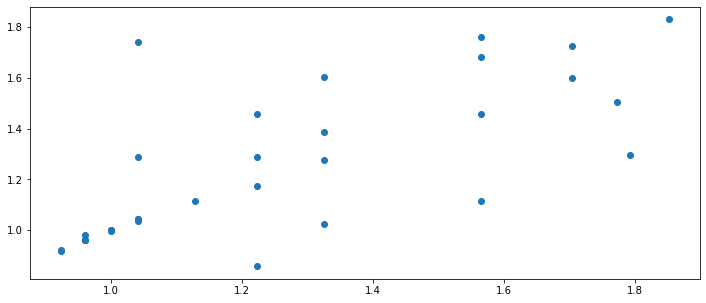

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  106
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(35, 4)
(35, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.,  8

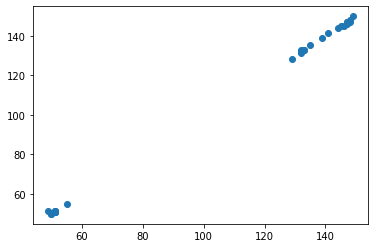

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00180371 0.7438354 ]]


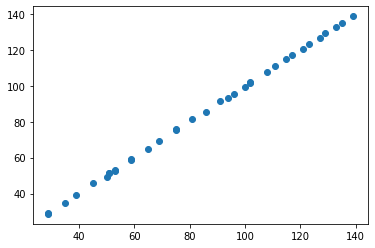

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00315149 0.80230143]]


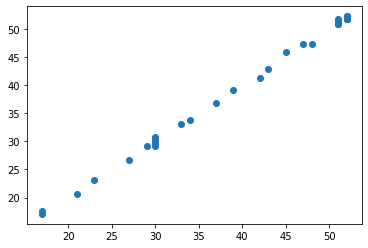

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.13676037]]
-------- 1 y up ->  center =  [[1.57251412]]
-------- 1 y up ->  right  =  [[1.65241835]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[126  -3]]
		 _X_center =  [[29 -3]]
		 _X_right  =  [[17 -3]]
		 predicted_left   =  [[128.67942193]]
		 predicted_center =  [[26.64767644]]
		 predicted_right  =  [[14.49363651]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0032071  -0.85382378]]
		 regression_center.coef_ =  [[1.00180371 0.7438354 ]]
		 regression_right.coef_  =  [[1.

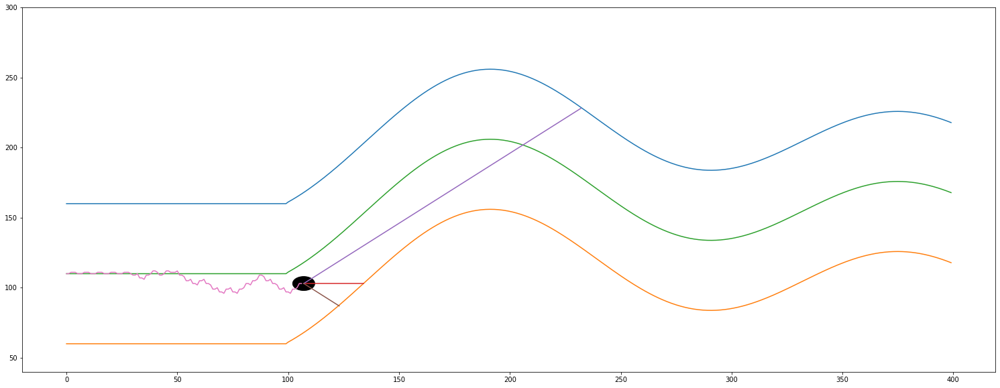

------------------------------ IF i % 3 == 2 ------------------------------
# i =  107
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  27
Sensor from left wall =  126
Sensor from right wall =  16
most távolsagra van a felső faltól =  65.96898310853805
most távolsagra van az alsó faltól =  34.031016891461945
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  107
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.9384957939675624
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  108
			 len(self.sensor_left)   =  108
			 len(self.sensor_center) =  108
			 len(self.sensor_right)  =  108
			 self.x                  =  107
			 -------------- Teszt End --------------
self.y =  102.0
------------------------------ IF len(self.before) > 9 --------------

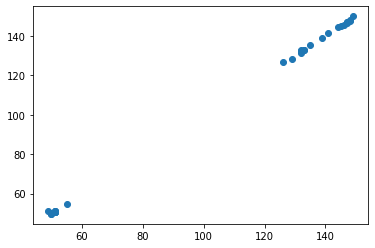

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00197534 0.74731134]]


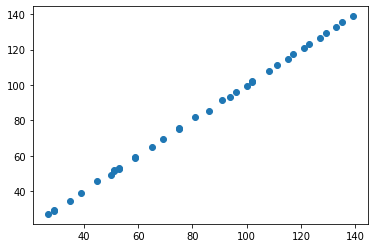

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00359208 0.80495688]]


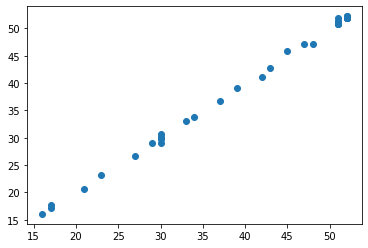

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.10281726]]
-------- 1 y up ->  center =  [[1.55826908]]
-------- 1 y up ->  right  =  [[1.63489297]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[126  -3]]
		 _X_center =  [[27 -3]]
		 _X_right  =  [[16 -3]]
		 predicted_left   =  [[128.56345452]]
		 predicted_center =  [[24.62038252]]
		 predicted_right  =  [[13.46894661]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00284833 -0.82755755]]
		 regression_center.coef_ =  [[1.00197534 0.74731134]]
		 regression_right.coef_  =  [[1.

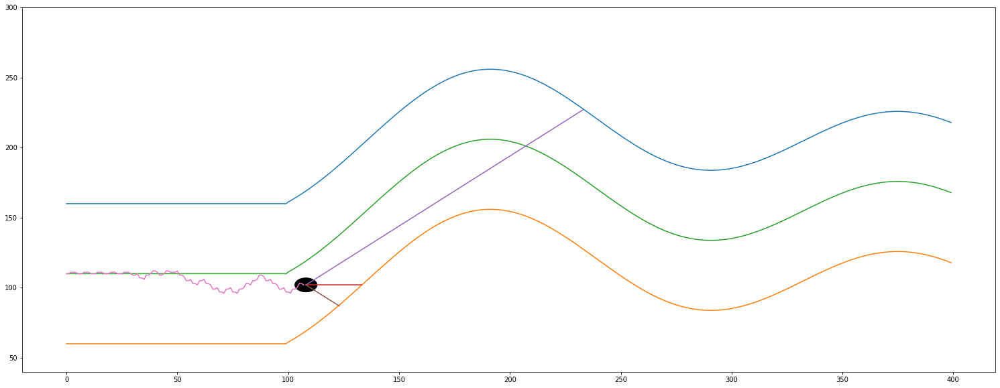

------------------------------ IF i % 3 == 0 ------------------------------
# i =  108
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (109, 3)
y.shape =  (109, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


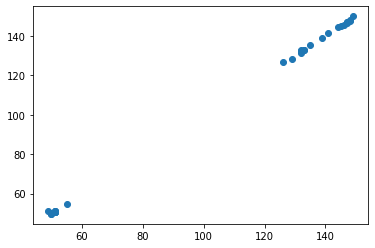

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00197534 0.74731134]]


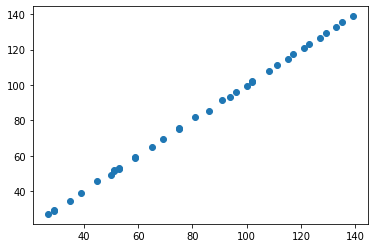

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00359208 0.80495688]]


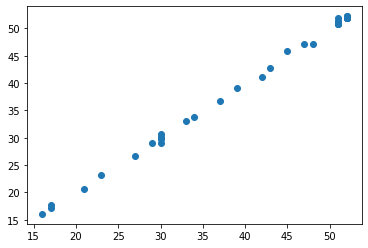

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.10281726]]
-------- 1 y up ->  center =  [[1.55826908]]
-------- 1 y up ->  right  =  [[1.63489297]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[126  -3]]
		 _X_center =  [[26 -3]]
		 _X_right  =  [[16 -3]]
		 predicted_left   =  [[128.56345452]]
		 predicted_center =  [[23.61840718]]
		 predicted_right  =  [[13.46894661]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00284833 -0.82755755]]
		 regression_center.coef_ =  [[1.00197534 0.74731134]]
		 regression_right.coef_  =  [[1.

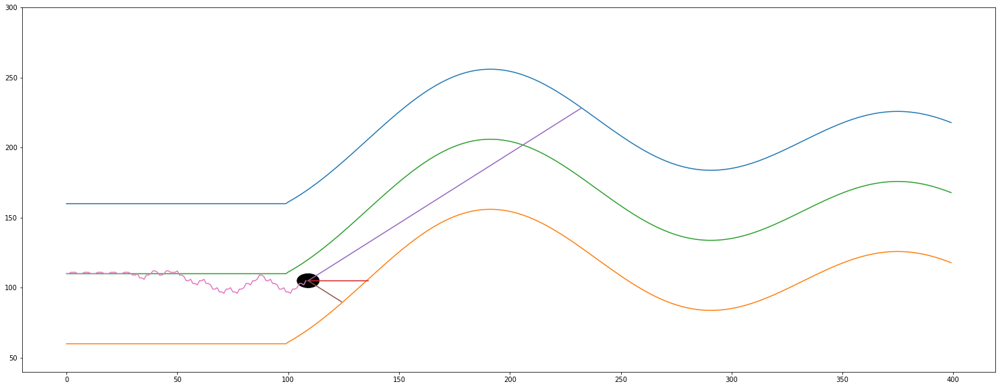

------------------------------ IF i % 3 == 1 ------------------------------
# i =  109
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[124  28  16]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.75       0.01754386 0.        ]]
actual predicted =  [1.93357712]
actual self.y_distance[-1] =  1.8679247799660004
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.040816326

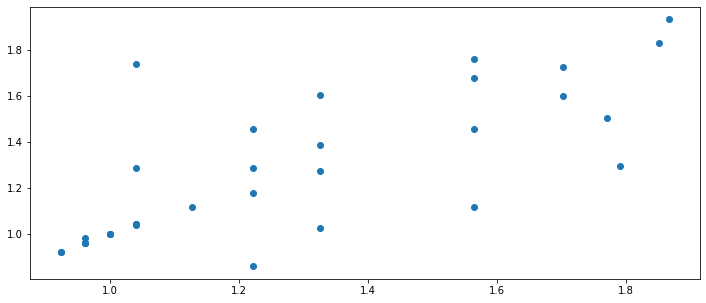

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  109
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(36, 4)
(36, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109., 146.

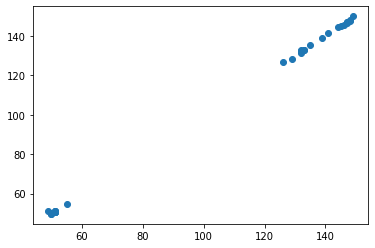

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00197534 0.74731134]]


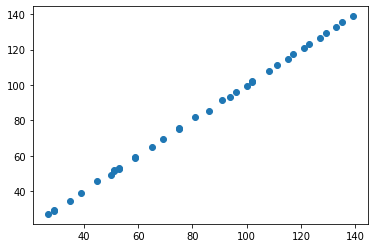

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00359208 0.80495688]]


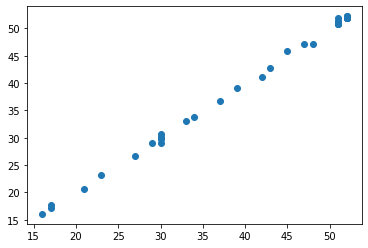

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.10281726]]
-------- 1 y up ->  center =  [[1.55826908]]
-------- 1 y up ->  right  =  [[1.63489297]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[124  -3]]
		 _X_center =  [[28 -3]]
		 _X_right  =  [[16 -3]]
		 predicted_left   =  [[126.55775786]]
		 predicted_center =  [[25.62235786]]
		 predicted_right  =  [[13.46894661]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00284833 -0.82755755]]
		 regression_center.coef_ =  [[1.00197534 0.74731134]]
		 regression_right.coef_  =  [[1.

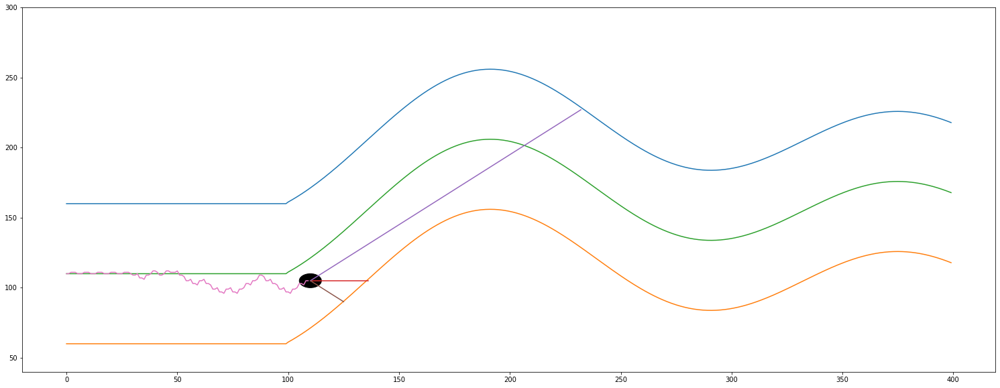

------------------------------ IF i % 3 == 2 ------------------------------
# i =  110
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  27
Sensor from left wall =  123
Sensor from right wall =  16
most távolsagra van a felső faltól =  65.24776420832944
most távolsagra van az alsó faltól =  34.75223579167057
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  110
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.8775127044910316
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  111
			 len(self.sensor_left)   =  111
			 len(self.sensor_center) =  111
			 len(self.sensor_right)  =  111
			 self.x                  =  110
			 -------------- Teszt End --------------
self.y =  106.0
------------------------------ IF len(self.before) > 9 -----------------

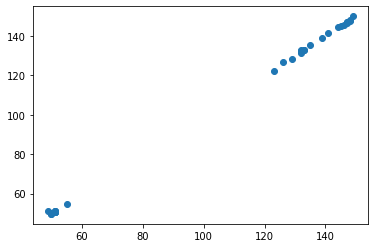

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00271455 0.73137117]]


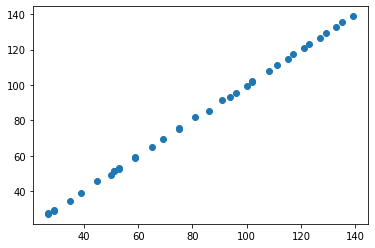

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00637527 0.78818215]]


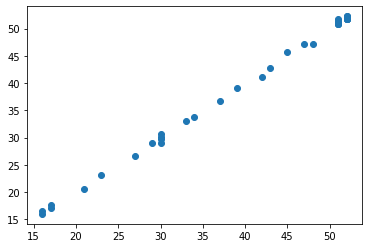

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.08919517]]
-------- 1 y up ->  center =  [[1.46704621]]
-------- 1 y up ->  right  =  [[1.49156206]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[123  -3]]
		 _X_center =  [[27 -3]]
		 _X_right  =  [[16 -3]]
		 predicted_left   =  [[125.5207926]]
		 predicted_center =  [[24.61213992]]
		 predicted_right  =  [[13.43446249]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00312039 -0.80732511]]
		 regression_center.coef_ =  [[1.00271455 0.73137117]]
		 regression_right.coef_  =  [[1.0

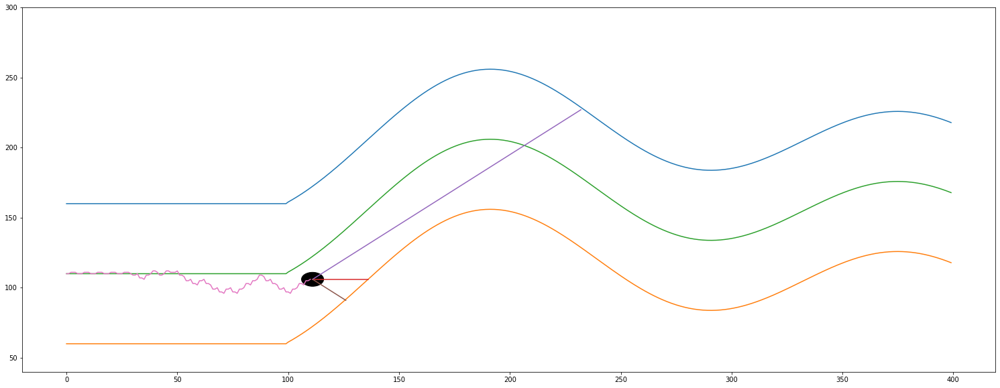

------------------------------ IF i % 3 == 0 ------------------------------
# i =  111
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (112, 3)
y.shape =  (112, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


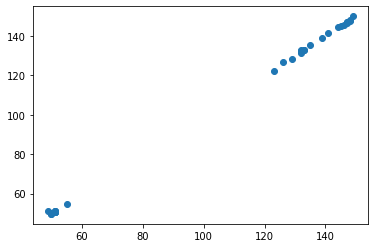

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00271455 0.73137117]]


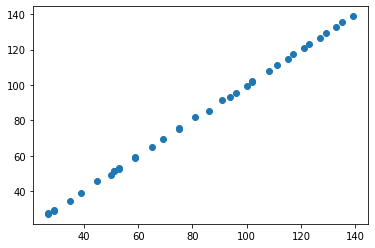

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00637527 0.78818215]]


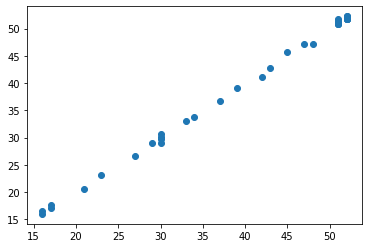

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.08919517]]
-------- 1 y up ->  center =  [[1.46704621]]
-------- 1 y up ->  right  =  [[1.49156206]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[122  -3]]
		 _X_center =  [[26 -3]]
		 _X_right  =  [[16 -3]]
		 predicted_left   =  [[124.51767221]]
		 predicted_center =  [[23.60942537]]
		 predicted_right  =  [[13.43446249]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00312039 -0.80732511]]
		 regression_center.coef_ =  [[1.00271455 0.73137117]]
		 regression_right.coef_  =  [[1.

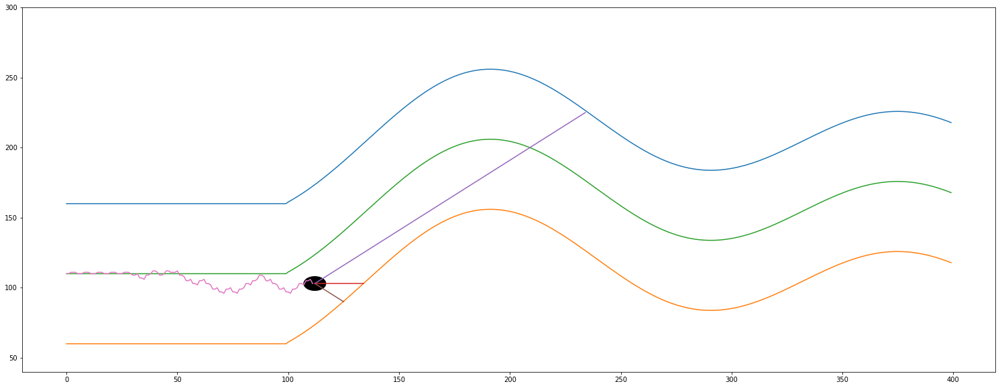

------------------------------ IF i % 3 == 1 ------------------------------
# i =  112
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[123  23  14]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.74       -0.02631579 -0.05405405]]
actual predicted =  [2.0270738]
actual self.y_distance[-1] =  2.395245718058904
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.04081632

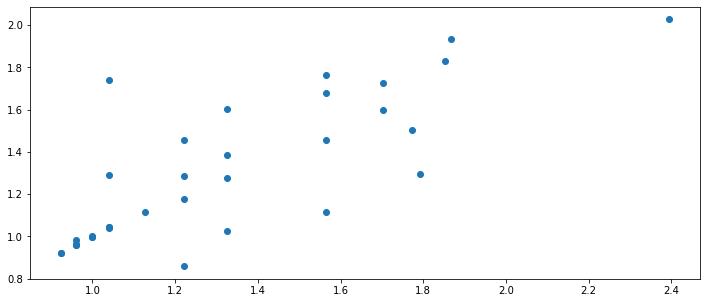

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  112
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1.]
(37, 4)
(37, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([109.,

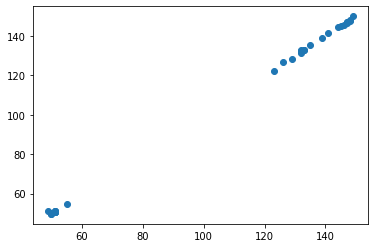

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00271455 0.73137117]]


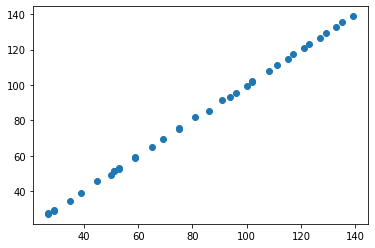

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00637527 0.78818215]]


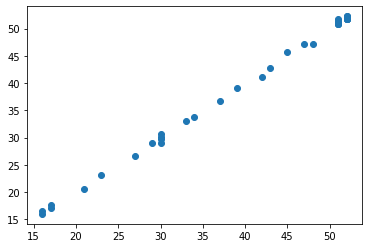

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.08919517]]
-------- 1 y up ->  center =  [[1.46704621]]
-------- 1 y up ->  right  =  [[1.49156206]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[123  -3]]
		 _X_center =  [[23 -3]]
		 _X_right  =  [[14 -3]]
		 predicted_left   =  [[125.5207926]]
		 predicted_center =  [[20.6012817]]
		 predicted_right  =  [[11.42171195]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00312039 -0.80732511]]
		 regression_center.coef_ =  [[1.00271455 0.73137117]]
		 regression_right.coef_  =  [[1.00

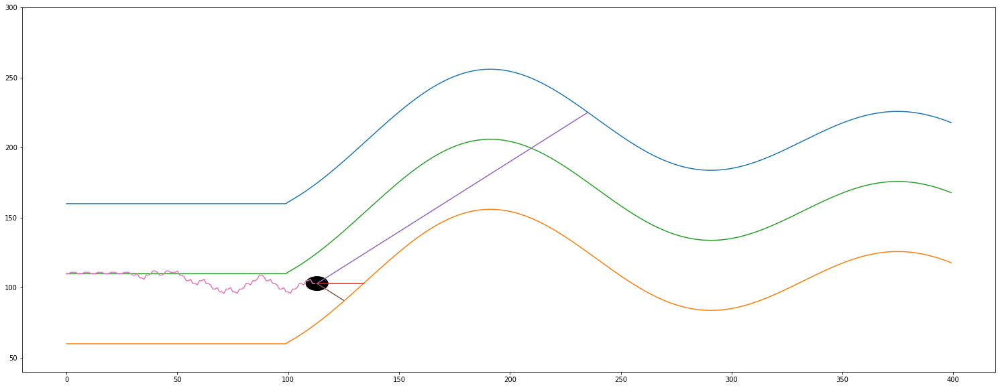

------------------------------ IF i % 3 == 2 ------------------------------
# i =  113
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  21
Sensor from left wall =  123
Sensor from right wall =  13
most távolsagra van a felső faltól =  72.7289240916682
most távolsagra van az alsó faltól =  27.271075908331795
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  113
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  2.6668886968793277
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  114
			 len(self.sensor_left)   =  114
			 len(self.sensor_center) =  114
			 len(self.sensor_right)  =  114
			 self.x                  =  113
			 -------------- Teszt End --------------
self.y =  102.0
------------------------------ IF len(self.before) > 9 ---------------

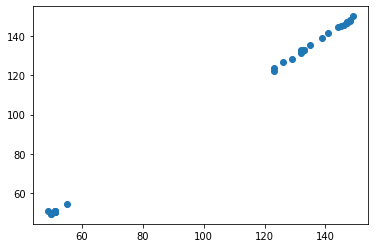

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00278649 0.73288236]]


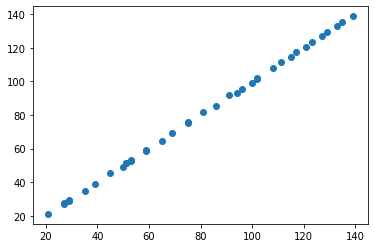

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00235613 0.76259986]]


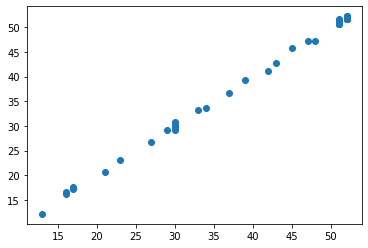

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.06267749]]
-------- 1 y up ->  center =  [[1.46129138]]
-------- 1 y up ->  right  =  [[1.64619307]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[123  -3]]
		 _X_center =  [[21 -3]]
		 _X_right  =  [[13 -3]]
		 predicted_left   =  [[125.4203672]]
		 predicted_center =  [[18.58549173]]
		 predicted_right  =  [[10.62406719]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00284431 -0.78400961]]
		 regression_center.coef_ =  [[1.00278649 0.73288236]]
		 regression_right.coef_  =  [[1.0

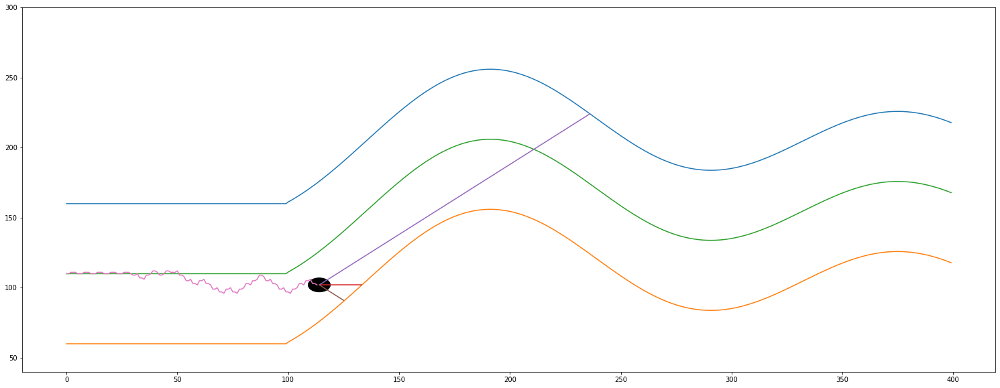

------------------------------ IF i % 3 == 0 ------------------------------
# i =  114
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (115, 3)
y.shape =  (115, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


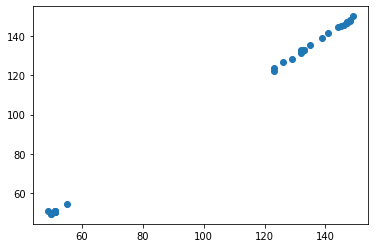

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00278649 0.73288236]]


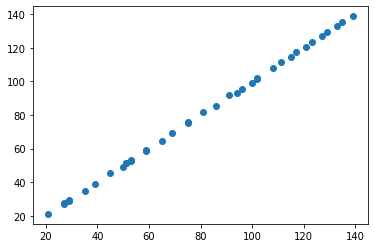

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00235613 0.76259986]]


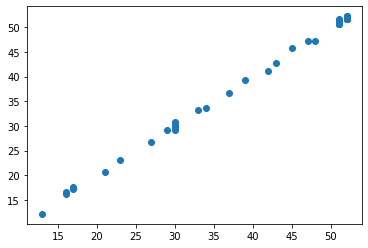

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.06267749]]
-------- 1 y up ->  center =  [[1.46129138]]
-------- 1 y up ->  right  =  [[1.64619307]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[123  -3]]
		 _X_center =  [[20 -3]]
		 _X_right  =  [[12 -3]]
		 predicted_left   =  [[125.4203672]]
		 predicted_center =  [[17.58270525]]
		 predicted_right  =  [[9.62171106]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00284431 -0.78400961]]
		 regression_center.coef_ =  [[1.00278649 0.73288236]]
		 regression_right.coef_  =  [[1.00

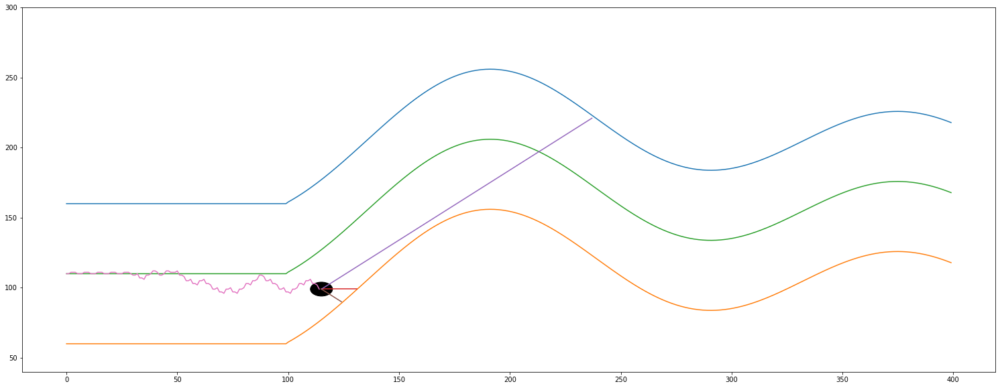

------------------------------ IF i % 3 == 1 ------------------------------
# i =  115
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[123  17  10]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.74       -0.025      -0.04878049]]
actual predicted =  [2.00402723]
actual self.y_distance[-1] =  3.577460983039208
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163

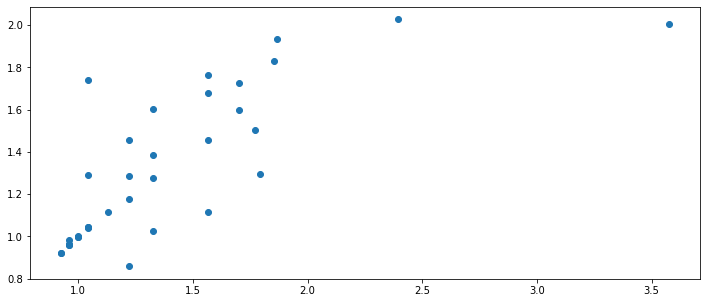

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  115
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.]
(38, 4)
(38, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), array([1

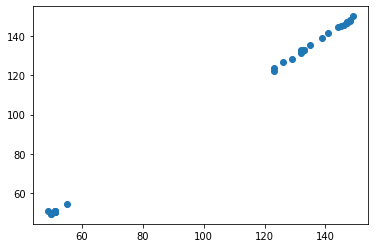

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00278649 0.73288236]]


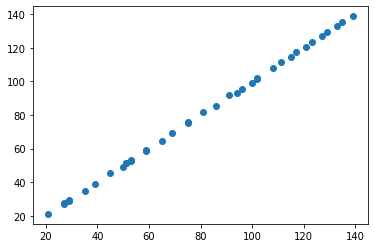

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00235613 0.76259986]]


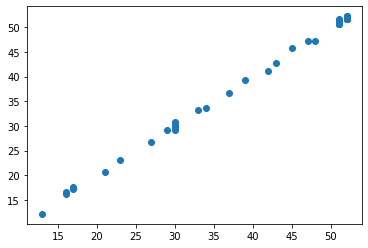

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.06267749]]
-------- 1 y up ->  center =  [[1.46129138]]
-------- 1 y up ->  right  =  [[1.64619307]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[123  -3]]
		 _X_center =  [[17 -3]]
		 _X_right  =  [[10 -3]]
		 predicted_left   =  [[125.4203672]]
		 predicted_center =  [[14.57434578]]
		 predicted_right  =  [[7.6169988]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00284431 -0.78400961]]
		 regression_center.coef_ =  [[1.00278649 0.73288236]]
		 regression_right.coef_  =  [[1.002

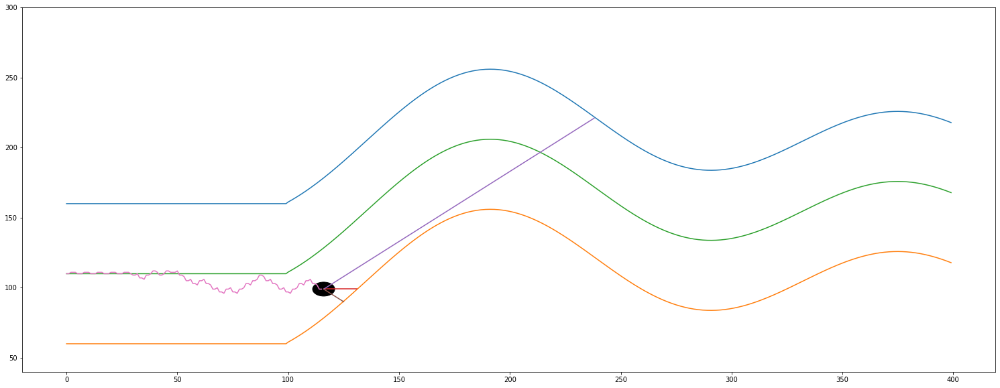

------------------------------ IF i % 3 == 2 ------------------------------
# i =  116
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  17
Sensor from left wall =  122
Sensor from right wall =  10
most távolsagra van a felső faltól =  78.39544982058476
most távolsagra van az alsó faltól =  21.60455017941524
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  116
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  3.628654573668455
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  117
			 len(self.sensor_left)   =  117
			 len(self.sensor_center) =  117
			 len(self.sensor_right)  =  117
			 self.x                  =  116
			 -------------- Teszt End --------------
self.y =  100.0
------------------------------ IF len(self.before) > 9 ------------------

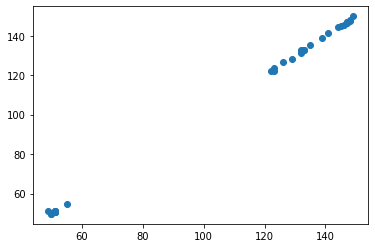

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.002195   0.74518451]]


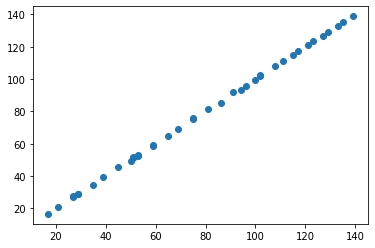

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00489929 0.74718649]]


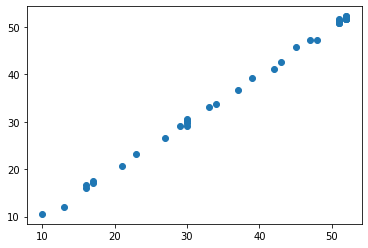

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.0675722]]
-------- 1 y up ->  center =  [[1.53153376]]
-------- 1 y up ->  right  =  [[1.51872618]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[122  -3]]
		 _X_center =  [[17 -3]]
		 _X_right  =  [[10 -3]]
		 predicted_left   =  [[124.42996207]]
		 predicted_center =  [[14.58591573]]
		 predicted_right  =  [[7.57407386]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00274856 -0.79123966]]
		 regression_center.coef_ =  [[1.002195   0.74518451]]
		 regression_right.coef_  =  [[1.00

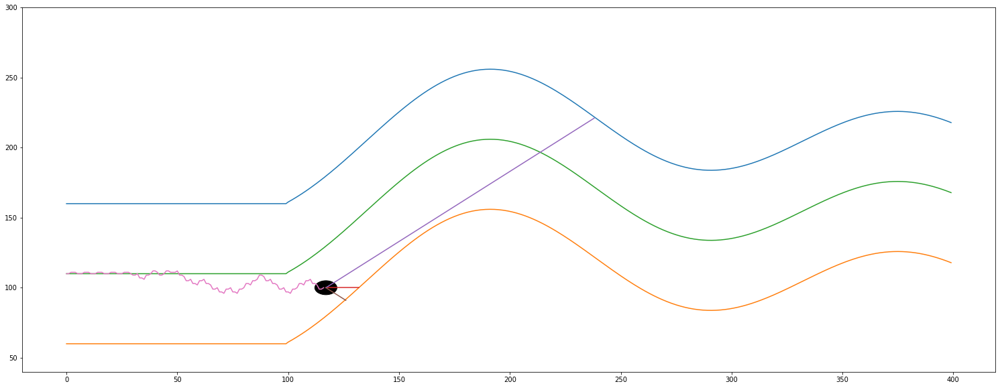

------------------------------ IF i % 3 == 0 ------------------------------
# i =  117
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (118, 3)
y.shape =  (118, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


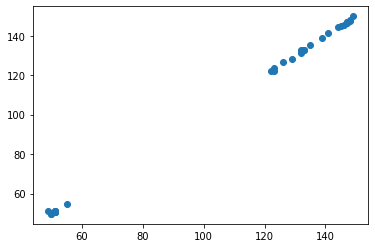

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.002195   0.74518451]]


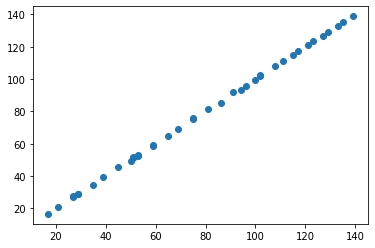

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00489929 0.74718649]]


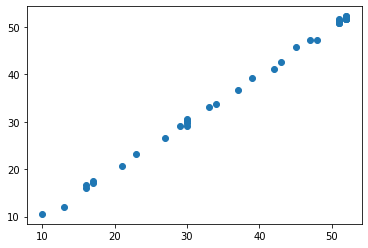

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.0675722]]
-------- 1 y up ->  center =  [[1.53153376]]
-------- 1 y up ->  right  =  [[1.51872618]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[122  -3]]
		 _X_center =  [[16 -3]]
		 _X_right  =  [[10 -3]]
		 predicted_left   =  [[124.42996207]]
		 predicted_center =  [[13.58372073]]
		 predicted_right  =  [[7.57407386]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00274856 -0.79123966]]
		 regression_center.coef_ =  [[1.002195   0.74518451]]
		 regression_right.coef_  =  [[1.00

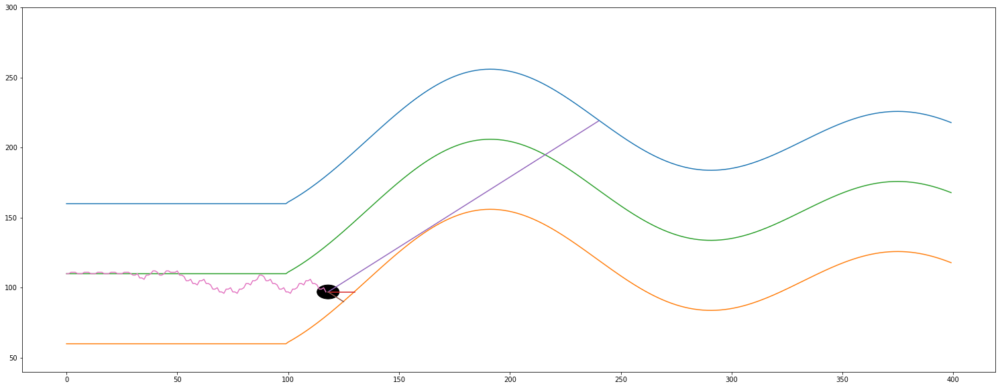

------------------------------ IF i % 3 == 1 ------------------------------
# i =  118
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[123  13   8]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.74       -0.02419355 -0.04651163]]
actual predicted =  [2.42202691]
actual self.y_distance[-1] =  5.224054302642571
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163

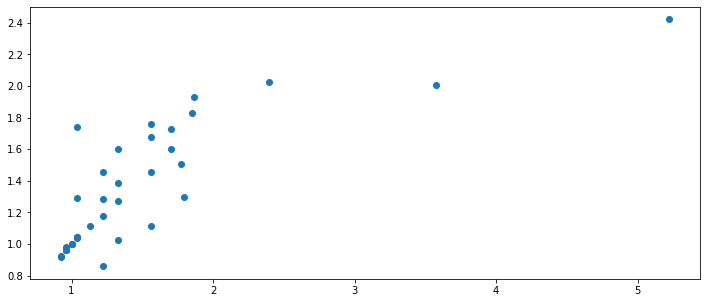

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  118
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1.]
(39, 4)
(39, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), arra

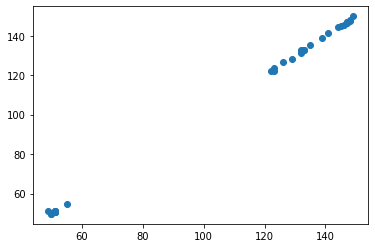

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.002195   0.74518451]]


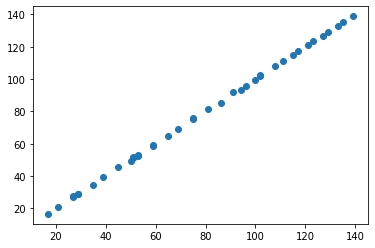

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00489929 0.74718649]]


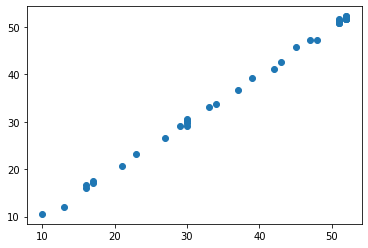

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.0675722]]
-------- 1 y up ->  center =  [[1.53153376]]
-------- 1 y up ->  right  =  [[1.51872618]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[123  -3]]
		 _X_center =  [[13 -3]]
		 _X_right  =  [[ 8 -3]]
		 predicted_left   =  [[125.43271063]]
		 predicted_center =  [[10.57713573]]
		 predicted_right  =  [[5.56427528]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00274856 -0.79123966]]
		 regression_center.coef_ =  [[1.002195   0.74518451]]
		 regression_right.coef_  =  [[1.00

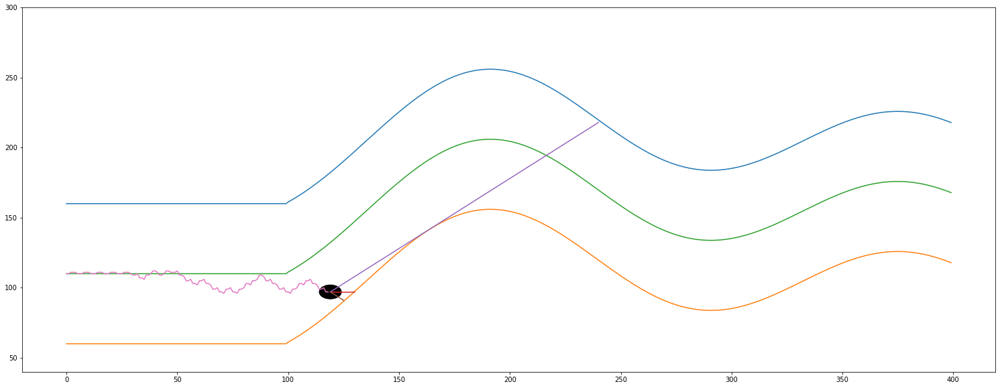

------------------------------ IF i % 3 == 2 ------------------------------
# i =  119
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  11
Sensor from left wall =  123
Sensor from right wall =  7
most távolsagra van a felső faltól =  86.227959784431
most távolsagra van az alsó faltól =  13.772040215569007
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  119
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  6.261088294452703
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  120
			 len(self.sensor_left)   =  120
			 len(self.sensor_center) =  120
			 len(self.sensor_right)  =  120
			 self.x                  =  119
			 -------------- Teszt End --------------
self.y =  96.0
------------------------------ IF len(self.before) > 9 -------------------

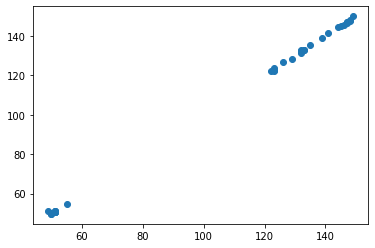

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00226825 0.74671103]]


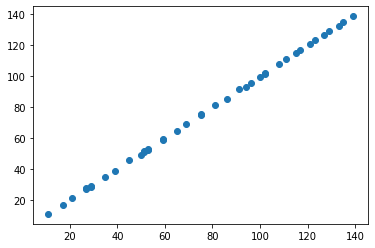

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00144217 0.72456735]]


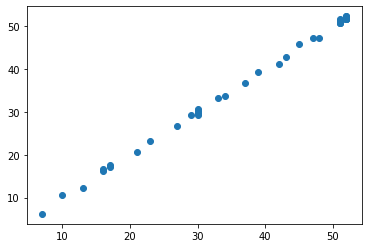

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.07161599]]
-------- 1 y up ->  center =  [[1.52591154]]
-------- 1 y up ->  right  =  [[1.64663975]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[123  -3]]
		 _X_center =  [[11 -3]]
		 _X_right  =  [[ 7 -3]]
		 predicted_left   =  [[125.4486872]]
		 predicted_center =  [[8.56174995]]
		 predicted_right  =  [[4.75702336]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0027901  -0.79497782]]
		 regression_center.coef_ =  [[1.00226825 0.74671103]]
		 regression_right.coef_  =  [[1.001

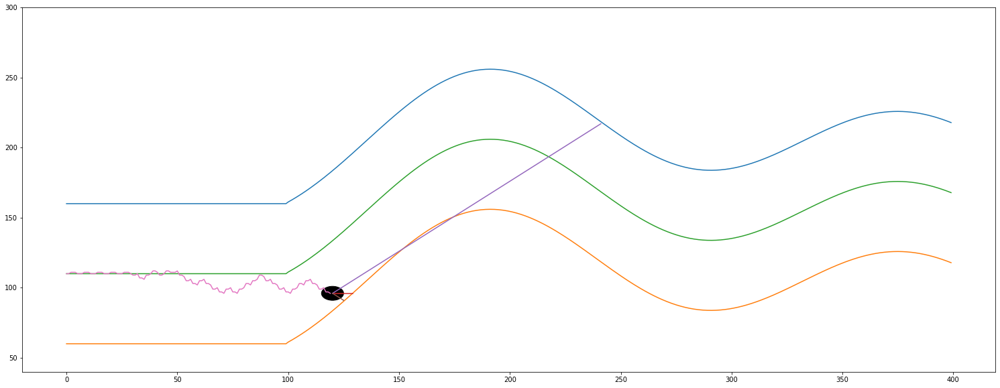

------------------------------ IF i % 3 == 0 ------------------------------
# i =  120
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (121, 3)
y.shape =  (121, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


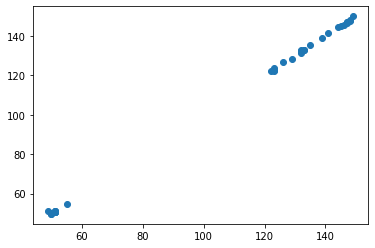

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00226825 0.74671103]]


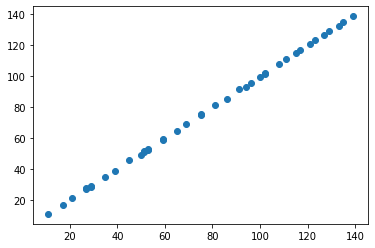

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00144217 0.72456735]]


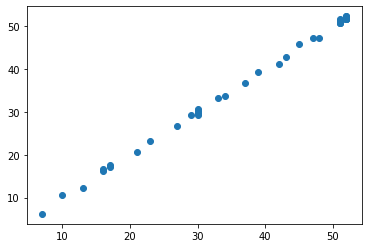

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.07161599]]
-------- 1 y up ->  center =  [[1.52591154]]
-------- 1 y up ->  right  =  [[1.64663975]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[122  -3]]
		 _X_center =  [[10 -3]]
		 _X_right  =  [[ 6 -3]]
		 predicted_left   =  [[124.4458971]]
		 predicted_center =  [[7.55948169]]
		 predicted_right  =  [[3.75558119]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0027901  -0.79497782]]
		 regression_center.coef_ =  [[1.00226825 0.74671103]]
		 regression_right.coef_  =  [[1.001

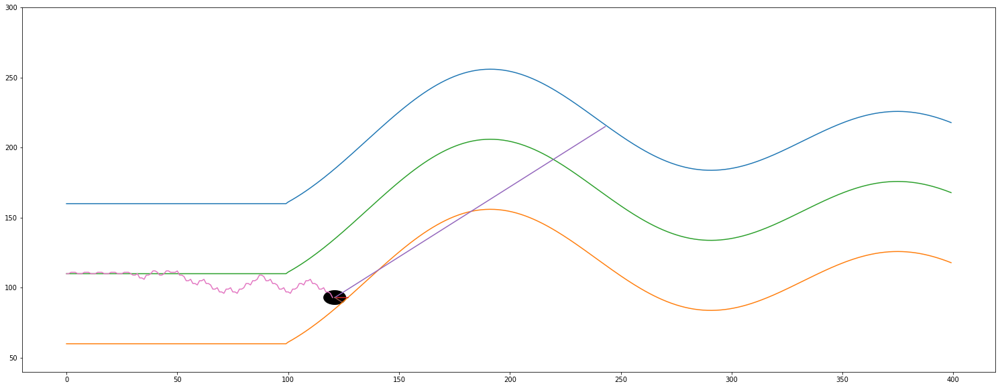

------------------------------ IF i % 3 == 1 ------------------------------
# i =  121
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[123   7   4]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.74       -0.02307692 -0.04255319]]
actual predicted =  [7.65799338]
actual self.y_distance[-1] =  11.29198167177034
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.0408163

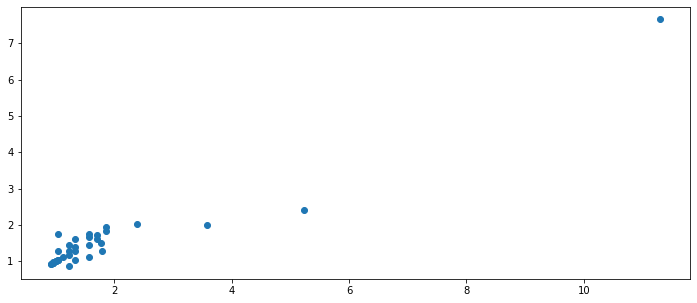

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  121
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.]
(40, 4)
(40, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.]), 

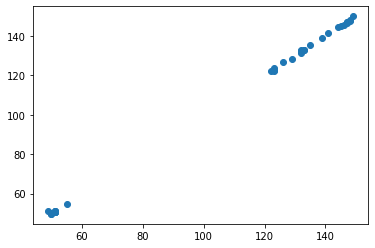

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00226825 0.74671103]]


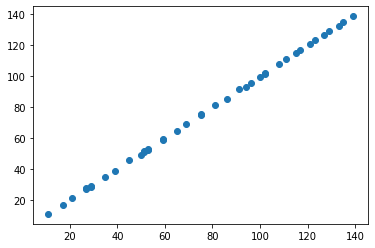

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00144217 0.72456735]]


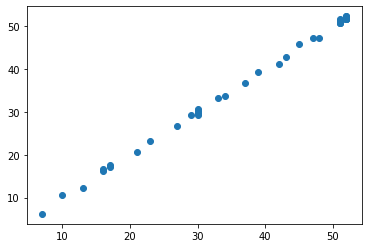

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.07161599]]
-------- 1 y up ->  center =  [[1.52591154]]
-------- 1 y up ->  right  =  [[1.64663975]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[123  -3]]
		 _X_center =  [[ 7 -3]]
		 _X_right  =  [[ 4 -3]]
		 predicted_left   =  [[125.4486872]]
		 predicted_center =  [[4.55267693]]
		 predicted_right  =  [[1.75269686]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.0027901  -0.79497782]]
		 regression_center.coef_ =  [[1.00226825 0.74671103]]
		 regression_right.coef_  =  [[1.001

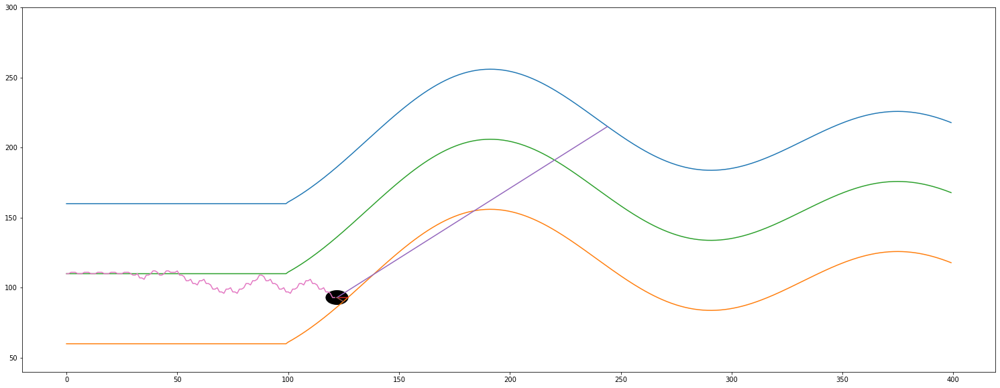

------------------------------ IF i % 3 == 2 ------------------------------
# i =  122
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up
Sensor center =  7
Sensor from left wall =  122
Sensor from right wall =  4
most távolsagra van a felső faltól =  92.20489143234215
most távolsagra van az alsó faltól =  7.795108567657863
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  122
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  11.828557695129865
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  123
			 len(self.sensor_left)   =  123
			 len(self.sensor_center) =  123
			 len(self.sensor_right)  =  123
			 self.x                  =  122
			 -------------- Teszt End --------------
self.y =  94.0
------------------------------ IF len(self.before) > 9 --------------------

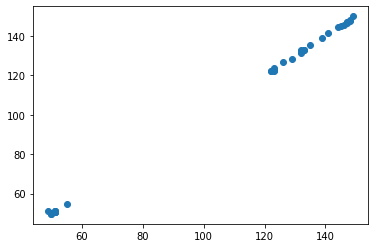

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00174934 0.75759477]]


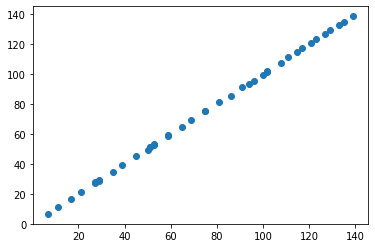

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00367943 0.71020809]]


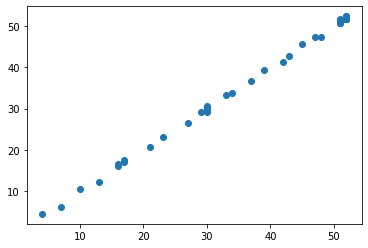

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.07603612]]
-------- 1 y up ->  center =  [[1.58600067]]
-------- 1 y up ->  right  =  [[1.53648497]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[122  -3]]
		 _X_center =  [[ 7 -3]]
		 _X_right  =  [[ 4 -3]]
		 predicted_left   =  [[124.45719718]]
		 predicted_center =  [[4.56611764]]
		 predicted_right  =  [[1.7066909]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00270505 -0.80148042]]
		 regression_center.coef_ =  [[1.00174934 0.75759477]]
		 regression_right.coef_  =  [[1.003

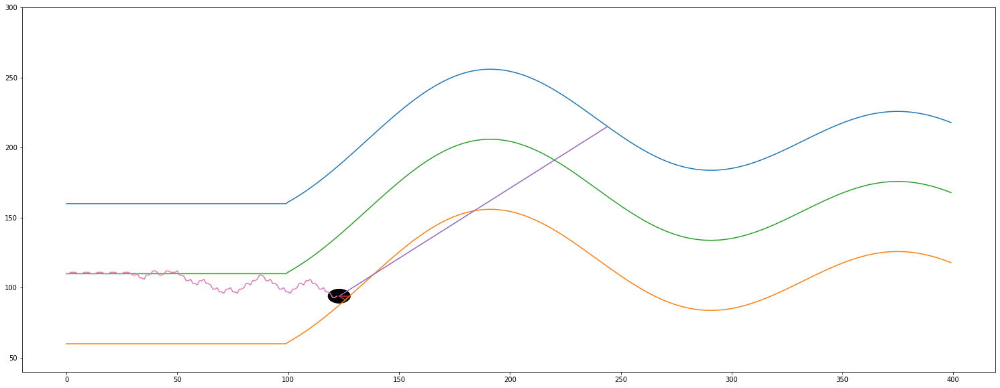

------------------------------ IF i % 3 == 0 ------------------------------
# i =  123
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (124, 3)
y.shape =  (124, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


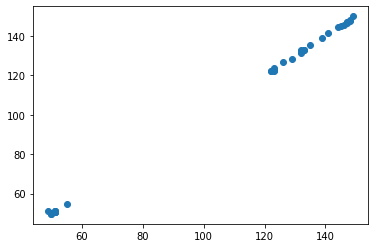

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00174934 0.75759477]]


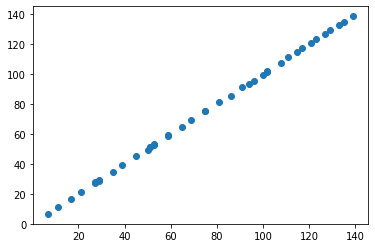

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00367943 0.71020809]]


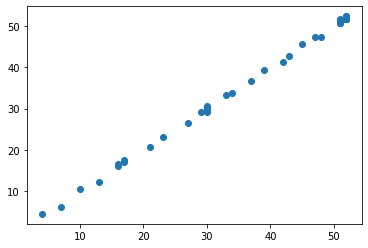

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.07603612]]
-------- 1 y up ->  center =  [[1.58600067]]
-------- 1 y up ->  right  =  [[1.53648497]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[122  -3]]
		 _X_center =  [[ 6 -3]]
		 _X_right  =  [[ 4 -3]]
		 predicted_left   =  [[124.45719718]]
		 predicted_center =  [[3.5643683]]
		 predicted_right  =  [[1.7066909]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00270505 -0.80148042]]
		 regression_center.coef_ =  [[1.00174934 0.75759477]]
		 regression_right.coef_  =  [[1.0036

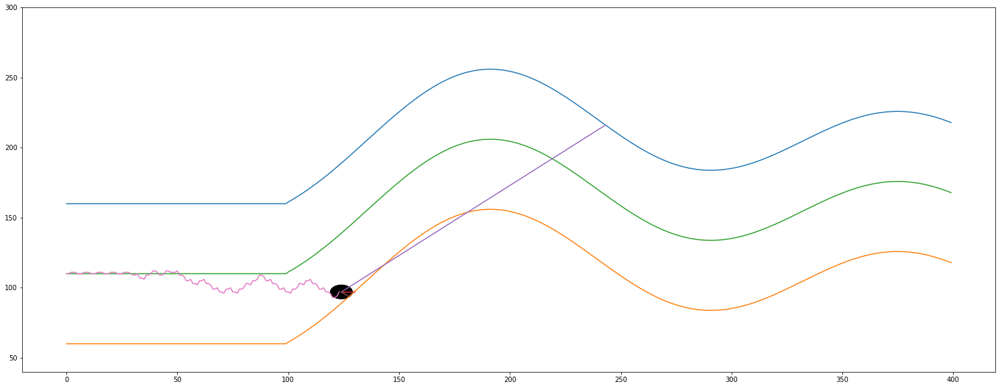

------------------------------ IF i % 3 == 1 ------------------------------
# i =  124
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[120   7   4]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.71       0.00746269 0.        ]]
actual predicted =  [10.40576375]
actual self.y_distance[-1] =  11.38369589240157
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.040816326

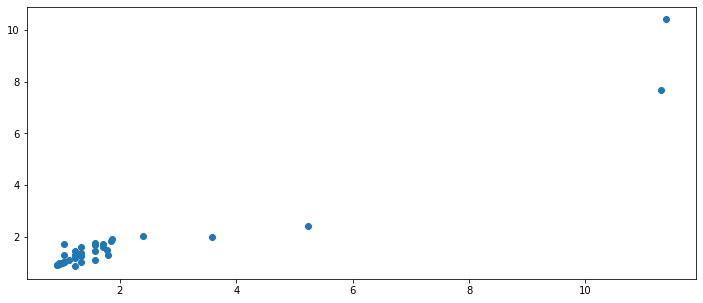

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  124
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1.]
(41, 4)
(41, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91.,  51.

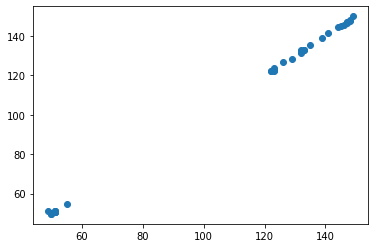

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00174934 0.75759477]]


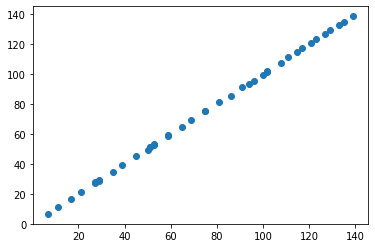

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00367943 0.71020809]]


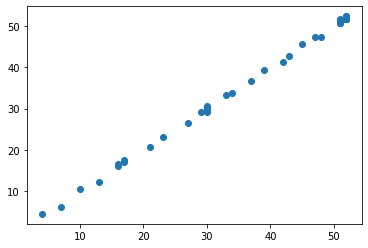

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.07603612]]
-------- 1 y up ->  center =  [[1.58600067]]
-------- 1 y up ->  right  =  [[1.53648497]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[120  -3]]
		 _X_center =  [[ 7 -3]]
		 _X_right  =  [[ 4 -3]]
		 predicted_left   =  [[122.45178707]]
		 predicted_center =  [[4.56611764]]
		 predicted_right  =  [[1.7066909]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00270505 -0.80148042]]
		 regression_center.coef_ =  [[1.00174934 0.75759477]]
		 regression_right.coef_  =  [[1.003

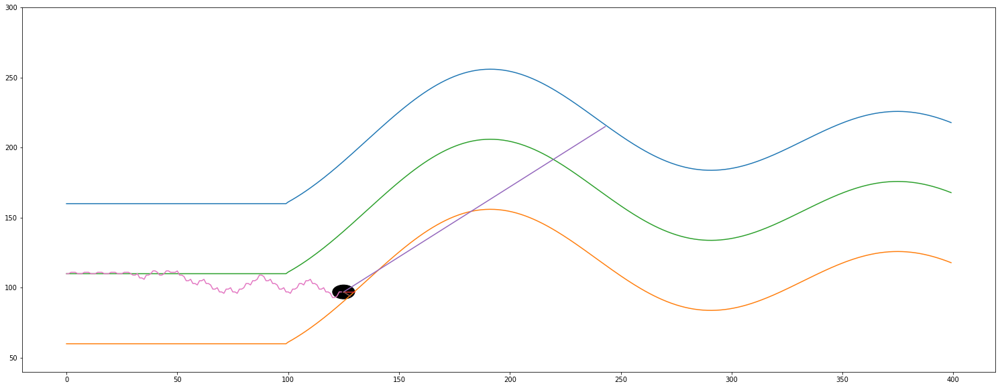

------------------------------ IF i % 3 == 2 ------------------------------
# i =  125
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down
Sensor center =  5
Sensor from left wall =  120
Sensor from right wall =  3
most távolsagra van a felső faltól =  94.30271133689249
most távolsagra van az alsó faltól =  5.697288663107514
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  125
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  16.55220876336223
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  126
			 len(self.sensor_left)   =  126
			 len(self.sensor_center) =  126
			 len(self.sensor_right)  =  126
			 self.x                  =  125
			 -------------- Teszt End --------------
self.y =  96.0
------------------------------ IF len(self.before) > 9 -------------------

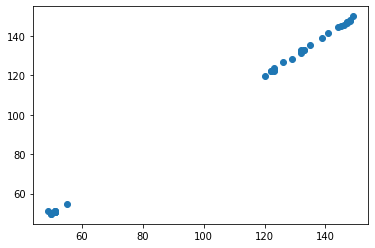

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00182904 0.75937894]]


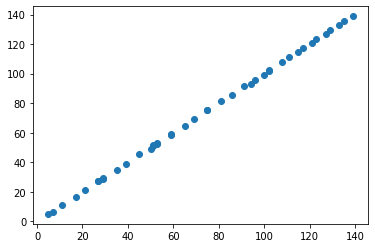

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00406508 0.71312426]]


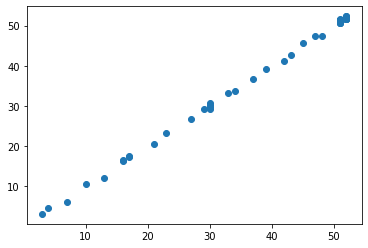

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.07934177]]
-------- 1 y up ->  center =  [[1.58015577]]
-------- 1 y up ->  right  =  [[1.52284035]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[120  -3]]
		 _X_center =  [[ 5 -3]]
		 _X_right  =  [[ 3 -3]]
		 predicted_left   =  [[122.46691192]]
		 predicted_center =  [[2.54995619]]
		 predicted_right  =  [[0.67847345]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00273861 -0.80508988]]
		 regression_center.coef_ =  [[1.00182904 0.75937894]]
		 regression_right.coef_  =  [[1.00

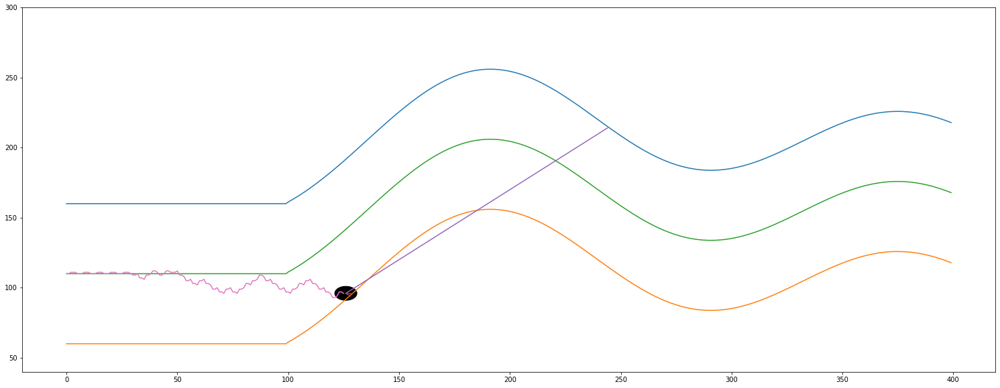

------------------------------ IF i % 3 == 0 ------------------------------
# i =  126
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (127, 3)
y.shape =  (127, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 54 104  48]
 [ 54 103  48]
 [ 55 101  47]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 49 101  53]
 [ 49 100  53]
 [ 50  99  52]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 49  95  53]
 [ 49  94  53]
 [ 50  93  52]
 [ 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


------------------------------ IF len(self.before) > 9 ------------------------------


# i =  126
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.]
(42, 4)
(42, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91., 

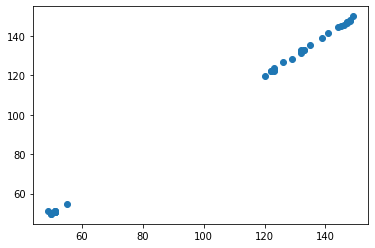

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00182904 0.75937894]]


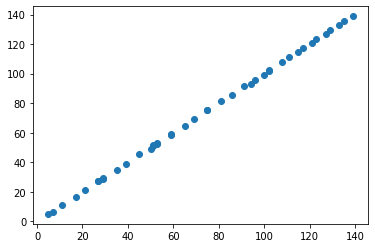

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00406508 0.71312426]]


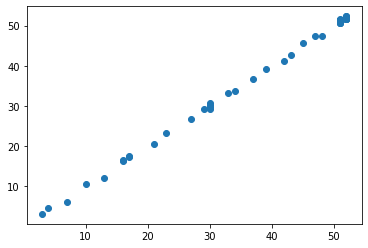

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.07934177]]
-------- 1 y up ->  center =  [[1.58015577]]
-------- 1 y up ->  right  =  [[1.52284035]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[119  -3]]
		 _X_center =  [[ 4 -3]]
		 _X_right  =  [[ 3 -3]]
		 predicted_left   =  [[121.46417331]]
		 predicted_center =  [[1.54812715]]
		 predicted_right  =  [[0.67847345]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00273861 -0.80508988]]
		 regression_center.coef_ =  [[1.00182904 0.75937894]]
		 regression_right.coef_  =  [[1.00

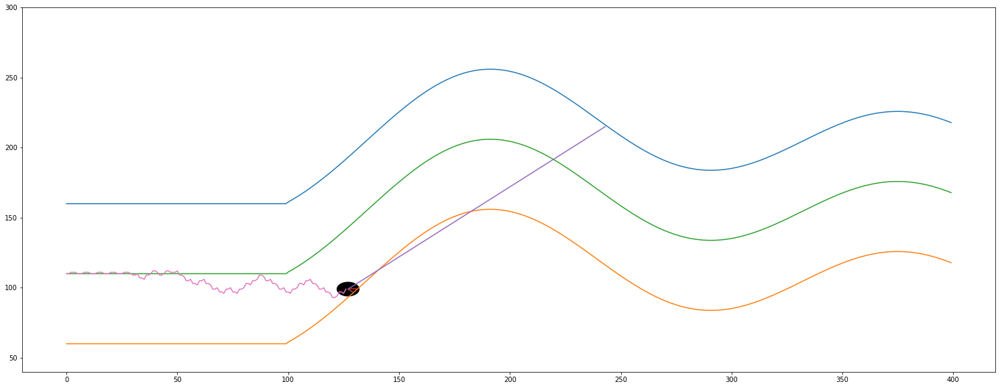

------------------------------ IF i % 3 == 1 ------------------------------
# i =  127
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[117   5   3]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.68       0.00735294 0.        ]]
actual predicted =  [19.86657563]
actual self.y_distance[-1] =  15.91856914112535
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.127659574468085, 1.127659574468085, 1.173913043478261, 1.040816326

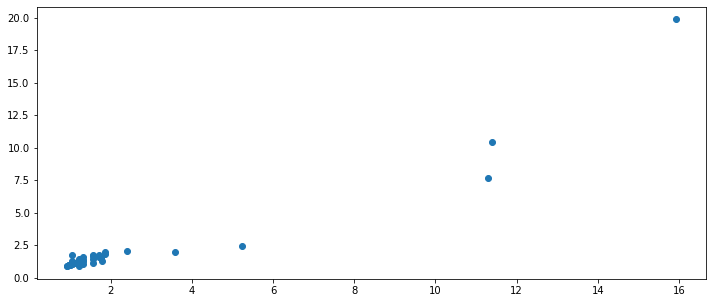

------------------------------ IF len(self.before) > 9 ------------------------------


# i =  127
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.]
(42, 4)
(42, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([107.,  54., 103.,  48.]), array([109.,  52., 101.,  50.]), array([112.,  49., 100.,  53.]), array([109.,  52.,  95.,  50.]), array([112.,  49.,  94.,  53.]), array([111.,  52.,  91., 

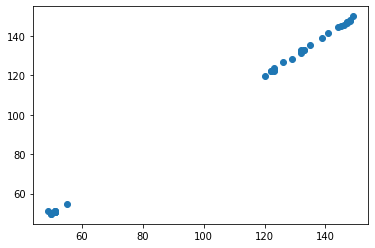

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00182904 0.75937894]]


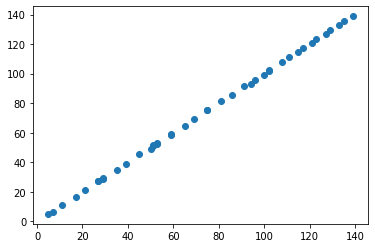

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00406508 0.71312426]]


KeyboardInterrupt: ignored

In [8]:
auto.run()

In [ ]:
 auto.

<a name="irodalom"></a>

# Felhasznált irodalom és internetes cimek

Itt gyűjtöttem össze a menet közben összegyűjt okosságokat

[vissza a tartalomhoz](#tartalom)<br>

Scikit-learn - MLPRegressor API
<br>
https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html


Fogalmak és probléma meghatározás
<br>
https://www.rubrik.com/blog/architecture/20/12/customized-autoscaling--minimize-your-cloud-cost


https://github.com/kubernetes/autoscaler/blob/master/cluster-autoscaler/FAQ.md#what-are-the-parameters-to-ca

https://arxiv.org/pdf/1608.04030.pdf

Metrikák amivel a szollgáltatás minőségét mérik különböző esetekben
<br>
https://blog.avinetworks.com/autoscaling-metrics

------------

NumPy API Reference Guide
<br>
https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html


Seaborn API Reference Guide
<br>
https://seaborn.pydata.org/examples/pair_grid_with_kde.html

